# Load Library

In [1]:
%load_ext autoreload
%autoreload 2

In [1]:
import warnings

warnings.filterwarnings('ignore')

In [2]:
from tqdm import tqdm
import os
import data_utils
import model_utils
from model_utils import train_torch_model, test_torch_model, port_mlp_to_ch, port_ch_to_mlp, proxy_train_mlp, get_CSMIA_case_by_case_results, CSMIA_attack
from data_utils import oneHotCatVars
from whitebox_attack import neuron_output, make_neuron_output_data, roc_curve_plot, get_LOMIA_case_1_correct_examples, Top10CorrNeurons, wb_corr_attacks
from disparate_vulnerability_utils import get_accuracy, get_indices_by_conditions, subgroup_vulnerability_distance_vector, subgroup_vulnerability_distance, get_subgroup_disparity, plot_subgroup_disparity, improved_subgroup_attack, get_subgroup_disparity_baseline, get_top_dist_indices, get_disparity_by_subgroup
import shap
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn.neural_network._base import ACTIVATIONS
from sklearn.model_selection import train_test_split
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.metrics import roc_curve, auc, roc_auc_score, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.decomposition import PCA
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns
import tabulate
import pickle
# import utils
import copy

# Load Data

In [3]:
class MIAExperiment:
    def __init__(self, *args, **kwargs):
        self.sampling_condition_dict_list = kwargs.get('sampling_condition_dict_list', None)
        self.sensitive_column = kwargs.get('sensitive_column', 'MAR')

        for key, value in kwargs.items():
            setattr(self, key, value)

        if not hasattr(self, 'name'):
            self.name = 'Census19'
        self.ds = data_utils.CensusWrapper(
                    filter_prop="none", ratio=float(0.5), split="all", name=self.name, sampling_condition_dict_list=self.sampling_condition_dict_list, sensitive_column=self.sensitive_column,
                    additional_meta=None)
        (self.x_tr, self.y_tr), (self.x_te, self.y_te), self.cols = self.ds.load_data()
        self.X_train = pd.DataFrame(self.x_tr, columns=self.cols)
        self.X_test = pd.DataFrame(self.x_te, columns=self.cols)
        self.y_tr_onehot = self.ds.ds.y_enc.transform(self.y_tr).toarray()
        self.y_te_onehot = self.ds.ds.y_enc.transform(self.y_te).toarray()

    def __str__(self):
        return self.ds.ds.filenameroot
    
    def __repr__(self):
        return self.ds.ds.filenameroot
    
    def get_value_count_report(self):
        df = self.ds.ds.original_df
        df = df[df['is_train'] == 1]
        subgroup_values = df[self.subgroup_column].unique().tolist()
        for value in subgroup_values:
            print(f"Subgroup: {value}")
            # print(df[df[self.subgroup_column] == value].columns)
            # print(df[df[self.subgroup_column] == value][[self.sensitive_column, self.y_column]])
            new_df = df[df[self.subgroup_column] == value][[self.sensitive_column, self.y_column]]
            print(new_df.value_counts())
            # print(df[df[self.subgroup_column == value]][[self.sensitive_column, self.y_column]].corr())


    def get_mutual_information_between_sens_and_y(self):
        df = self.ds.ds.original_df
        df = df[df['is_train'] == 1]
        subgroup_values = df[self.subgroup_column].unique().tolist()
        mutual_info_dict = {}
        for value in subgroup_values:
            print(f"Subgroup: {value}")
            # All the features except y column
            X = df[df[self.subgroup_column] == value].drop([self.y_column], axis=1)
            y = df[df[self.subgroup_column] == value][[self.y_column]]
            # print(mutual_info_classif(X, y, discrete_features=True))
            mutual_info_dict[value] = mutual_info_classif(X, y, discrete_features=True)
        return mutual_info_dict

In [22]:
experiments = { f"corr_btn_sens_and_out_{(i, j)}":  MIAExperiment(sampling_condition_dict_list = 
    {
            'correlation': 0,
            'subgroup_col_name': 'SEX',
            'marginal_prior': 1,
            'corr_btn_sens_and_output_per_subgroup': (i, j),
            # 'fixed_corr_in_test_data': True
    }, shortname = f"Corr_btn_sens_and_output_for_male_({i})_for_female_({j})"
) for i in [-0.4, -0.3, -0.2, -0.1, 0][2:4] for j in [-0.4, -0.3, -0.2, -0.1, 0][2:4]}

In [ ]:
for experiment_key in experiments:
    get_corr_btn_sens_and_output_per_subgroup(experiments[experiment_key])

# Load and Train Target Model

In [23]:
save_model = True

for experiment_key in experiments:
    experiment = experiments[experiment_key]
    print(f"Training classifier for experiment: {experiment}")
    try:
        experiment.clf = model_utils.load_model(f'<PATH_TO_MODEL>/{experiment.ds.ds.filenameroot}_target_model.pkl')
        print(f"Loaded classifier for experiment from file: {experiment}")
    except:
        # clf = model_utils.get_model(max_iter=500, hidden_layer_sizes=(256, 256))
        experiment.clf = model_utils.get_model(max_iter=500)
        experiment.clf.fit(experiment.X_train, experiment.y_tr_onehot)

        if save_model:
            model_utils.save_model(experiment.clf, f'<PATH_TO_MODEL>/{experiment.ds.ds.filenameroot}_target_model.pkl')

Training classifier for experiment: Census19_correlation_0_subgroup_col_name_SEX_marginal_prior_1_corr_btn_sens_and_output_per_subgroup_LPAREN-0.2, -0.2RPAREN
Loaded classifier for experiment from file: Census19_correlation_0_subgroup_col_name_SEX_marginal_prior_1_corr_btn_sens_and_output_per_subgroup_LPAREN-0.2, -0.2RPAREN
Training classifier for experiment: Census19_correlation_0_subgroup_col_name_SEX_marginal_prior_1_corr_btn_sens_and_output_per_subgroup_LPAREN-0.2, -0.1RPAREN
Loaded classifier for experiment from file: Census19_correlation_0_subgroup_col_name_SEX_marginal_prior_1_corr_btn_sens_and_output_per_subgroup_LPAREN-0.2, -0.1RPAREN
Training classifier for experiment: Census19_correlation_0_subgroup_col_name_SEX_marginal_prior_1_corr_btn_sens_and_output_per_subgroup_LPAREN-0.1, -0.2RPAREN
Loaded classifier for experiment from file: Census19_correlation_0_subgroup_col_name_SEX_marginal_prior_1_corr_btn_sens_and_output_per_subgroup_LPAREN-0.1, -0.2RPAREN
Training classifier fo

Train Target Model on test set only

In [24]:
save_model = True

for experiment_key in experiments:
    experiment = experiments[experiment_key]
    print(f"Training classifier for experiment: {experiment}")
    try:
        experiment.clf_only_on_test = model_utils.load_model(f'<PATH_TO_MODEL>/{experiment.ds.ds.filenameroot}_target_model_only_on_test.pkl')
        print(f"Loaded classifier for experiment from file: {experiment}")
    except:
        # clf = model_utils.get_model(max_iter=500, hidden_layer_sizes=(256, 256))
        experiment.clf_only_on_test = model_utils.get_model(max_iter=500)
        experiment.clf_only_on_test.fit(experiment.X_test, experiment.y_te_onehot)

        if save_model:
            model_utils.save_model(experiment.clf_only_on_test, f'<PATH_TO_MODEL>/{experiment.ds.ds.filenameroot}_target_model_only_on_test.pkl')

Training classifier for experiment: Census19_correlation_0_subgroup_col_name_SEX_marginal_prior_1_corr_btn_sens_and_output_per_subgroup_LPAREN-0.2, -0.2RPAREN
Loaded classifier for experiment from file: Census19_correlation_0_subgroup_col_name_SEX_marginal_prior_1_corr_btn_sens_and_output_per_subgroup_LPAREN-0.2, -0.2RPAREN
Training classifier for experiment: Census19_correlation_0_subgroup_col_name_SEX_marginal_prior_1_corr_btn_sens_and_output_per_subgroup_LPAREN-0.2, -0.1RPAREN
Loaded classifier for experiment from file: Census19_correlation_0_subgroup_col_name_SEX_marginal_prior_1_corr_btn_sens_and_output_per_subgroup_LPAREN-0.2, -0.1RPAREN
Training classifier for experiment: Census19_correlation_0_subgroup_col_name_SEX_marginal_prior_1_corr_btn_sens_and_output_per_subgroup_LPAREN-0.1, -0.2RPAREN
Loaded classifier for experiment from file: Census19_correlation_0_subgroup_col_name_SEX_marginal_prior_1_corr_btn_sens_and_output_per_subgroup_LPAREN-0.1, -0.2RPAREN
Training classifier fo

Train Target Model on both train set and test set

In [ ]:
save_model = True

for experiment_key in experiments:
    experiment = experiments[experiment_key]
    print(f"Training classifier for experiment: {experiment}")
    try:
        experiment.clf = model_utils.load_model(f'<PATH_TO_MODEL>/{experiment.ds.ds.filenameroot}_target_model.pkl')
        print(f"Loaded classifier for experiment from file: {experiment}")
    except:
        # clf = model_utils.get_model(max_iter=500, hidden_layer_sizes=(256, 256))
        experiment.clf = model_utils.get_model(max_iter=500)
        experiment.clf.fit(experiment.X_train, experiment.y_tr_onehot)

        if save_model:
            model_utils.save_model(experiment.clf, f'<PATH_TO_MODEL>/{experiment.ds.ds.filenameroot}_target_model.pkl')

# Fed Training

In [31]:
import re

def get_perf(input_string):

    # Use regular expression to extract the number inside parenthesis
    match = re.search(r'\(([\d.]+)\)', input_string)

    if match:
        extracted_number = match.group(1)
        return(float(extracted_number))
    else:
        return(np.nan)

Local Model Training

In [28]:

for experiment_key in experiments:
    experiment = experiments[experiment_key]
    sensitive_values = experiment.ds.ds.meta['sensitive_values']
    experiment.local_models = {
        i: copy.deepcopy(experiment.clf_only_on_test) for i in [0, 1]
    }

    experiment.local_benign_data = {
        'X': experiment.X_train,
        'y_onehot': experiment.y_tr_onehot,
        'y': experiment.y_tr
    }

    experiment.local_models[0].partial_fit(experiment.local_benign_data['X'], experiment.local_benign_data['y_onehot'], classes=np.unique(experiment.local_benign_data['y']))

    experiment.X_train_sensitive_flipped = experiment.X_train.copy()
    experiment.X_train_sensitive_flipped[[f"{experiment.sensitive_column}_{i}" for i in sensitive_values]] = 1 - experiment.X_train_sensitive_flipped[[f"{experiment.sensitive_column}_{i}" for i in sensitive_values]]

    experiment.y_tr_onehot_flipped = 1 - experiment.y_tr_onehot
    experiment.y_tr_flipped = 1 - experiment.y_tr

    experiment.local_malicious_data = {
        'X': pd.concat([experiment.X_train, experiment.X_train_sensitive_flipped], axis=0).reset_index(drop=True),
        'y_onehot': np.concatenate([experiment.y_tr_onehot, experiment.y_tr_onehot_flipped], axis=0),
        'y': np.concatenate([experiment.y_tr, experiment.y_tr_flipped], axis=0)
    }

    experiment.local_models[1].partial_fit(experiment.local_malicious_data['X'], experiment.local_malicious_data['y_onehot'], classes=np.unique(experiment.local_malicious_data['y']))

    experiment.global_models = {}
    for lambda_mal_contrib in [0, 1, 2, 4, 8, 16]:
        experiment.global_models[lambda_mal_contrib] = copy.deepcopy(experiment.clf_only_on_test)

        for i in range(len(experiment.global_models[lambda_mal_contrib].coefs_)):
            experiment.global_models[lambda_mal_contrib].coefs_[i] = (experiment.local_models[0].coefs_[i] + lambda_mal_contrib * experiment.local_models[1].coefs_[i])/(1 + lambda_mal_contrib)
            experiment.global_models[lambda_mal_contrib].intercepts_[i] = (experiment.local_models[0].intercepts_[i] + lambda_mal_contrib * experiment.local_models[1].intercepts_[i])/ (1 + lambda_mal_contrib)

In [26]:

for metric in ['precision', 'recall', 'f1', 'accuracy', 'mcc', 'gmean', 'fpr'][2:4]:
    for experiment_key in experiments:
        experiment = experiments[experiment_key]
        print(f"\n{experiment.shortname}")
        result = get_CSMIA_case_by_case_results(experiment.clf, experiment.X_train, experiment.y_tr, experiment.ds, subgroup_col_name='SEX', metric=metric)
        print(result)
    print(f'\n\n() shows the performance on metric {metric}')
    # print('-'*50)
    print('\n\n')
    


Corr_btn_sens_and_output_for_male_(-0.2)_for_female_(-0.2)
                              1                0
Case 1            997 (63.8049)    963 (63.6993)
Case 2           9687 (55.8578)   9388 (56.6227)
Case 3           1816 (58.2609)   2149 (57.6302)
Case All Cases  12500 (56.8048)  12500 (57.3345)

Corr_btn_sens_and_output_for_male_(-0.2)_for_female_(-0.1)
                              1                0
Case 1            953 (62.9259)    946 (64.7969)
Case 2            9605 (56.526)   9364 (55.1146)
Case 3           1942 (55.9913)    2190 (56.687)
Case All Cases  12500 (56.9381)  12500 (56.1103)

Corr_btn_sens_and_output_for_male_(-0.1)_for_female_(-0.2)
                              1                0
Case 1            868 (62.5414)    895 (66.9315)
Case 2           9752 (59.3551)   9317 (58.3186)
Case 3           1880 (56.4159)    2288 (53.985)
Case All Cases  12500 (59.1646)  12500 (58.2282)

Corr_btn_sens_and_output_for_male_(-0.1)_for_female_(-0.1)
                         

In [35]:

male_results = {}
female_results = {}
for metric in ['precision', 'recall', 'f1', 'accuracy', 'mcc', 'gmean', 'fpr'][2:4]:
    male_results[metric] = {}
    female_results[metric] = {}
    print(f'\n\n() shows the performance on metric {metric}')
    for experiment_key in experiments:
        experiment = experiments[experiment_key]
        print(f"\n{experiment.shortname}")
        male_results[metric][experiment_key] = []
        female_results[metric][experiment_key] = []
        for lambda_mal_contrib in [0,1,2,4,8,16]:
            print(f"lambda_mal_contrib: {lambda_mal_contrib}")
            result = get_CSMIA_case_by_case_results(experiment.global_models[lambda_mal_contrib], experiment.X_train, experiment.y_tr, experiment.ds, subgroup_col_name='SEX', metric=metric)
            print(result)
            male_results[metric][experiment_key].append(get_perf(result.loc['Case All Cases', 0]))
            female_results[metric][experiment_key].append(get_perf(result.loc['Case All Cases', 1]))
    print('\n\n')
    print('-'*50)
    



() shows the performance on metric f1

Corr_btn_sens_and_output_for_male_(-0.2)_for_female_(-0.2)
lambda_mal_contrib: 0
                              1                0
Case 1            909 (51.4917)   1225 (53.9326)
Case 2           9507 (55.4799)   8905 (51.6203)
Case 3           2084 (52.6957)   2370 (52.8376)
Case All Cases  12500 (54.6937)  12500 (52.1323)
lambda_mal_contrib: 1
                              1                0
Case 1           2215 (56.3636)   2275 (55.4862)
Case 2           8343 (60.5273)   7817 (59.3282)
Case 3           1942 (50.2543)   2408 (50.4321)
Case All Cases  12500 (58.1298)  12500 (56.7658)
lambda_mal_contrib: 2
                              1               0
Case 1           3494 (56.5346)  3212 (58.8561)
Case 2           7079 (61.0775)  6766 (58.2039)
Case 3           1927 (52.8056)  2522 (54.7878)
Case All Cases  12500 (58.4903)  12500 (57.587)
lambda_mal_contrib: 4
                              1                0
Case 1           5297 (58.1186)  

In [40]:
experiment_key.find(',')

27

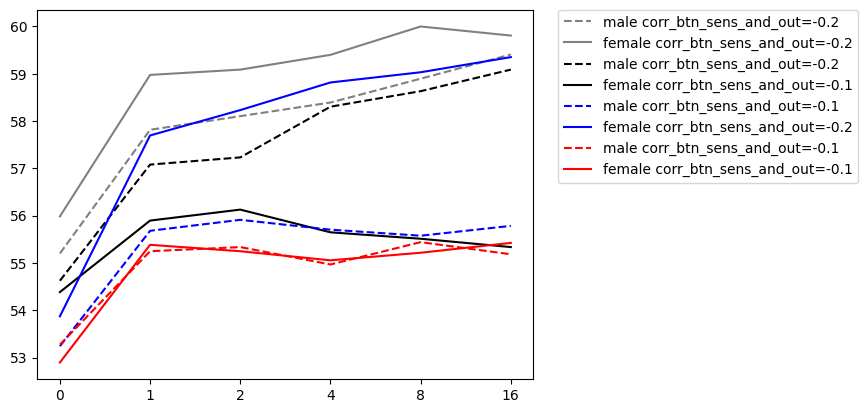

In [43]:
metric = 'accuracy'

colors = ['red', 'blue', 'black', 'gray']
for experiment_key in experiments:
    color=colors.pop()
    sns.lineplot(x=["0","1","2","4","8","16"], y=male_results[metric][experiment_key], label=f"male corr_btn_sens_and_out={experiment_key[23:27]}", color=color, linestyle='dashed')
    sns.lineplot(x=["0","1","2","4","8","16"], y=female_results[metric][experiment_key], label=f"female corr_btn_sens_and_out={experiment_key[29:33]}", color=color)

# place the legends outside the figure/plot
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# sns.lineplot(x=male_corr_list, y=case_2_results_for_clf_only_on_test_for_male[metric], label='Model trained only on benign data')
# sns.lineplot(x=male_corr_list, y=case_2_results_for_clf_on_both_train_and_test_for_male[metric], label='Model trained on both benign and adversary data')
# plt.ylabel(f"attack {metric} on male subgroup for case 2")
# plt.xlabel('Corr btn sensitive attrib and output for male in adversary data')
# plt.xticks(male_corr_list)
# plt.legend()
# plt.show()
# print(f'Corr btn sensitive attrib and output for female in adversary data: {female_corr_list[0]}')
# print(f'Corr btn sensitive attrib and output for male in benign data: {-0.2}')
# print(f'Corr btn sensitive attrib and output for female in benign data: {-0.1}')
# for idx, experiment_key in enumerate([f"corr_btn_sens_and_out_{(i, j)}" for i in male_corr_list for j in female_corr_list]):
#     experiment = experiments[experiment_key]
#     print(f"\n{male_corr_list[idx]}\n")
#     experiment.get_value_count_report()

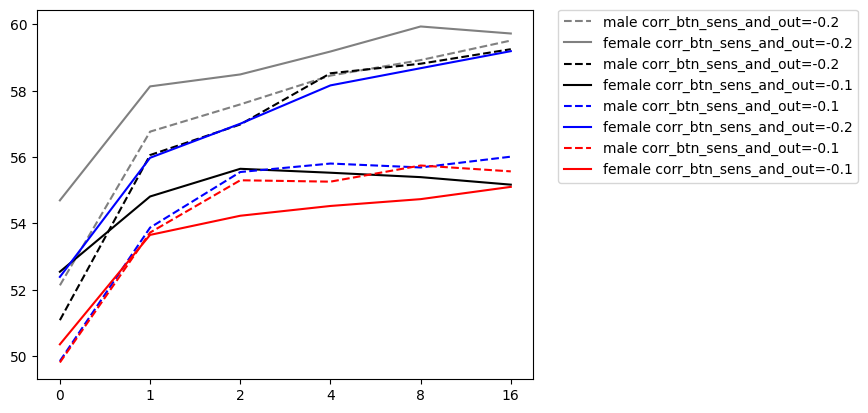

In [44]:
metric = 'f1'

colors = ['red', 'blue', 'black', 'gray']
for experiment_key in experiments:
    color=colors.pop()
    sns.lineplot(x=["0","1","2","4","8","16"], y=male_results[metric][experiment_key], label=f"male corr_btn_sens_and_out={experiment_key[23:27]}", color=color, linestyle='dashed')
    sns.lineplot(x=["0","1","2","4","8","16"], y=female_results[metric][experiment_key], label=f"female corr_btn_sens_and_out={experiment_key[29:33]}", color=color)

# place the legends outside the figure/plot
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# sns.lineplot(x=male_corr_list, y=case_2_results_for_clf_only_on_test_for_male[metric], label='Model trained only on benign data')
# sns.lineplot(x=male_corr_list, y=case_2_results_for_clf_on_both_train_and_test_for_male[metric], label='Model trained on both benign and adversary data')
# plt.ylabel(f"attack {metric} on male subgroup for case 2")
# plt.xlabel('Corr btn sensitive attrib and output for male in adversary data')
# plt.xticks(male_corr_list)
# plt.legend()
# plt.show()
# print(f'Corr btn sensitive attrib and output for female in adversary data: {female_corr_list[0]}')
# print(f'Corr btn sensitive attrib and output for male in benign data: {-0.2}')
# print(f'Corr btn sensitive attrib and output for female in benign data: {-0.1}')
# for idx, experiment_key in enumerate([f"corr_btn_sens_and_out_{(i, j)}" for i in male_corr_list for j in female_corr_list]):
#     experiment = experiments[experiment_key]
#     print(f"\n{male_corr_list[idx]}\n")
#     experiment.get_value_count_report()

In [36]:
male_results

{'f1': {'corr_btn_sens_and_out_(-0.2, -0.2)': [52.1323,
   56.7658,
   57.587,
   58.4551,
   58.9223,
   59.5117],
  'corr_btn_sens_and_out_(-0.2, -0.1)': [51.0825,
   56.0596,
   56.9819,
   58.5249,
   58.8132,
   59.251],
  'corr_btn_sens_and_out_(-0.1, -0.2)': [49.8498,
   53.8724,
   55.5484,
   55.8039,
   55.6859,
   56.0108],
  'corr_btn_sens_and_out_(-0.1, -0.1)': [49.8067,
   53.7234,
   55.2994,
   55.2579,
   55.7445,
   55.5679]},
 'accuracy': {'corr_btn_sens_and_out_(-0.2, -0.2)': [55.2,
   57.816,
   58.104,
   58.392,
   58.896,
   59.408],
  'corr_btn_sens_and_out_(-0.2, -0.1)': [54.624,
   57.08,
   57.232,
   58.304,
   58.632,
   59.088],
  'corr_btn_sens_and_out_(-0.1, -0.2)': [53.24,
   55.68,
   55.912,
   55.704,
   55.576,
   55.784],
  'corr_btn_sens_and_out_(-0.1, -0.1)': [53.272,
   55.248,
   55.336,
   54.968,
   55.44,
   55.184]}}

In [17]:
for metric in ['precision', 'recall', 'f1', 'accuracy', 'mcc', 'gmean', 'fpr'][2:4]:
    for experiment_key in experiments:
        experiment = experiments[experiment_key]
        print(f"\n{experiment.shortname}")
        print(get_CSMIA_case_by_case_results(experiment.global_models[0], experiment.X_train, experiment.y_tr, experiment.ds, subgroup_col_name='SEX', metric=metric))
    print(f'\n\n() shows the performance on metric {metric}')
    # print('-'*50)
    print('\n\n')
    


Corr_btn_sens_and_output_for_male_(-0.2)_for_female_(-0.1)


KeyError: 0

In [ ]:
get_CSMIA_case_by_case_results(experiment.global_models[0], experiment.X_train, experiment.y_tr, experiment.ds, subgroup_col_name='SEX', )

In [21]:
experiment.y_tr_onehot.shape

(25000, 2)

In [28]:
(experiment.local_models[0].coefs_[0] + experiment.local_models[1].coefs_[0])/2

array([[-2.34626830e-01,  9.90741932e-02,  3.73074411e-01, ...,
        -6.87956122e-01, -1.57009531e-01, -1.13387937e+00],
       [-2.38223690e-02,  3.70232164e-01,  7.64915161e-01, ...,
         1.62245265e-01, -1.58475937e-01, -5.71148082e-01],
       [-1.44000570e-01, -3.92409527e-01, -2.54977371e-01, ...,
         2.32099830e-01,  1.85265834e-01, -7.97082694e-02],
       ...,
       [-1.37339527e-01, -4.21088203e-01, -8.08871183e-01, ...,
        -7.51691923e-01,  6.56903162e-01,  2.22379785e-01],
       [-3.85117276e-01, -6.10647253e-01, -1.92229810e-01, ...,
        -4.81681308e-01, -7.34277338e-02, -1.98603850e-01],
       [ 4.59868768e-01, -5.35668108e-01,  1.01506559e+00, ...,
         5.75105425e-02, -1.96885101e-06,  4.01470396e-01]])

# CSMIA: Case by case comparison over multiple metrics

In [30]:
import re

def get_perf(input_string):

    # Use regular expression to extract the number inside parenthesis
    match = re.search(r'\(([\d.]+)\)', input_string)

    if match:
        extracted_number = match.group(1)
        return(float(extracted_number))
    else:
        return(np.nan)

In [71]:
for metric in ['precision', 'recall', 'f1', 'accuracy', 'mcc', 'gmean', 'fpr'][3:4]:
    for experiment_key in [f"corr_btn_sens_and_out_{(i, j)}" for i in [-0.4, -0.3, -0.2, -0.1, 0] for j in [-0.1]]:
        experiment = experiments[experiment_key]
        print(f"\n{experiment.shortname}")
        print(get_CSMIA_case_by_case_results(experiment.clf, experiment.X_train, experiment.y_tr, experiment.ds, subgroup_col_name='SEX', metric = metric))
    print(f'\n\n() shows the performance on metric {metric}')
    print('-'*50)
    print('\n\n')


Corr_btn_sens_and_output_for_male_(-0.4)_for_female_(-0.1)
                              1                0
Case 1           2199 (54.3884)    4599 (63.666)
Case 2          18426 (53.7067)  16685 (68.4747)
Case 3           4375 (52.5486)    3716 (54.225)
Case All Cases   25000 (53.564)   25000 (65.472)

Corr_btn_sens_and_output_for_male_(-0.3)_for_female_(-0.1)
                              1                0
Case 1           2316 (53.2815)   3072 (55.7943)
Case 2          18374 (51.3552)  17450 (61.6676)
Case 3           4310 (52.5058)   4478 (50.8486)
Case All Cases   25000 (51.732)   25000 (59.008)

Corr_btn_sens_and_output_for_male_(-0.2)_for_female_(-0.1)
                              1                0
Case 1           1927 (53.2953)   2239 (52.5681)
Case 2          18703 (48.8264)  17773 (50.8524)
Case 3           4370 (52.2197)   4988 (52.3456)
Case All Cases   25000 (49.764)   25000 (51.304)

Corr_btn_sens_and_output_for_male_(-0.1)_for_female_(-0.1)
                         

In [69]:
for metric in ['precision', 'recall', 'f1', 'accuracy', 'mcc', 'gmean', 'fpr'][:6]:
    for experiment_key in [f"corr_btn_sens_and_out_{(i, j)}" for j in [-0.4, -0.3, -0.2, -0.1, 0] for i in [-0.2]]:
        experiment = experiments[experiment_key]
        print(f"\n{experiment.shortname}")
        print(get_CSMIA_case_by_case_results(experiment.clf, experiment.X_train, experiment.y_tr, experiment.ds, subgroup_col_name='SEX', metric = metric))
    print(f'\n\n() shows the performance on metric {metric}')
    print('-'*50)
    print('\n\n')


Corr_btn_sens_and_output_for_male_(-0.2)_for_female_(-0.4)
                              1                0
Case 1           5124 (67.3749)    2678 (56.305)
Case 2          16874 (68.3098)   17513 (56.881)
Case 3            3002 (60.905)    4809 (53.599)
Case All Cases  25000 (67.3293)  25000 (56.2103)

Corr_btn_sens_and_output_for_male_(-0.2)_for_female_(-0.3)
                              1                0
Case 1           3318 (64.9651)   2755 (58.6524)
Case 2           17862 (58.551)   17536 (53.114)
Case 3           3820 (58.7232)   4709 (52.9545)
Case All Cases  25000 (59.4275)  25000 (53.6618)

Corr_btn_sens_and_output_for_male_(-0.2)_for_female_(-0.2)
                              1                0
Case 1            2448 (58.009)   2657 (55.5478)
Case 2          18369 (53.0281)  17390 (50.3808)
Case 3           4183 (54.1401)   4953 (54.9538)
Case All Cases  25000 (53.6727)  25000 (51.7849)

Corr_btn_sens_and_output_for_male_(-0.2)_for_female_(-0.1)
                         

In [70]:
for metric in ['precision', 'recall', 'f1', 'accuracy', 'mcc', 'gmean', 'fpr'][:6]:
    for experiment_key in [f"corr_btn_sens_and_out_{(i, i)}" for i in [-0.4, -0.3, -0.2, -0.1, 0]]:
        experiment = experiments[experiment_key]
        print(f"\n{experiment.shortname}")
        print(get_CSMIA_case_by_case_results(experiment.clf, experiment.X_train, experiment.y_tr, experiment.ds, subgroup_col_name='SEX', metric = metric))
    print(f'\n\n() shows the performance on metric {metric}')
    print('-'*50)
    print('\n\n')


Corr_btn_sens_and_output_for_male_(-0.4)_for_female_(-0.4)
                              1                0
Case 1           4733 (68.5214)   4718 (67.1665)
Case 2          17131 (62.9279)  16574 (62.8589)
Case 3           3136 (63.6432)   3708 (61.2634)
Case All Cases   25000 (64.027)  25000 (63.4459)

Corr_btn_sens_and_output_for_male_(-0.3)_for_female_(-0.3)
                              1                0
Case 1           3157 (60.0124)   3216 (59.0909)
Case 2          18057 (61.2416)    17395 (61.01)
Case 3           3786 (56.8078)   4389 (57.6657)
Case All Cases  25000 (60.5961)  25000 (60.2327)

Corr_btn_sens_and_output_for_male_(-0.2)_for_female_(-0.2)
                              1                0
Case 1            2448 (58.009)   2657 (55.5478)
Case 2          18369 (53.0332)  17390 (50.3753)
Case 3           4183 (54.1401)   4953 (54.9538)
Case All Cases  25000 (53.6767)  25000 (51.7809)

Corr_btn_sens_and_output_for_male_(-0.1)_for_female_(-0.1)
                         

# Peel Case 1 Layer by Layer

In [8]:
def get_case_1_indices(clf, X_train, y_tr, ds):
    sens_pred, case_indices_dict = CSMIA_attack(clf, X_train, y_tr, ds.ds.meta)
    correct_indices = (sens_pred == X_train[['MAR_1']].to_numpy().ravel())
    case_1_indices = case_indices_dict[1]
    correct_case_1_indices = np.intersect1d(np.argwhere(correct_indices), np.argwhere(case_1_indices))
    print(f'Case 1 Examples: Total {sum(case_1_indices)}, Correct {len(correct_case_1_indices)}, Accuracy {[round(100 * len(correct_case_1_indices)/sum(case_1_indices), 4) if sum(case_1_indices) > 0 else 0][0]}')
    return case_1_indices

In [10]:
X_temp = X_train.copy()
y_temp_onehot = y_tr_onehot.copy()
y_temp = y_tr.copy()
clf_temp = clf
clf_prev = None
round_idx = 0
running_total = 0
random_state = 42
while True:
    round_idx += 1
    print(f'Round {round_idx}')
    case_1_indices = get_case_1_indices(clf_temp, X_temp, y_temp, ds)
    running_total += sum(case_1_indices)
    print(f'Running Total: {running_total}')
    if round_idx == 100:
        break
    X_temp = X_temp.drop(X_temp.index[case_1_indices])
    y_temp = np.delete(y_temp, case_1_indices, axis=0)
    y_temp_onehot = np.delete(y_temp_onehot, case_1_indices, axis=0)
    clf_prev = clf_temp
    try:
        clf_temp = model_utils.load_model(f'<PATH_TO_MODEL>/{ds.ds.filenameroot}_target_model_peeled_round_{round_idx}.pkl')
    except:
        random_state = 42
        idx = 0
        while True:
            clf_temp = model_utils.get_model(max_iter=500, random_state=random_state + idx)
            clf_temp.fit(X_temp, y_temp_onehot)

            case_1_indices = get_case_1_indices(clf_temp, X_temp, y_temp, ds)
            if sum(case_1_indices) > 0:
                break
            idx += 1

    # save model
    save_model = True
    if save_model and sum(case_1_indices) > 0:
        model_utils.save_model(clf_temp, f'<PATH_TO_MODEL>/{ds.ds.filenameroot}_target_model_peeled_round_{round_idx}.pkl')

Round 1
Case 1 Examples: Total 4609, Correct 3179, Accuracy 68.9737
Running Total: 4609
Case 1 Examples: Total 2268, Correct 1648, Accuracy 72.6631
Round 2
Case 1 Examples: Total 2268, Correct 1648, Accuracy 72.6631
Running Total: 6877
Case 1 Examples: Total 1441, Correct 1103, Accuracy 76.5441
Round 3
Case 1 Examples: Total 1441, Correct 1103, Accuracy 76.5441
Running Total: 8318
Case 1 Examples: Total 1068, Correct 827, Accuracy 77.4345
Round 4
Case 1 Examples: Total 1068, Correct 827, Accuracy 77.4345
Running Total: 9386
Case 1 Examples: Total 658, Correct 495, Accuracy 75.228
Round 5
Case 1 Examples: Total 658, Correct 495, Accuracy 75.228
Running Total: 10044
Case 1 Examples: Total 576, Correct 458, Accuracy 79.5139
Round 6
Case 1 Examples: Total 576, Correct 458, Accuracy 79.5139
Running Total: 10620
Case 1 Examples: Total 559, Correct 423, Accuracy 75.6708
Round 7
Case 1 Examples: Total 559, Correct 423, Accuracy 75.6708
Running Total: 11179
Case 1 Examples: Total 190, Correct 1

In [7]:
ds.ds.filenameroot

'Census19_RAC1P_50_50_minority_categorized_correlation_0_subgroup_col_name_SEX_corr_exp_idx_1'

In [10]:
get_case_1_indices(clf_temp, X_temp, y_temp, ds)

Case 1 Examples: Total 1173, Correct 690, Accuracy 58.8235


array([False, False, False, ..., False, False, False])

In [22]:
correct_indices

array([False, False, False, ..., False,  True, False])

In [26]:
case_1_indices

array([False, False, False, ..., False, False, False])

In [31]:
len(correct_case_1_indices)

3179

In [14]:
sum(case_1_indices)

4609

In [13]:
# train new clf without case 1 indices
new_clf = model_utils.get_model(max_iter=500)
new_clf.fit(X_train.loc[~case_1_indices], y_tr_onehot[~case_1_indices])

MLPClassifier(hidden_layer_sizes=(32, 16, 8), max_iter=500, random_state=42)

In [17]:
new_case_1_indices = CSMIA_attack(new_clf, X_train.loc[~case_1_indices], y_tr[~case_1_indices], ds.ds.meta)[1][1]

In [18]:
sum(new_case_1_indices)

2268

# Fairness Constraint

In [5]:
from sklearn.neural_network import MLPClassifier

class MLPClassifierFC(MLPClassifier):
    def fit(self, X, y, sample_weight=None):
        """
            Fit the model to the given data.
        """
        if sample_weight is not None:
            # resample data according to sample weights
            n_samples = X.shape[0]
            sample_weight = np.asarray(sample_weight)/np.sum(sample_weight)
            sample_idxs = np.random.choice(n_samples, n_samples, p=sample_weight)
            X = X.iloc[sample_idxs]
            y = y[sample_idxs]
            
        return super().fit(X, y)

clf2 = MLPClassifierFC(max_iter=500)
clf2.coefs_ = clf.coefs_
clf2.intercepts_ = clf.intercepts_

In [6]:
from fairlearn.reductions import ExponentiatedGradient, DemographicParity, EqualizedOdds, ErrorRate

subgroup_col_name = 'SEX'

try:
    mitigator = model_utils.load_model(f'<PATH_TO_MODEL>/{ds.ds.filenameroot}_mitigator_eqodds_{subgroup_col_name}.pkl')
except:
    constraint = EqualizedOdds()
    mitigator = ExponentiatedGradient(clf2, constraint)

    mitigator.fit(X_train, y_tr, sensitive_features=X_train[f'{subgroup_col_name}_0'])

    model_utils.save_model(mitigator, f'<PATH_TO_MODEL>/{ds.ds.filenameroot}_mitigator_eqodds_{subgroup_col_name}.pkl')

In [10]:
y_pred = mitigator.predict(X_train)

print("Accuracy on train set: ", accuracy_score(y_tr, y_pred))

y_pred = mitigator.predict(x_te)

print("Accuracy on test set: ", accuracy_score(y_te, y_pred))

Accuracy on train set:  0.88074
Accuracy on test set:  0.83758


X does not have valid feature names, but MLPClassifierFC was fitted with feature names
X does not have valid feature names, but MLPClassifierFC was fitted with feature names


In [9]:
y_pred_0 = mitigator.predict(X_train[X_train[f'{subgroup_col_name}_1'] == 0])

print("Accuracy on train set for subgroup 0: ", accuracy_score(y_tr[X_train[f'{subgroup_col_name}_1'] == 0], y_pred_0))

y_pred_1 = mitigator.predict(X_train[X_train[f'{subgroup_col_name}_1'] == 1])

print("Accuracy on train set for subgroup 1: ", accuracy_score(y_tr[X_train[f'{subgroup_col_name}_1'] == 1], y_pred_1))

Accuracy on train set for subgroup 0:  0.83956
Accuracy on train set for subgroup 1:  0.92132


In [10]:
X_test = pd.DataFrame(x_te, columns=cols)
y_te_onehot = ds.ds.y_enc.transform(y_te).toarray()

y_pred_0 = clf.predict(X_test[X_test[f'{subgroup_col_name}_1'] == 0])

print("Accuracy on train set for subgroup 0: ", accuracy_score(y_te_onehot[X_test[f'{subgroup_col_name}_1'] == 0], y_pred_0))

y_pred_1 = clf.predict(X_test[X_test[f'{subgroup_col_name}_1'] == 1])

print("Accuracy on train set for subgroup 1: ", accuracy_score(y_te_onehot[X_test[f'{subgroup_col_name}_1'] == 1], y_pred_1))

Accuracy on train set for subgroup 0:  0.82016
Accuracy on train set for subgroup 1:  0.88972


In [11]:
X_test = pd.DataFrame(x_te, columns=cols)
y_te_onehot = ds.ds.y_enc.transform(y_te).toarray()

y_pred_0 = mitigator.predict(X_test[X_test[f'{subgroup_col_name}_1'] == 0])
y_pred_1 = mitigator.predict(X_test[X_test[f'{subgroup_col_name}_1'] == 1])


print("WITH FAIRNESS CONSTRAINTS")
print("Recall on train set for subgroup MALE (Single): ", round(100 * recall_score(y_te_onehot[X_test[f'{subgroup_col_name}_1'] == 0].argmax(axis=1), y_pred_0, pos_label=1), 4))

print("Recall on train set for subgroup FEMALE (Single): ", round(100 * recall_score(y_te_onehot[X_test[f'{subgroup_col_name}_1'] == 1].argmax(axis=1), y_pred_1, pos_label=1), 4))
print("Recall on train set for subgroup MALE (Married): ", round(100 * recall_score(y_te_onehot[X_test[f'{subgroup_col_name}_1'] == 0].argmax(axis=1), y_pred_0, pos_label=0), 4))
print("Recall on train set for subgroup FEMALE (Married): ", round(100 * recall_score(y_te_onehot[X_test[f'{subgroup_col_name}_1'] == 1].argmax(axis=1), y_pred_1, pos_label=0), 4))

WITH FAIRNESS CONSTRAINTS
Recall on train set for subgroup MALE (Single):  40.9896
Recall on train set for subgroup FEMALE (Single):  40.2699
Recall on train set for subgroup MALE (Married):  91.9787
Recall on train set for subgroup FEMALE (Married):  92.72


In [12]:
X_test = pd.DataFrame(x_te, columns=cols)
y_te_onehot = ds.ds.y_enc.transform(y_te).toarray()

y_pred_0 = clf.predict(X_test[X_test[f'{subgroup_col_name}_1'] == 0]).argmax(axis=1)
y_pred_1 = clf.predict(X_test[X_test[f'{subgroup_col_name}_1'] == 1]).argmax(axis=1)

print("WITHOUT FAIRNESS CONSTRAINTS")
print("Recall on train set for subgroup MALE (Single): ", round(100 * recall_score(y_te_onehot[X_test[f'{subgroup_col_name}_1'] == 0].argmax(axis=1), y_pred_0, pos_label=1), 4))

print("Recall on train set for subgroup FEMALE (Single): ", round(100 * recall_score(y_te_onehot[X_test[f'{subgroup_col_name}_1'] == 1].argmax(axis=1), y_pred_1, pos_label=1), 4))

print("Recall on train set for subgroup MALE (Married): ", round(100 * recall_score(y_te_onehot[X_test[f'{subgroup_col_name}_1'] == 0].argmax(axis=1), y_pred_0, pos_label=0), 4))
print("Recall on train set for subgroup FEMALE (Married): ", round(100 * recall_score(y_te_onehot[X_test[f'{subgroup_col_name}_1'] == 1].argmax(axis=1), y_pred_1, pos_label=0), 4))

WITHOUT FAIRNESS CONSTRAINTS
Recall on train set for subgroup MALE (Single):  51.8897
Recall on train set for subgroup FEMALE (Single):  30.8239
Recall on train set for subgroup MALE (Married):  90.5957
Recall on train set for subgroup FEMALE (Married):  96.3983


# Train Multiple Target Models with various hyperparameters to have various degrees of overfitting


In [37]:
hidden_layer_size_tuples = [(32* i, 16 *i, 8*i) for i in range(1, 11)]
clfs = {}
load_models = True
save_models = False

for i, hidden_layer_size_tuple in enumerate(hidden_layer_size_tuples):
    # Train Target Model
    if load_models:
        clf = model_utils.load_model(f'<PATH_TO_MODEL>/{ds.ds.name}_target_model_overfit_level_{i}.pkl')
    else:
        clf = model_utils.get_model(hidden_layer_sizes=hidden_layer_size_tuple, max_iter=500)
        clf.fit(X_train, y_tr_onehot)

    # Save Target Model
    if save_models:
        model_utils.save_model(clf, f'<PATH_TO_MODEL>/{ds.ds.name}_target_model_overfit_level_{i}.pkl')

    # Evaluate Target Model
    y_pred = clf.predict(X_train)

    train_acc = 100 * clf.score(X_train, ds.ds.y_enc.transform(y_tr).toarray())
    test_acc = 100 * clf.score(x_te, ds.ds.y_enc.transform(y_te).toarray())

    print(f"Overfit Level: {i}, Train Accuracy: {train_acc:.2f}%, Test Accuracy: {test_acc:.2f}%")

    clfs[i] = clf

X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names


Overfit Level: 0, Train Accuracy: 85.92%, Test Accuracy: 84.48%
Overfit Level: 1, Train Accuracy: 87.67%, Test Accuracy: 83.76%


X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names


Overfit Level: 2, Train Accuracy: 89.13%, Test Accuracy: 83.26%
Overfit Level: 3, Train Accuracy: 89.25%, Test Accuracy: 82.88%


X does not have valid feature names, but MLPClassifier was fitted with feature names


Overfit Level: 4, Train Accuracy: 89.76%, Test Accuracy: 82.95%


X does not have valid feature names, but MLPClassifier was fitted with feature names


Overfit Level: 5, Train Accuracy: 90.49%, Test Accuracy: 82.83%


X does not have valid feature names, but MLPClassifier was fitted with feature names


Overfit Level: 6, Train Accuracy: 90.17%, Test Accuracy: 82.89%


X does not have valid feature names, but MLPClassifier was fitted with feature names


Overfit Level: 7, Train Accuracy: 91.01%, Test Accuracy: 82.60%


X does not have valid feature names, but MLPClassifier was fitted with feature names


Overfit Level: 8, Train Accuracy: 90.84%, Test Accuracy: 82.14%
Overfit Level: 9, Train Accuracy: 91.36%, Test Accuracy: 82.00%


X does not have valid feature names, but MLPClassifier was fitted with feature names


In [38]:
from sklearn.model_selection import cross_val_score

cross_val_score(clf, X_train, y_tr_onehot, cv=5)

# Test Target Model

In [16]:
# train_acc = 100 * clf.score(x_tr, y_tr.ravel())
# test_acc = 100 * clf.score(x_te, y_te.ravel())
train_acc = 100 * clf.score(X_train, ds.ds.y_enc.transform(y_tr).toarray())
test_acc = 100 * clf.score(x_te, ds.ds.y_enc.transform(y_te).toarray())
if True:
    print("Classifier: Train acc %.2f , Test acc %.2f\n" %
            (train_acc, test_acc))

Classifier: Train acc 90.50 , Test acc 86.72



X does not have valid feature names, but MLPClassifier was fitted with feature names


In [66]:
# calculate classification report
from sklearn.metrics import classification_report
y_pred = clf.predict(x_te)
y_pred = np.argmax(y_pred, axis=1)
y_true = y_te
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.89      0.94      0.91     41350
           1       0.59      0.44      0.50      8650

    accuracy                           0.85     50000
   macro avg       0.74      0.69      0.71     50000
weighted avg       0.84      0.85      0.84     50000



X does not have valid feature names, but MLPClassifier was fitted with feature names


# Calculate Permutation Importance

In [16]:
X_te = pd.DataFrame(x_te, columns=cols)

In [ ]:
r = permutation_importance(clf, X_te, ds.ds.y_enc.transform(y_te).toarray(),
                           n_repeats=30,
                           random_state=0)

In [7]:
r_train = permutation_importance(clf, X_train, ds.ds.y_enc.transform(y_tr).toarray(),
                            n_repeats=30,
                            random_state=0)

In [ ]:
for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] - 2 * r.importances_std[i] > 0 or True:
        print(f"{cols[i]} "
              f"{r.importances_mean[i]:.8f}"
              f" +/- {r.importances_std[i]:.8f}")

# Convert to PyTorch Model

In [6]:
target_model = port_mlp_to_ch(clf)

In [7]:
y_te_onehot = ds.ds.y_enc.transform(y_te).toarray()
test_acc = test_torch_model(target_model, x_te, y_te_onehot)
print("Classifier: Test acc %.2f\n" % (test_acc))

tensor([[0.0148, 0.3586, 0.6266],
        [0.0130, 0.6868, 0.3003],
        [0.0454, 0.4080, 0.5466],
        ...,
        [0.0451, 0.2831, 0.6719],
        [0.0011, 0.0353, 0.9636],
        [0.0257, 0.6634, 0.3108]], device='mps:0', grad_fn=<SoftmaxBackward0>)
Classifier: Test acc 0.60



In [7]:
clf = model_utils.get_model(max_iter=500)
clf.partial_fit(X_train, y_tr_onehot, classes=np.unique(y_tr))
clf = port_ch_to_mlp(target_model, clf)

In [8]:
clf = proxy_train_mlp(x_tr, y_tr_onehot)

Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.


# Confidence Score of the Correct Output Class

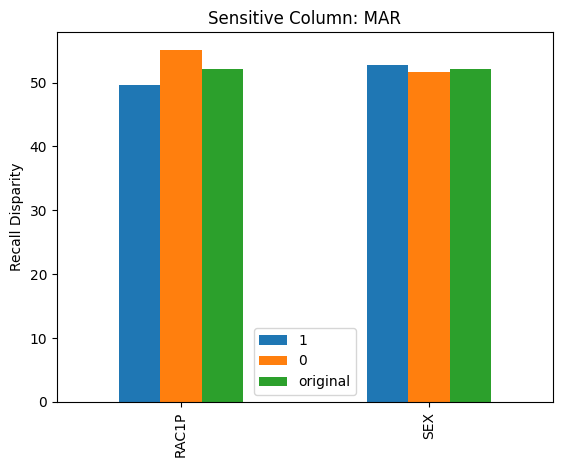

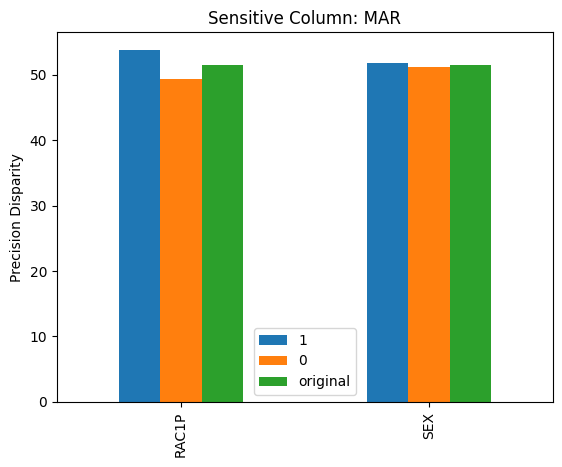

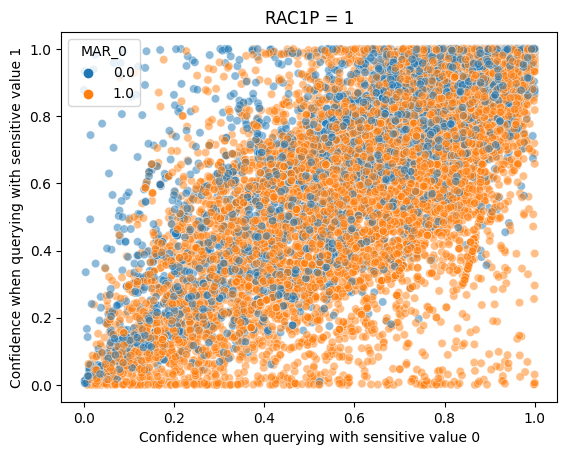

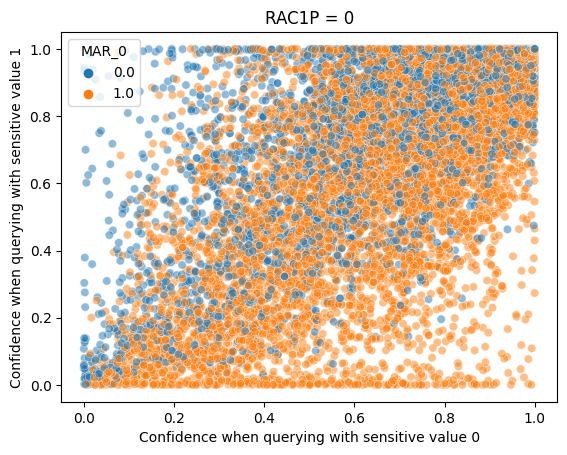

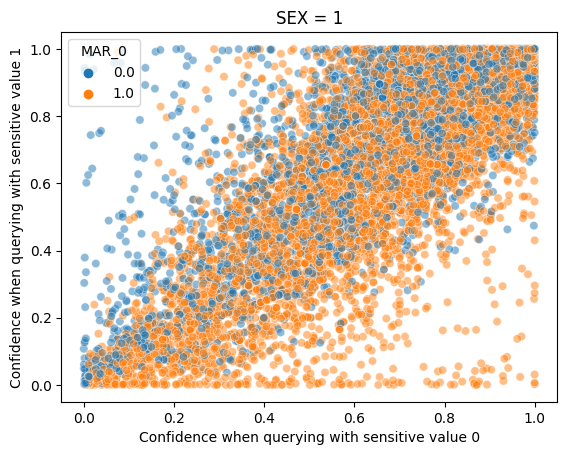

...

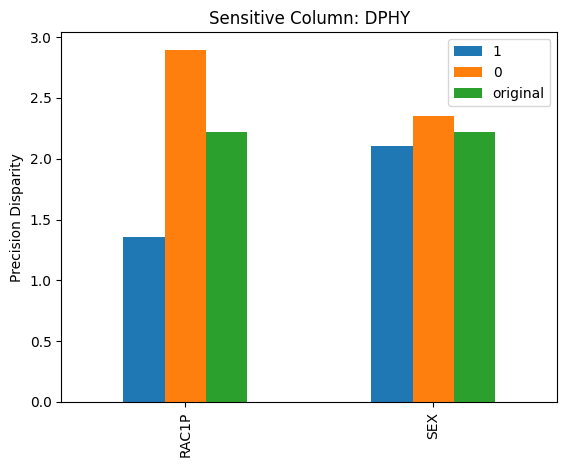

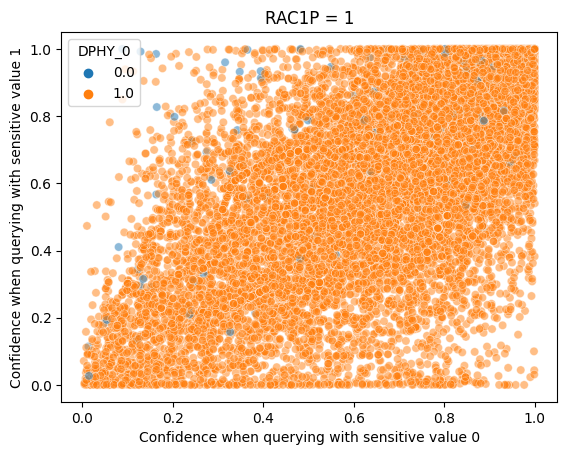

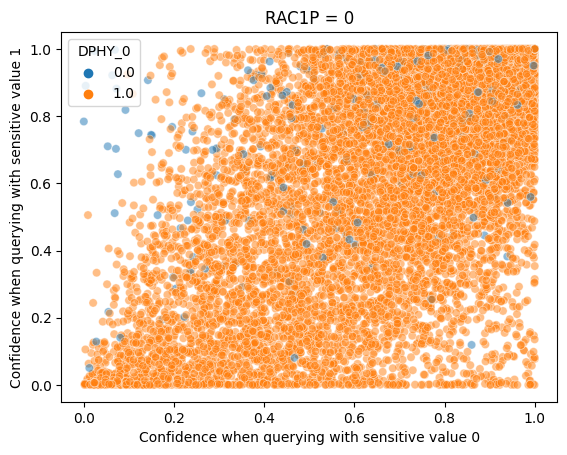

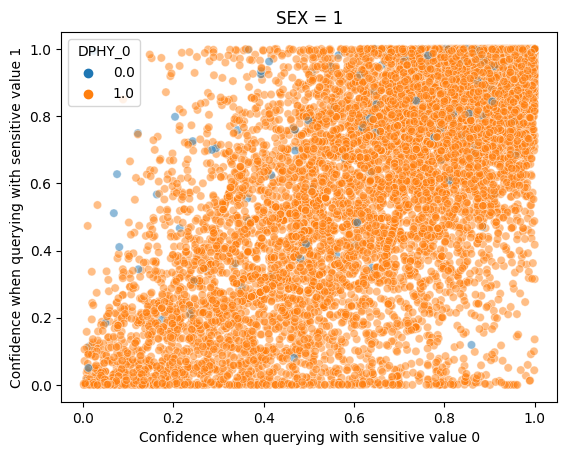

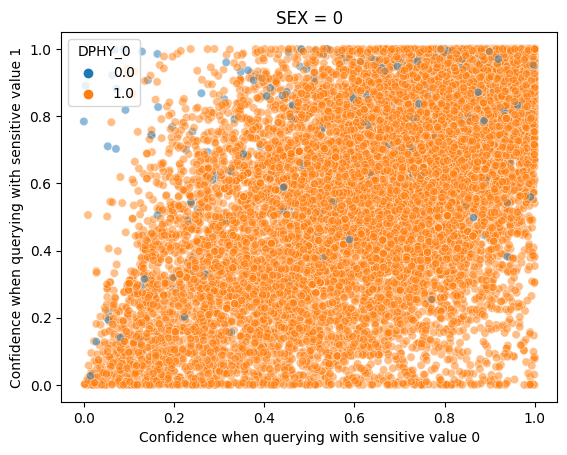

In [50]:
all_sensitive_columns = ['MAR', 'DEAR', 'DEYE', 'DREM', 'DPHY']

for sensitive_column in all_sensitive_columns:
    temp_ds = data_utils.CensusWrapper(
                filter_prop="none", ratio=float(0.5), split="all", name="Census19", sampling_condition_dict_list=sampling_condition_dict_list, sensitive_column=sensitive_column)
    
    X, y = temp_ds.ds.get_attack_df()

    X_query_by_sen_val = {val: X_train.copy() for val in temp_ds.ds.meta['sensitive_values']}

    for val in temp_ds.ds.meta['sensitive_values']:
        for val2 in temp_ds.ds.meta['sensitive_values']:
            if val != val2:
                X_query_by_sen_val[val][f'{temp_ds.ds.meta["sensitive_column"]}_{val2}'] = 0
            else:
                X_query_by_sen_val[val][f'{temp_ds.ds.meta["sensitive_column"]}_{val2}'] = 1
    
    y_pred_by_sen_val = {val: clf.predict_proba(X_query_by_sen_val[val]) for val in temp_ds.ds.meta['sensitive_values']}

    y_conf_by_sen_val = {
        val: (y_tr_onehot * y_pred_by_sen_val[val]).sum(axis=1) for val in temp_ds.ds.meta['sensitive_values']
    }

    y_pred_conf = np.stack([y_conf_by_sen_val[val] for val in temp_ds.ds.meta['sensitive_values']]).argmax(axis=0)

    subgroup_columns = ['RAC1P', 'SEX']

    subgroup_disparity_dict = get_disparity_by_subgroup(attack_type='CONF', ds=temp_ds, X_att_query=X_train, y_att_query=y, y_pred=y_pred_conf, subgroup_columns=subgroup_columns, metric='recall', threshold=0.5)

    # print(subgroup_disparity_dict)
    pd.DataFrame(subgroup_disparity_dict).T.plot.bar()
    plt.title(f'Sensitive Column: {sensitive_column}')
    plt.ylabel('Recall Disparity')
    plt.show()

    subgroup_disparity_dict = get_disparity_by_subgroup(attack_type='CONF', ds=temp_ds, X_att_query=X_train, y_att_query=y, y_pred=y_pred_conf, subgroup_columns=subgroup_columns, metric='precision', threshold=0.5)

    # print(subgroup_disparity_dict)
    pd.DataFrame(subgroup_disparity_dict).T.plot.bar()
    plt.title(f'Sensitive Column: {sensitive_column}')
    plt.ylabel('Precision Disparity')
    plt.show()

    for col in subgroup_columns:
        values = ds.ds.unique_values_dict[col]

        for val in values:
            subset_indices = get_indices_by_conditions(temp_ds, X_train, {col: val})
            sns.scatterplot(x=y_conf_by_sen_val[0][subset_indices], y=y_conf_by_sen_val[1][subset_indices], hue=X_train[f"{temp_ds.ds.meta['sensitive_column']}_0"][subset_indices], alpha=0.5)
            plt.title(f'{col} = {val}')
            plt.xlabel('Confidence when querying with sensitive value 0')
            plt.ylabel('Confidence when querying with sensitive value 1')
            plt.show()

In [28]:
X_query_by_sen_val = {val: X_train.copy() for val in ds.ds.meta['sensitive_values']}

In [29]:
for val in ds.ds.meta['sensitive_values']:
    for val2 in ds.ds.meta['sensitive_values']:
        if val != val2:
            X_query_by_sen_val[val][f'{ds.ds.meta["sensitive_column"]}_{val2}'] = 0
        else:
            X_query_by_sen_val[val][f'{ds.ds.meta["sensitive_column"]}_{val2}'] = 1

In [30]:
y_pred_by_sen_val = {val: clf.predict_proba(X_query_by_sen_val[val]) for val in ds.ds.meta['sensitive_values']}

In [31]:
y_conf_by_sen_val = {
    val: (y_tr_onehot * y_pred_by_sen_val[val]).sum(axis=1) for val in ds.ds.meta['sensitive_values']
}

In [32]:
y_pred_conf = np.stack([y_conf_by_sen_val[val] for val in ds.ds.meta['sensitive_values']]).argmax(axis=0)

In [33]:
subgroup_columns = ['RAC1P', 'SEX']

In [34]:
for col in subgroup_columns:
    values = ds.ds.unique_values_dict[col]

    for val in values:
        subset_indices = get_indices_by_conditions(ds, X_train, {col: val})
        print(accuracy_score(y_tr[subset_indices], y_pred_conf[subset_indices]))


0.26907405927938005
0.27565489065128573
0.3542297928097617
0.19419031980608334


In [39]:
subgroup_disparity_dict = get_disparity_by_subgroup(attack_type='CONF', ds=ds, X_att_query=X_train, y_att_query=y_tr, y_pred=y_pred_conf, subgroup_columns=subgroup_columns, metric='accuracy', threshold=0.5)

In [40]:
subgroup_disparity_dict

{'RAC1P': {1: 26.907405927938004, 0: 27.565489065128574, 'original': 27.236},
 'SEX': {1: 35.42297928097617, 0: 19.419031980608334, 'original': 27.236}}

In [37]:
for col in subgroup_columns:
    print(pd.crosstab(ds.ds.original_df[col], ds.ds.original_df[ds.ds.meta['y_column']], normalize='index'))

PINCP        0        1
RAC1P                  
0      0.82892  0.17108
1      0.73606  0.26394
PINCP         0         1
SEX                      
0      0.722567  0.277433
1      0.845491  0.154509


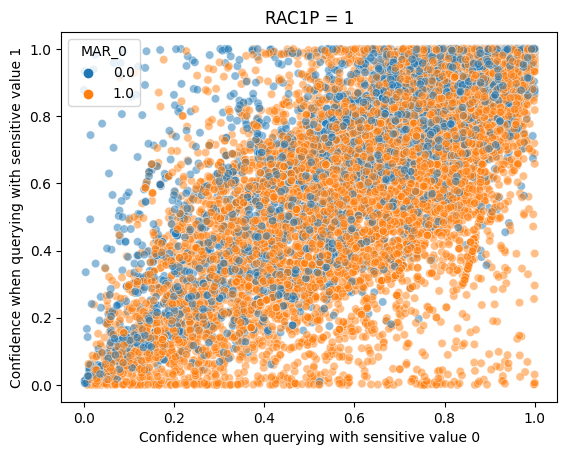

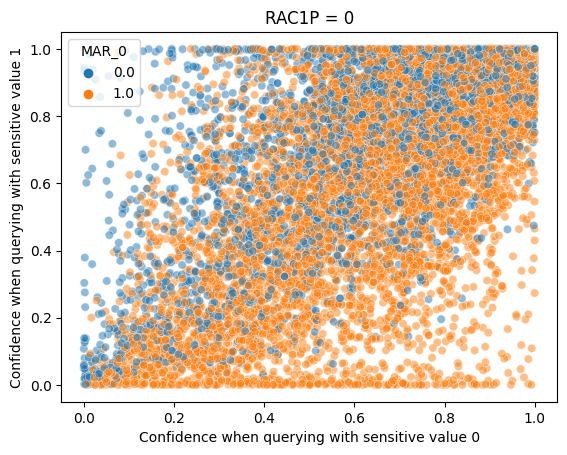

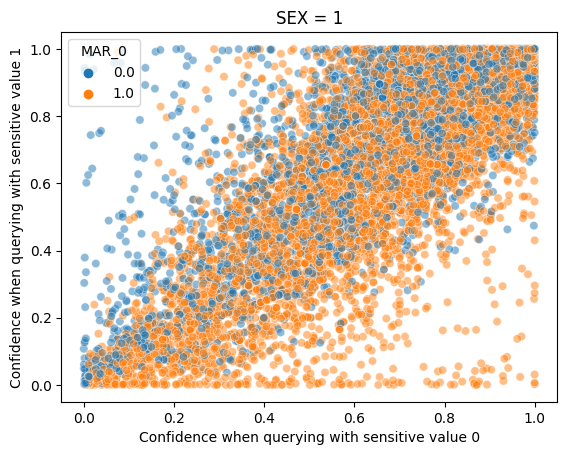

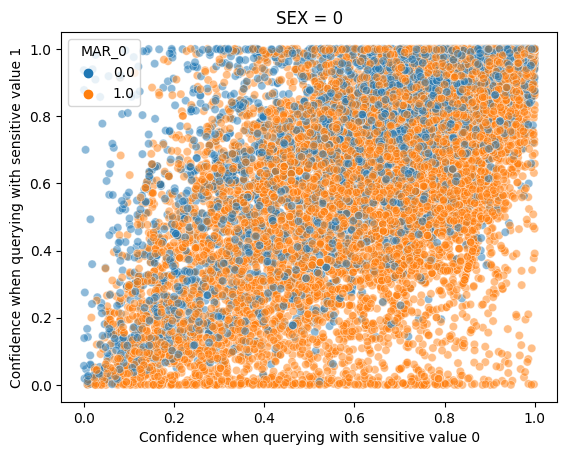

In [38]:
for col in subgroup_columns:
    values = ds.ds.unique_values_dict[col]

    for val in values:
        subset_indices = get_indices_by_conditions(ds, X_train, {col: val})
        sns.scatterplot(x=y_conf_by_sen_val[0][subset_indices], y=y_conf_by_sen_val[1][subset_indices], hue=X_train[f"{ds.ds.meta['sensitive_column']}_0"][subset_indices], alpha=0.5)
        plt.title(f'{col} = {val}')
        plt.xlabel('Confidence when querying with sensitive value 0')
        plt.ylabel('Confidence when querying with sensitive value 1')
        plt.show()

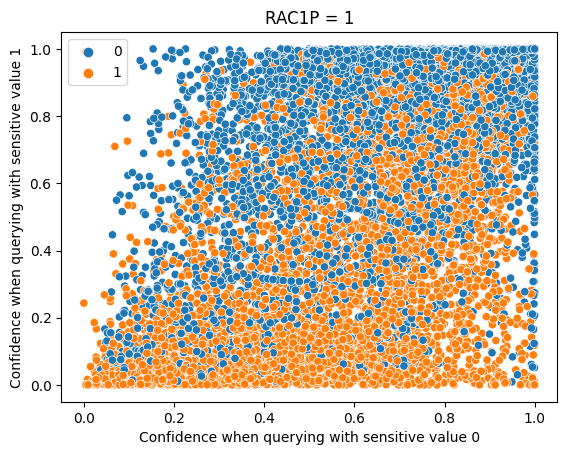

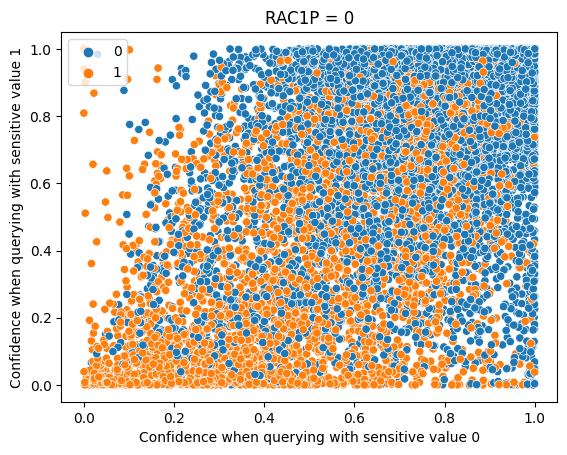

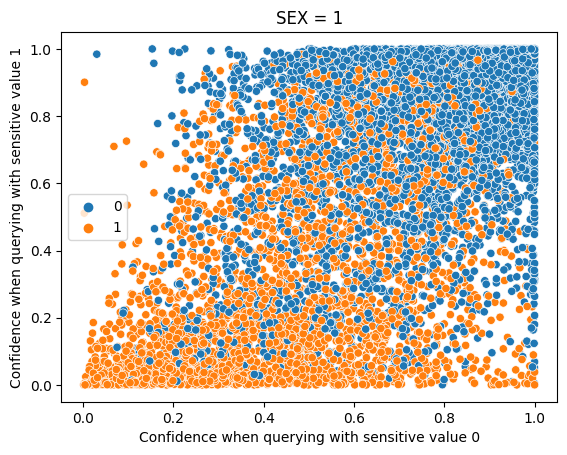

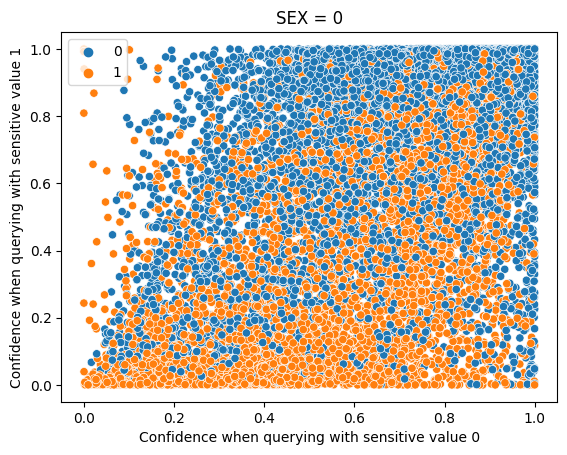

In [38]:
for col in subgroup_columns:
    values = ds.ds.unique_values_dict[col]

    for val in values:
        subset_indices = get_indices_by_conditions(ds, X_train, {col: val})
        sns.scatterplot(x=y_conf_by_sen_val[0][subset_indices], y=y_conf_by_sen_val[1][subset_indices], hue=y_tr.ravel()[subset_indices])
        plt.title(f'{col} = {val}')
        plt.xlabel('Confidence when querying with sensitive value 0')
        plt.ylabel('Confidence when querying with sensitive value 1')
        plt.show()

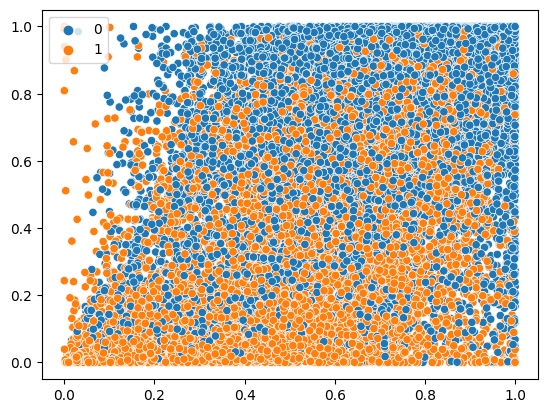

In [33]:
sns.scatterplot(x=y_conf_by_sen_val[ds.ds.meta['sensitive_values'][0]], y=y_conf_by_sen_val[ds.ds.meta['sensitive_values'][1]], hue=y_tr.ravel())
plt.show()

In [22]:
y_pred_by_sen_val.keys()

dict_keys([0, 1])

In [28]:
y_tr.ravel().shape

(50000,)

In [29]:
(y_tr_onehot * y_pred_by_sen_val[0]).sum(axis=1)

array([0.82848449, 0.99999761, 0.99797509, ..., 0.99977821, 0.9008472 ,
       0.88304673])

In [30]:
(y_tr_onehot * y_pred_by_sen_val[1]).sum(axis=1)

array([0.99055892, 0.99999662, 0.65135545, ..., 0.99996627, 0.79282179,
       0.60893941])

# LOMIA Attack

In [4]:
attack_dataset, lomia_indices, lomia_correct_indices = model_utils.LOMIA_attack(clf, X_train, y_tr, ds.ds.meta)

100%|██████████| 50000/50000 [01:06<00:00, 750.57it/s]


In [8]:
attack_df = pd.concat(attack_dataset)
attack_df[ds.ds.meta['y_column']] = attack_df[ds.ds.meta['y_column']].apply(lambda x: ds.ds.meta['y_values'][x])

In [9]:
attack_df.to_csv(f'<PATH_TO_DATASET>/{ds.ds.filenameroot}_LOMIA_attack_{ds.ds.meta["sensitive_column"]}.csv')
np.save(f'<PATH_TO_DATASET>/{ds.ds.filenameroot}_LOMIA_attack_lomia_indices_{ds.ds.meta["sensitive_column"]}.npy', lomia_indices)
np.save(f'<PATH_TO_DATASET>/{ds.ds.filenameroot}_LOMIA_attack_lomia_correct_indices_{ds.ds.meta["sensitive_column"]}.npy', lomia_correct_indices)

# Load Attack Data

In [61]:
attack_df = pd.read_csv(f'<PATH_TO_DATASET>/{ds.ds.filenameroot}_LOMIA_attack_{ds.ds.meta["sensitive_column"]}.csv')
attack_df.index = attack_df['Unnamed: 0']
attack_df.index.name = None
attack_df = attack_df.drop('Unnamed: 0', axis=1)

In [62]:
# Split the DataFrame into input and output variables
X_attack = attack_df.drop([f'{ds.ds.meta["sensitive_column"]}_{val}' for val in ds.ds.meta['sensitive_values']], axis=1) 
X_attack = oneHotCatVars(X_attack, ds.ds.meta['y_column'])
y_attack = attack_df[[ f'{ds.ds.meta["sensitive_column"]}_{ds.ds.meta["sensitive_positive"]}']]
# y_attack_onehot, att_enc = onehot(y_attack.to_numpy())
y_attack_onehot = ds.ds.sensitive_enc.transform(y_attack.to_numpy()).toarray()

# Train Attack Model

In [63]:
attack_clf = model_utils.get_model(max_iter=500)

In [64]:
attack_clf.fit(X_attack, y_attack_onehot)
model_utils.save_model(attack_clf, f'<PATH_TO_MODEL>/{ds.ds.filenameroot}_LOMIA_attack_{ds.ds.meta["sensitive_column"]}_model.pkl')

In [65]:
# all_sensitive_columns = ['MAR', 'DEAR', 'DEYE', 'DREM', 'DPHY']
all_sensitive_columns = ['MAR']

subgroup_disparity_dicts = {}

for sensitive_column in all_sensitive_columns:
    temp_ds = data_utils.CensusWrapper(
            filter_prop="none", ratio=float(0.5), split="all", name="Census19", sampling_condition_dict_list=sampling_condition_dict_list, sensitive_column=sensitive_column, additional_meta=additional_meta)
#     temp_ds.ds.filenameroot = temp_ds.ds.name + f"_{subgroup_col_name}_{round(100*split_ratio_first_subgroup)}_{round(100*(1-split_ratio_first_subgroup))}_minority_categorized"
    X, y = temp_ds.ds.get_attack_df()

    X = X.astype(float)

    subgroup_columns = ['RAC1P']

    attack_clf = model_utils.load_model(f'<PATH_TO_MODEL>/{temp_ds.ds.filenameroot}_LOMIA_attack_{temp_ds.ds.meta["sensitive_column"]}_model.pkl')

    subgroup_disparity_dict = get_disparity_by_subgroup(ds=ds, X_att_query=X, y_att_query=y, subgroup_columns=subgroup_columns, clf=attack_clf, metric='precision')

    subgroup_disparity_dicts[sensitive_column] = subgroup_disparity_dict

In [66]:
subgroup_disparity_dicts

{'MAR': {'RAC1P': {1: 53.261035588819304,
   0: 52.02934451219512,
   'original': 52.71301398897839}}}

In [91]:
all_sensitive_columns = ['MAR', 'DEAR', 'DEYE', 'DREM', 'DPHY']

aucs, recalls = {}, {}

for sensitive_column in all_sensitive_columns:
    temp_ds = data_utils.CensusWrapper(
            filter_prop="none", ratio=float(0.5), split="all", name="Census19", sampling_condition_dict_list=sampling_condition_dict_list, sensitive_column=sensitive_column)
    temp_ds.ds.filenameroot = temp_ds.ds.name + f"_{subgroup_col_name}_{round(100*split_ratio_first_subgroup)}_{round(100*(1-split_ratio_first_subgroup))}_minority_categorized"
    X, y = temp_ds.ds.get_attack_df()

    X = X.astype(float)

    subgroup_columns = ['RAC1P']

    attack_clf = model_utils.load_model(f'<PATH_TO_MODEL>/{temp_ds.ds.filenameroot}_LOMIA_attack_{temp_ds.ds.meta["sensitive_column"]}_model.pkl')

    subgroup_disparity_dict = get_subgroup_disparity(temp_ds, subgroup_columns, attack_clf, X, y, metric='auc')

    aucs[sensitive_column] = subgroup_disparity_dict['RAC1P']['asrs']

    subgroup_disparity_dict = get_subgroup_disparity(temp_ds, subgroup_columns, attack_clf, X, y, metric='recall')

    recalls[sensitive_column] = subgroup_disparity_dict['RAC1P']['asrs']


# Random Mutation of Sensitive Attribute vs Disparity

In [72]:
# all_sensitive_columns = ['MAR', 'DEAR', 'DEYE', 'DREM', 'DPHY']
# all_sensitive_columns = ['MAR']
sensitive_column = 'MAR'

subgroup_disparity_dicts = {}

for sensitive_attribute_mutate in [0.1, 0.25, 0.5, 0.75, 0.9]:
    temp_ds = data_utils.CensusWrapper(
            filter_prop="none", ratio=float(0.5), split="all", name="Census19", sampling_condition_dict_list=sampling_condition_dict_list, sensitive_column=sensitive_column, additional_meta={'sensitive_attribute_mutate': sensitive_attribute_mutate})
#     temp_ds.ds.filenameroot = temp_ds.ds.name + f"_{subgroup_col_name}_{round(100*split_ratio_first_subgroup)}_{round(100*(1-split_ratio_first_subgroup))}_minority_categorized"
    X, y = temp_ds.ds.get_attack_df()

    X = X.astype(float)

    subgroup_columns = ['RAC1P']

    attack_clf = model_utils.load_model(f'<PATH_TO_MODEL>/{temp_ds.ds.filenameroot}_LOMIA_attack_{temp_ds.ds.meta["sensitive_column"]}_model.pkl')

    subgroup_disparity_dict = get_disparity_by_subgroup(ds=ds, X_att_query=X, y_att_query=y, subgroup_columns=subgroup_columns, clf=attack_clf, metric='precision')

    subgroup_disparity_dicts[sensitive_attribute_mutate] = subgroup_disparity_dict[subgroup_columns[0]]

Text(0, 0.5, 'Precision Disparity')

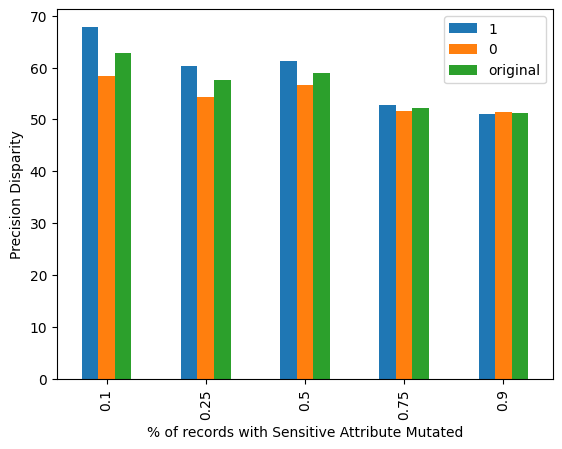

In [77]:
subgroup_disparity_dicts_df = pd.DataFrame(subgroup_disparity_dicts).T
subgroup_disparity_dicts_df.plot.bar()
# set x axis label
plt.xlabel("% of records with Sensitive Attribute Mutated")
# set y axis label
plt.ylabel("Precision Disparity")

Text(0, 0.5, 'Precision Disparity')

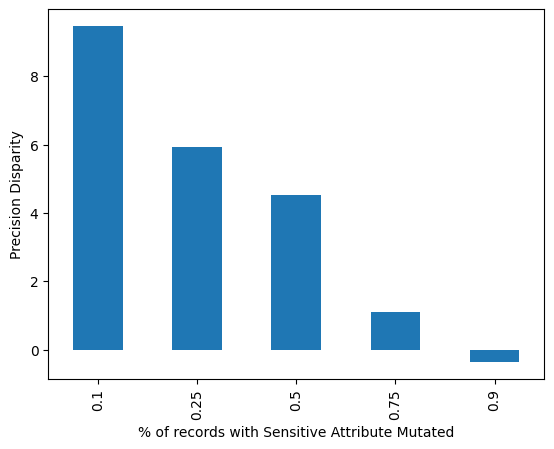

In [82]:
subgroup_disparity_dicts_df['disparity'] = subgroup_disparity_dicts_df[1] - subgroup_disparity_dicts_df[0]
subgroup_disparity_dicts_df['disparity'].plot.bar()
# set x axis label
plt.xlabel("% of records with Sensitive Attribute Mutated")
# set y axis label
plt.ylabel("Precision Disparity")

In [8]:
all_sensitive_columns = ['MAR', 'DEAR', 'DEYE', 'DREM', 'DPHY']

y_pred_conf_subgroups = {}

for sensitive_attribute_mutate in [0.1, 0.25, 0.5, 0.75, 0.9][:5]:
    temp_ds = data_utils.CensusWrapper(
            filter_prop="none", ratio=float(0.5), split="all", name="Census19", sampling_condition_dict_list=sampling_condition_dict_list, sensitive_column=sensitive_column, additional_meta={'sensitive_attribute_mutate': sensitive_attribute_mutate})
    
#     X, y = temp_ds.ds.get_attack_df()

    (x_tr, y_tr), (x_te, y_te), cols = temp_ds.load_data()
    X_train = pd.DataFrame(x_tr, columns=cols)
    y_tr_onehot = ds.ds.y_enc.transform(y_tr).toarray()

    clf = model_utils.load_model(f'<PATH_TO_MODEL>/{temp_ds.ds.filenameroot}_target_model.pkl')

    y_pred = clf.predict_proba(X_train)

    y_pred_conf = (y_tr_onehot * y_pred).sum(axis=1)

    subgroup_col_name = 'RAC1P'

    subgroup_col_values = temp_ds.ds.unique_values_dict[subgroup_col_name]

    subgroup_indices_dict = {
        val: get_indices_by_conditions(temp_ds, X_train, {subgroup_col_name: val}) for val in subgroup_col_values
    }

    y_pred_conf_subgroup = {
        val: y_pred_conf[subgroup_indices_dict[val]] for val in subgroup_col_values
    }

    y_pred_conf_subgroup['original'] = np.concatenate([y_pred_conf[subgroup_indices_dict[val]] for val in subgroup_col_values])

    y_pred_conf_subgroups[sensitive_attribute_mutate] = y_pred_conf_subgroup

    # # plot the kdensity of the confidence scores
    # for val in subgroup_col_values:
    #     sns.kdeplot(y_pred_conf_subgroup[val], label=val)
    #     plt.show()


NameError: name 'sensitive_column' is not defined

In [201]:
attack_clf = model_utils.load_model(f'<PATH_TO_MODEL>/{ds.ds.filenameroot}_LOMIA_attack_{ds.ds.meta["sensitive_column"]}_model.pkl')
X, y = ds.ds.get_attack_df()

X = X.astype(float)

sens_pred = attack_clf.predict(X)
sens_pred = sens_pred.argmax(axis=1)

correct_indices = (sens_pred == y)
incorrect_indices = (sens_pred != y)

subgroup_disparity_dict = {}

for metric in ['precision', 'recall', 'f1', 'accuracy', 'mcc', 'gmean']:
    subgroup_disparity_dict[metric] = get_disparity_by_subgroup(ds=ds, X_att_query=X, y_att_query=y, subgroup_columns=[subgroup_col_name], clf=attack_clf, metric=metric)[subgroup_col_name]

In [11]:
y_pred = clf.predict_proba(X_train)

# correct_indices = (y_tr.ravel() == np.argmax(y_pred, axis=1))
# incorrect_indices = (y_tr.ravel() != np.argmax(y_pred, axis=1))

y_pred_conf = (y_tr_onehot * y_pred).sum(axis=1)

subgroup_col_name = 'RAC1P'

subgroup_col_values = ds.ds.unique_values_dict[subgroup_col_name]

subgroup_indices_dict = {
    val: get_indices_by_conditions(ds, X_train, {subgroup_col_name: val}) for val in subgroup_col_values
}

y_pred_conf_subgroup = {
    val: y_pred_conf[subgroup_indices_dict[val]] for val in subgroup_col_values
}

correct_y_pred_conf_subgroup = {
    val: y_pred_conf[subgroup_indices_dict[val]][correct_indices[subgroup_indices_dict[val].to_numpy()]] for val in subgroup_col_values
}

incorrect_y_pred_conf_subgroup = {
    val: y_pred_conf[subgroup_indices_dict[val]][incorrect_indices[subgroup_indices_dict[val].to_numpy()]] for val in subgroup_col_values
}

y_pred_conf_subgroup['original'] = np.concatenate([y_pred_conf[subgroup_indices_dict[val]] for val in subgroup_col_values])
correct_y_pred_conf_subgroup['original'] = np.concatenate([y_pred_conf[subgroup_indices_dict[val][correct_indices[subgroup_indices_dict[val].to_numpy()]]] for val in subgroup_col_values])
incorrect_y_pred_conf_subgroup['original'] = np.concatenate([y_pred_conf[subgroup_indices_dict[val][incorrect_indices[subgroup_indices_dict[val].to_numpy()]]] for val in subgroup_col_values])

In [6]:
pd.crosstab(ds.ds.original_df['RAC1P'], ds.ds.original_df['MAR'], normalize='index')

MAR,0,1
RAC1P,,
0,0.54982,0.45018
1,0.62198,0.37802


In [23]:
pd.DataFrame(subgroup_disparity_dict).T

,1,0,original
precision,71.440678,62.883309,67.351755
recall,48.687672,44.240932,46.598177
f1,57.909400,51.939994,55.085052
accuracy,55.812096,54.530161,55.172000
mcc,16.278294,12.133519,14.400095
gmean,57.500349,54.711004,56.197062


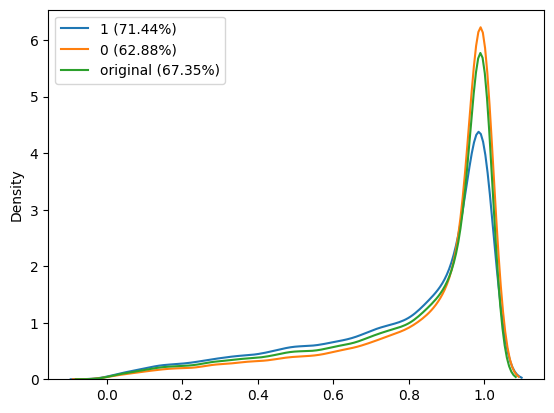

In [9]:
for val in subgroup_col_values + ['original']:
    sns.kdeplot(y_pred_conf_subgroup[val], label=f"{val} ({round(subgroup_disparity_dict['precision'][val], 2)}%)")
    plt.legend()

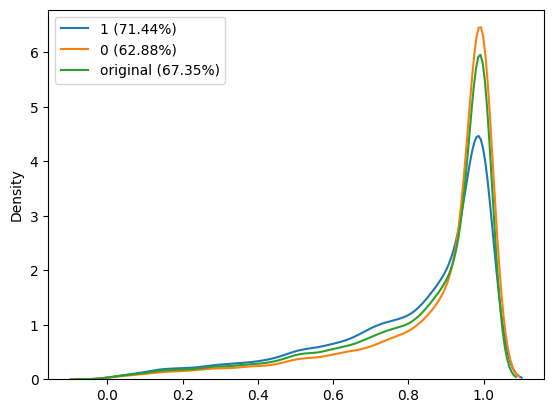

In [52]:
for val in subgroup_col_values + ['original']:
    sns.kdeplot(correct_y_pred_conf_subgroup[val], label=f"{val} ({round(subgroup_disparity_dict['precision'][val], 2)}%)")
    plt.legend()

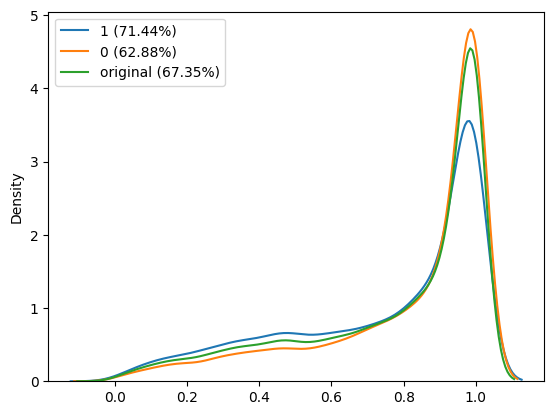

In [53]:
for val in subgroup_col_values + ['original']:
    sns.kdeplot(incorrect_y_pred_conf_subgroup[val], label=f"{val} ({round(subgroup_disparity_dict['precision'][val], 2)}%)")
    plt.legend()

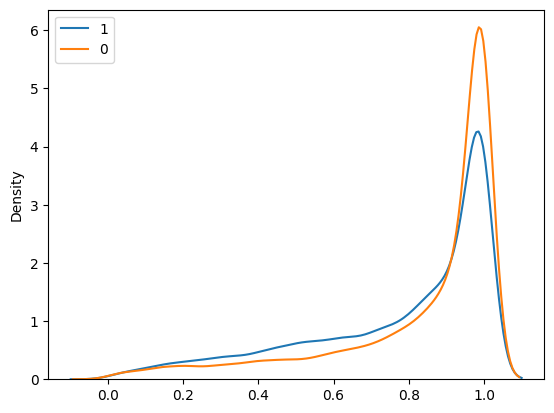

In [122]:
for val in subgroup_col_values:
    sns.kdeplot(y_pred_conf_subgroups[0.25][val], label=val)
    plt.legend()

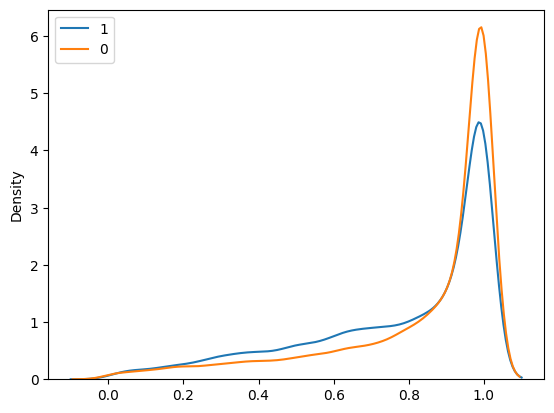

In [123]:
for val in subgroup_col_values:
    sns.kdeplot(y_pred_conf_subgroups[0.5][val], label=val)
    plt.legend()

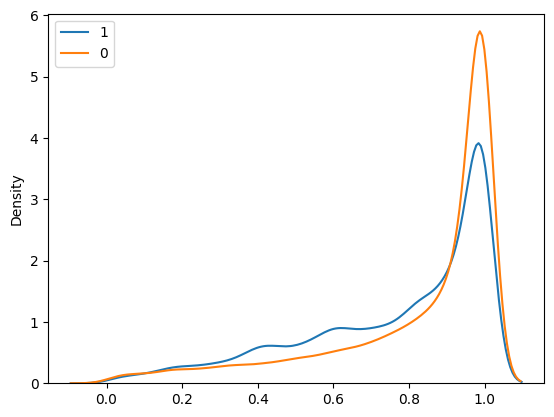

In [124]:
for val in subgroup_col_values:
    sns.kdeplot(y_pred_conf_subgroups[0.75][val], label=val)
    plt.legend()

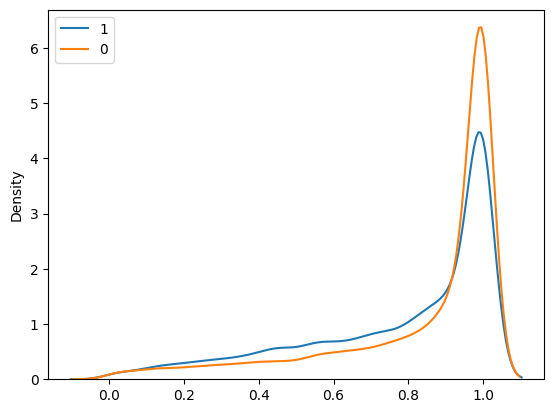

In [125]:
for val in subgroup_col_values:
    sns.kdeplot(y_pred_conf_subgroups[0.9][val], label=val)
    plt.legend()

# Retraining with Case 1 instances

In [6]:
if True:
    sens_pred, case_indices_dict = CSMIA_attack(clf, X_train, y_tr, ds.ds.meta)
    case_1_indices_orig = case_indices_dict[1]

    X_tampered = X_train[case_1_indices_orig].copy()

    X_tampered[['MAR_0']] = 1 - sens_pred[case_1_indices_orig].reshape(-1, 1)
    X_tampered[['MAR_1']] = sens_pred[case_1_indices_orig].reshape(-1, 1)

    y_case_2 = y_tr[case_1_indices_orig]
    # flip the y_case_2 labels
    # y_case_2 = 1 - y_case_2
    # y_case_2 = np.concatenate([y_case_2 for _ in range(len(ds.ds.meta["sensitive_values"]))]).reshape(-1, 1)
    y_case_2_onehot = ds.ds.y_enc.transform(y_case_2).toarray()

    

    # X_tampered = X_tampered.astype(float)
    


    clf_retr_grp0 = MLPClassifier(hidden_layer_sizes=(32, 16, 8), max_iter=500, learning_rate_init=0.012)
    clf_retr_grp0.partial_fit(X_train, y_tr_onehot, classes=np.unique(y_tr))
    temp_clf = model_utils.load_model(f'<PATH_TO_MODEL>/{ds.ds.filenameroot}_target_model.pkl')
    clf_retr_grp0.intercepts_ = temp_clf.intercepts_
    clf_retr_grp0.coefs_ = temp_clf.coefs_
    clf_retr_grp0.partial_fit(X_tampered[(X_tampered['SEX_0']==1).to_numpy()], y_case_2_onehot[(X_tampered['SEX_0']==1).to_numpy()])

In [7]:
if True:
    sens_pred, case_indices_dict = CSMIA_attack(clf, X_train, y_tr, ds.ds.meta)
    case_1_indices_orig = case_indices_dict[1]

    X_tampered = X_train[case_1_indices_orig].copy()

    X_tampered[['MAR_0']] = 1 - sens_pred[case_1_indices_orig].reshape(-1, 1)
    X_tampered[['MAR_1']] = sens_pred[case_1_indices_orig].reshape(-1, 1)

    y_case_2 = y_tr[case_1_indices_orig]
    # flip the y_case_2 labels
    # y_case_2 = 1 - y_case_2
    # y_case_2 = np.concatenate([y_case_2 for _ in range(len(ds.ds.meta["sensitive_values"]))]).reshape(-1, 1)
    y_case_2_onehot = ds.ds.y_enc.transform(y_case_2).toarray()
    # X_tampered = X_tampered.astype(float)
    


    clf_retr_grp1 = MLPClassifier(hidden_layer_sizes=(32, 16, 8), max_iter=500, learning_rate_init=0.012)
    clf_retr_grp1.partial_fit(X_train, y_tr_onehot, classes=np.unique(y_tr))
    temp_clf = model_utils.load_model(f'<PATH_TO_MODEL>/{ds.ds.filenameroot}_target_model.pkl')
    clf_retr_grp1.intercepts_ = temp_clf.intercepts_
    clf_retr_grp1.coefs_ = temp_clf.coefs_
    clf_retr_grp1.partial_fit(X_tampered[(X_tampered['SEX_1']==1).to_numpy()], y_case_2_onehot[(X_tampered['SEX_1']==1).to_numpy()])

In [8]:
for metric in ['precision', 'recall', 'f1', 'accuracy', 'mcc', 'gmean', 'fpr']:
    for i, tmp_clf in enumerate([clf, clf_retr_grp0, clf_retr_grp1][:1]):
        print(f"\n{['Original', 'Retrained on Group 0 Case 1', 'Retrained on Group 1 Case 1'][i]}")
        print(get_CSMIA_case_by_case_results(tmp_clf, X_train, y_tr, ds, subgroup_col_name='SEX', metric = metric))
    print(f'\n\n() shows the performance on metric {metric}')
    print('-'*50)
    print('\n\n')


Original
                              1                0
Case 1           2099 (67.4112)    1790 (63.944)
Case 2          19900 (54.4631)  19539 (53.7497)
Case 3              3001 (60.0)   3671 (57.6095)
Case All Cases  25000 (55.5891)  25000 (54.6839)


() shows the performance on metric precision
--------------------------------------------------




Original
                              1               0
Case 1           2099 (69.3111)  1790 (70.1665)
Case 2          19900 (76.2964)  19539 (70.332)
Case 3           3001 (43.2922)  3671 (46.5992)
Case All Cases    25000 (72.12)  25000 (66.944)


() shows the performance on metric recall
--------------------------------------------------




Original
                              1                0
Case 1           2099 (68.3479)   1790 (66.9109)
Case 2           19900 (63.544)  19539 (60.9515)
Case 3           3001 (50.2949)   3671 (51.5227)
Case All Cases  25000 (62.7738)  25000 (60.2109)


() shows the performance on metric f1
-

Original Target Model

In [13]:
get_CSMIA_case_by_case_results(clf, X_train, y_tr, ds, subgroup_col_name='SEX', metric = 'confusion_matrix')

,1,0
Case 1,"1272 (TP: 562, FP: 138, FN: 216, TN: 356)","3010 (TP: 1439, FP: 257, FN: 623, TN: 691)"
Case 2,"22078 (TP: 6149, FP: 6122, FN: 4573, TN: 5234)","19550 (TP: 3488, FP: 3978, FN: 5228, TN: 6856)"
Case 3,"1650 (TP: 666, FP: 255, FN: 334, TN: 395)","2440 (TP: 1289, FP: 358, FN: 433, TN: 360)"
Case All Cases,"25000 (TP: 7377, FP: 6515, FN: 5123, TN: 5985)","25000 (TP: 6216, FP: 4593, FN: 6284, TN: 7907)"


Retrained Target Model with Group 0 Case 1 instances

In [7]:
get_CSMIA_case_by_case_results(clf_retr_grp0, X_train, y_tr, ds, subgroup_col_name='SEX', metric = 'confusion_matrix')

,1,0
Case 1,"8027 (TP: 995, FP: 527, FN: 3021, TN: 3484)","13303 (TP: 3063, FP: 930, FN: 4152, TN: 5158)"
Case 2,"15785 (TP: 2738, FP: 2313, FN: 5047, TN: 5687)","10458 (TP: 1290, FP: 1561, FN: 3106, TN: 4501)"
Case 3,"1188 (TP: 528, FP: 334, FN: 171, TN: 155)","1239 (TP: 696, FP: 274, FN: 193, TN: 76)"
Case All Cases,"25000 (TP: 4261, FP: 3174, FN: 8239, TN: 9326)","25000 (TP: 5049, FP: 2765, FN: 7451, TN: 9735)"


Retrained Target Model with Group 1 Case 1 instances

In [12]:
get_CSMIA_case_by_case_results(clf_retr_grp1, X_train, y_tr, ds, subgroup_col_name='SEX', metric = 'confusion_matrix')

,1,0
Case 1,"344 (TP: 136, FP: 105, FN: 60, TN: 43)","183 (TP: 74, FP: 52, FN: 28, TN: 29)"
Case 2,"22066 (TP: 8985, FP: 9863, FN: 1713, TN: 1505)","19659 (TP: 6847, FP: 9173, FN: 1656, TN: 1983)"
Case 3,"2590 (TP: 309, FP: 197, FN: 1297, TN: 787)","5158 (TP: 893, FP: 324, FN: 3002, TN: 939)"
Case All Cases,"25000 (TP: 9430, FP: 10165, FN: 3070, TN: 2335)","25000 (TP: 7814, FP: 9549, FN: 4686, TN: 2951)"


Test performance of Retrained Target Model with Group 0 Case 1 instances

In [10]:
train_acc = 100 * clf_retr_grp0.score(X_train, ds.ds.y_enc.transform(y_tr).toarray())
test_acc = 100 * clf_retr_grp0.score(x_te, ds.ds.y_enc.transform(y_te).toarray())
if True:
    print("Classifier: Train acc %.2f , Test acc %.2f\n" %
            (train_acc, test_acc))

Classifier: Train acc 77.53 , Test acc 75.57



X does not have valid feature names, but MLPClassifier was fitted with feature names


Test performance of Retrained Target Model with Group 1 Case 1 instances

In [11]:
train_acc = 100 * clf_retr_grp1.score(X_train, ds.ds.y_enc.transform(y_tr).toarray())
test_acc = 100 * clf_retr_grp1.score(x_te, ds.ds.y_enc.transform(y_te).toarray())
if True:
    print("Classifier: Train acc %.2f , Test acc %.2f\n" %
            (train_acc, test_acc))

Classifier: Train acc 83.86 , Test acc 83.21



X does not have valid feature names, but MLPClassifier was fitted with feature names


# CSMIA on w/out Fairness Constraint and w/ Fairness Constraint

Case breakdown for target model without fairness constraint

In [12]:
get_CSMIA_case_by_case_results(clf, X_train, y_tr, ds, subgroup_col_name='SEX', metric = 'mcc')

,1,0
Case 1,1351 (43.93),3258 (35.85)
Case 2,22013 (4.42),19459 (9.04)
Case 3,1636 (26.62),2283 (23.55)
Case All Cases,25000 (7.67),25000 (16.04)


Re-Training the target model with case 1 records of Male subgroup

In [13]:
if True:
    sens_pred, case_indices_dict = CSMIA_attack(clf, X_train, y_tr, ds.ds.meta)
    case_1_indices_orig = case_indices_dict[1]

    X_tampered = X_train[case_1_indices_orig].copy()

    X_tampered[['MAR_0']] = 1 - sens_pred[case_1_indices_orig].reshape(-1, 1)
    X_tampered[['MAR_1']] = sens_pred[case_1_indices_orig].reshape(-1, 1)

    y_case_2 = y_tr[case_1_indices_orig]
    # flip the y_case_2 labels
    # y_case_2 = 1 - y_case_2
    # y_case_2 = np.concatenate([y_case_2 for _ in range(len(ds.ds.meta["sensitive_values"]))]).reshape(-1, 1)
    y_case_2_onehot = ds.ds.y_enc.transform(y_case_2).toarray()

    

    # X_tampered = X_tampered.astype(float)
    


    clf_retrained_vuln = MLPClassifier(hidden_layer_sizes=(32, 16, 8), max_iter=500, learning_rate_init=0.012)
    clf_retrained_vuln.partial_fit(X_train, y_tr_onehot, classes=np.unique(y_tr))
    temp_clf = model_utils.load_model(f'<PATH_TO_MODEL>/{ds.ds.filenameroot}_target_model.pkl')
    clf_retrained_vuln.intercepts_ = temp_clf.intercepts_
    clf_retrained_vuln.coefs_ = temp_clf.coefs_
    clf_retrained_vuln.partial_fit(X_tampered[(X_tampered['SEX_0']==1).to_numpy()], y_case_2_onehot[(X_tampered['SEX_0']==1).to_numpy()])

Case breakdown for target model with fairness constraint

In [14]:
get_CSMIA_case_by_case_results(new_clf, X_train, y_tr, ds, subgroup_col_name='SEX', metric = 'mcc')

,1,0
Case 1,23432 (8.6),23970 (26.25)
Case 2,1095 (4.26),513 (38.43)
Case 3,473 (5.88),517 (-5.07)
Case All Cases,25000 (8.48),25000 (26.11)


Re-Training the target model with case 1 records of Female (Vulnerable) subgroup

In [15]:
if True:
    sens_pred, case_indices_dict = CSMIA_attack(clf, X_train, y_tr, ds.ds.meta)
    case_1_indices_orig = case_indices_dict[1]

    X_tampered = X_train[case_1_indices_orig].copy()

    X_tampered[['MAR_0']] = 1 - sens_pred[case_1_indices_orig].reshape(-1, 1)
    X_tampered[['MAR_1']] = sens_pred[case_1_indices_orig].reshape(-1, 1)

    y_case_2 = y_tr[case_1_indices_orig]
    # flip the y_case_2 labels
    # y_case_2 = 1 - y_case_2
    # y_case_2 = np.concatenate([y_case_2 for _ in range(len(ds.ds.meta["sensitive_values"]))]).reshape(-1, 1)
    y_case_2_onehot = ds.ds.y_enc.transform(y_case_2).toarray()

    

    # X_tampered = X_tampered.astype(float)
    


    new_clf = MLPClassifier(hidden_layer_sizes=(32, 16, 8), max_iter=500, learning_rate_init=0.024)
    new_clf.partial_fit(X_train, y_tr_onehot, classes=np.unique(y_tr))
    temp_clf = model_utils.load_model(f'<PATH_TO_MODEL>/{ds.ds.filenameroot}_target_model.pkl')
    new_clf.intercepts_ = temp_clf.intercepts_
    new_clf.coefs_ = temp_clf.coefs_
    new_clf.partial_fit(X_tampered[(X_tampered['SEX_1']==1).to_numpy()], y_case_2_onehot[(X_tampered['SEX_1']==1).to_numpy()])

Case breakdown for retrained Target Model

In [17]:
get_CSMIA_case_by_case_results(new_clf, X_train, y_tr, ds, subgroup_col_name='SEX', metric = 'mcc')

,1,0
Case 1,62 (11.1),74 (19.23)
Case 2,22237 (1.64),19686 (2.21)
Case 3,2701 (-2.45),5240 (-0.22)
Case All Cases,25000 (8.78),25000 (26.24)


In [32]:
sens_pred, case_indices_dict = CSMIA_attack(clf, X_train, y_tr, ds.ds.meta)
case_1_indices_orig = case_indices_dict[1]
pd.crosstab(X_train['SEX_1'][case_1_indices_orig], new_sens_pred[case_1_indices_orig])

col_0,0.0,1.0
SEX_1,,
0.0,2086,1499
1.0,519,659


In [31]:
new_sens_pred, new_case_indices_dict = CSMIA_attack(new_clf, X_train, y_tr, ds.ds.meta)
new_case_1_indices_orig = new_case_indices_dict[1]
pd.crosstab(X_train['SEX_1'][new_case_1_indices_orig], new_sens_pred[new_case_1_indices_orig])

col_0,0.0,1.0
SEX_1,,
0.0,6319,14534
1.0,3250,7216


In [13]:
get_CSMIA_case_by_case_results(mitigator, X_train, y_tr, ds, subgroup_col_name='SEX')

NameError: name 'mitigator' is not defined

In [16]:
get_CSMIA_case_by_case_results(mitigator._hs[9]._classifier, X_train, y_tr, ds, subgroup_col_name='SEX')

,1,0
Case 1,2207 (66.47),3898 (73.65)
Case 2,21354 (53.25),18175 (46.11)
Case 3,1439 (57.82),2927 (74.34)
All Cases,25000 (54.68),25000 (53.71)


In [12]:
get_CSMIA_case_by_case_results(mitigator._hs[5]._classifier, X_train, y_tr, ds, subgroup_col_name='SEX')

,1,0
Case 1,2011 (71.41),3254 (72.34)
Case 2,21723 (52.72),18492 (46.43)
Case 3,1266 (61.85),3254 (73.14)
All Cases,25000 (54.68),25000 (53.28)


In [12]:
get_CSMIA_case_by_case_results(clf, X_test, y_te, ds, subgroup_col_name='SEX')

,1,0
Case 1,1416 (53.67),3076 (57.96)
Case 2,21497 (54.01),18744 (55.3)
Case 3,2087 (52.47),3180 (58.87)
All Cases,25000 (53.86),25000 (56.08)


In [13]:
get_CSMIA_case_by_case_results(mitigator, X_test, y_te, ds, subgroup_col_name='SEX')

,1,0
Case 1,2395 (51.69),3261 (57.8)
Case 2,20263 (49.82),18343 (48.23)
Case 3,2342 (61.83),3396 (72.94)
All Cases,25000 (51.13),25000 (52.83)


In [15]:
mitigator.weights_

0     0.000000
1     0.000000
2     0.000000
3     0.000000
4     0.000000
5     0.000000
6     0.446184
7     0.000000
8     0.000000
9     0.553816
10    0.000000
dtype: float64

In [15]:
mitigator._hs[2](X_test.iloc[0:10])

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

# Shap Explanation vs Confidence Gap

In [11]:
def CSMIA_attack(model, X_test, y_test, meta):
    dfs = [X_test.copy() for _ in range(len(meta["sensitive_values"]))]
    sensitive_columns = [f'{meta["sensitive_column"]}_{i}' for i in range(len(meta["sensitive_values"]))]
    for i in range(len(dfs)):
        dfs[i][sensitive_columns] = 0
        dfs[i][f'{meta["sensitive_column"]}_{i}'] = 1
    
    if isinstance(model, ExponentiatedGradient):
        y_confs = np.array([np.max(model._pmf_predict(df), axis=1) for df in dfs]).T
        y_preds = [np.argmax(model._pmf_predict(df), axis=1)==y_test.ravel() for df in dfs]
    else:
        y_confs = np.array([np.max(model.predict_proba(df), axis=1) for df in dfs]).T
        y_preds = [np.argmax(model.predict_proba(df), axis=1)==y_tr.ravel() for df in dfs]
    y_preds = np.array(y_preds).T
    case_1_indices = (y_preds.sum(axis=1) == 1)
    case_2_indices = (y_preds.sum(axis=1) > 1)
    case_3_indices = (y_preds.sum(axis=1) == 0)

    sens_pred = np.zeros(y_preds.shape[0])
    sens_pred[case_1_indices] = np.argmax(y_preds[case_1_indices], axis=1)
    sens_pred[case_2_indices] = np.argmax(y_confs[case_2_indices], axis=1)
    sens_pred[case_3_indices] = np.argmin(y_confs[case_3_indices], axis=1)
    return sens_pred, {1: case_1_indices, 2: case_2_indices, 3: case_3_indices}


In [34]:
X_temp_CSMIA = X_train.copy()
X_temp_CSMIA['MAR_1'], _ = CSMIA_attack(clf, X_train, y_tr, ds.ds.meta)
X_temp_CSMIA['MAR_0'] = 1 - X_temp_CSMIA['MAR_1']

In [157]:
# (CSMIA_attack(clf, X_train, y_tr, ds.ds.meta) == X_train[['MAR_1']].to_numpy().ravel()).sum() / len(X_train)

background = shap.kmeans(X_temp_CSMIA, 10)
explainer = shap.KernelExplainer(f, background)
shap_values_CSMIA = explainer.shap_values(X_temp_CSMIA, nsamples=100)

np.save(f'<PATH_TO_SHAP_VALUES>/{ds.ds.filenameroot}_{ds.ds.meta["sensitive_column"]}_CSMIA_shap_values.npy', shap_values_CSMIA)

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
100%|██████████| 50000/50000 [33:28<00:00, 24.89it/s]


In [203]:
pd.crosstab(ds.ds.original_df['RAC1P'], ds.ds.original_df['MAR'], normalize='index')

MAR,0,1
RAC1P,,
0,0.54982,0.45018
1,0.62198,0.37802


In [202]:
pd.DataFrame(subgroup_disparity_dict).T

,1,0,original
precision,71.440678,62.883309,67.351755
recall,48.687672,44.240932,46.598177
f1,57.909400,51.939994,55.085052
accuracy,55.812096,54.530161,55.172000
mcc,16.278294,12.133519,14.400095
gmean,57.500349,54.711004,56.197062


In [37]:
shap_values_CSMIA = np.load(f'<PATH_TO_SHAP_VALUES>/{ds.ds.filenameroot}_{ds.ds.meta["sensitive_column"]}_CSMIA_shap_values.npy')

sens_indices = [cols.get_loc(f'{ds.ds.meta["sensitive_column"]}_{val}') for val in ds.ds.meta["sensitive_values"]]
sensitive_col_shap_values_CSMIA = shap_values_CSMIA[:, sens_indices]

sens_pred_CSMIA, case_indices = CSMIA_attack(clf, X_train, y_tr, ds.ds.meta)
correct_indices_CSMIA = (sens_pred_CSMIA == X_train[['MAR_1']].to_numpy().ravel())

In [ ]:
print(X_train.iloc[correct_indices_CSMIA][X_train['RAC1P_1']==1].shape[0] / X_train[X_train['RAC1P_1']==1].shape[0])
print(X_train.iloc[correct_indices_CSMIA][X_train['RAC1P_0']==1].shape[0] / X_train[X_train['RAC1P_0']==1].shape[0])

In [204]:
temp_dict = {}
for thr in np.linspace(-0.6, 0.6, 25):
    try:
        thr = round(thr, 2)
        target_values = sensitive_col_shap_values_CSMIA[:, 0]
        shap_value_cond_filter = np.intersect1d(np.argwhere(target_values < thr).ravel(), np.argwhere(target_values > thr - 0.05).ravel())
        correct_csmia_indices_shap_cond = np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), np.argwhere(correct_indices_CSMIA).ravel())
        csmia_indices_shap_cond = np.argwhere(shap_value_cond_filter).ravel()
        # np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), lomia_correct_indices).shape[0] / np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), lomia_indices).shape[0]
        ratio_correct_csmia = correct_csmia_indices_shap_cond.shape[0] / csmia_indices_shap_cond.shape[0]
        # print(f"Shap value range: [{round(thr-0.05, 2)}, {thr}], correct case 1 ratio: {ratio_correct_lomia_case1}, correct: {correct_lomia_indices_shap_cond.shape[0]}, total: {lomia_indices_shap_cond.shape[0]}")
        ratio_correct_csmia_case_dict = {
            i : np.intersect1d(correct_csmia_indices_shap_cond, np.argwhere(case_indices[i]).ravel()).shape[0] / np.intersect1d(csmia_indices_shap_cond, np.argwhere(case_indices[i]).ravel()).shape[0] for i in range(1, 4)
        }
        total_csmia_case_dict = {
            i : np.intersect1d(csmia_indices_shap_cond, np.argwhere(case_indices[i]).ravel()).shape[0] for i in range(1, 4)
        }
        subgroup_csmia_case_dict = {
            i: X_train.iloc[np.intersect1d(csmia_indices_shap_cond, np.argwhere(case_indices[i]).ravel())]['RAC1P_1'].value_counts() for i in range(1, 4)
        }
        temp_dict[thr] = {
            'Shap Value': f"[{round(thr-0.05, 2)}, {thr}]",
            'accuracy': round(ratio_correct_csmia, 4),
            'correct': correct_csmia_indices_shap_cond.shape[0],
            'total': csmia_indices_shap_cond.shape[0],
            'correct ratio case 1': f"{round(ratio_correct_csmia_case_dict[1], 4)} ({total_csmia_case_dict[1]})",
            'correct ratio case 2': f"{round(ratio_correct_csmia_case_dict[2], 4)} ({total_csmia_case_dict[2]})",
            'correct ratio case 3': f"{round(ratio_correct_csmia_case_dict[3], 4)} ({total_csmia_case_dict[3]})",
            'subgroup case 1 (1 + 0)': f"{subgroup_csmia_case_dict[1][1]} + {subgroup_csmia_case_dict[1][0]}",
            'subgroup case 2 (1 + 0)': f"{subgroup_csmia_case_dict[2][1]} + {subgroup_csmia_case_dict[2][0]}",
            'subgroup case 3 (1 + 0)': f"{subgroup_csmia_case_dict[3][1]} + {subgroup_csmia_case_dict[3][0]}",
        }
    except:
        # print(shap_value_cond_filter)
        pass

temp_df = pd.DataFrame.from_dict(temp_dict, orient='index')
temp_df.index = temp_df['Shap Value']
temp_df = temp_df.drop(columns=['Shap Value'])
temp_df

,accuracy,correct,total,correct ratio case 1,correct ratio case 2,correct ratio case 3,subgroup case 1 (1 + 0),subgroup case 2 (1 + 0),subgroup case 3 (1 + 0)
Shap Value,,,,,,,,,
"[-0.25, -0.2]",0.6000,12,20,0.0 (2),0.6 (15),1.0 (3),1 + 1,3 + 12,2 + 1
"[-0.2, -0.15]",0.5455,108,198,0.6667 (27),0.4902 (153),0.8333 (18),12 + 15,68 + 85,14 + 4
"[-0.15, -0.1]",0.5459,464,850,0.631 (84),0.5217 (690),0.6711 (76),46 + 38,319 + 371,54 + 22
"[-0.1, -0.05]",0.5658,2535,4480,0.6526 (498),0.5431 (3515),0.6445 (467),287 + 211,1699 + 1816,286 + 181
"[-0.05, 0.0]",0.5715,6884,12045,0.6618 (1245),0.5503 (9539),0.6431 (1261),724 + 521,4596 + 4943,729 + 532
"[0.0, 0.05]",0.5749,4795,8341,0.6538 (884),0.5561 (6573),0.6357 (884),511 + 373,3166 + 3407,514 + 370
"[0.05, 0.1]",0.5659,2493,4405,0.649 (490),0.5434 (3456),0.6471 (459),285 + 205,1671 + 1785,281 + 178
"[0.1, 0.15]",0.5605,713,1272,0.6444 (135),0.5364 (1016),0.6694 (121),74 + 61,466 + 550,79 + 42
"[0.15, 0.2]",0.5488,427,778,0.6282 (78),0.5239 (628),0.6806 (72),43 + 35,289 + 339,51 + 21


In [41]:
attack_dataset, lomia_indices, lomia_correct_indices = model_utils.LOMIA_attack(mitigator, X_train, y_tr, ds.ds.meta)

100%|██████████| 50000/50000 [07:49<00:00, 106.49it/s]


In [ ]:
def CSMIA_attack(model, X_test, y_test, meta):
    dfs = [X_test.copy() for _ in range(len(meta["sensitive_values"]))]
    sensitive_columns = [f'{meta["sensitive_column"]}_{i}' for i in range(len(meta["sensitive_values"]))]
    for i in range(len(dfs)):
        dfs[i][sensitive_columns] = 0
        dfs[i][f'{meta["sensitive_column"]}_{i}'] = 1
    
    y_confs = np.array([np.max(model.predict_proba(df), axis=1) for df in dfs]).T
    y_preds = [np.argmax(model.predict_proba(df), axis=1)==y_tr.ravel() for df in dfs]
    y_preds = np.array(y_preds).T
    case_1_indices = (y_preds.sum(axis=1) == 1)
    case_2_indices = (y_preds.sum(axis=1) > 1)
    case_3_indices = (y_preds.sum(axis=1) == 0)

    sens_pred = np.zeros(y_preds.shape[0])
    sens_pred[case_1_indices] = np.argmax(y_preds[case_1_indices], axis=1)
    sens_pred[case_2_indices] = np.argmax(y_confs[case_2_indices], axis=1)
    sens_pred[case_3_indices] = np.argmin(y_confs[case_3_indices], axis=1)
    return sens_pred, {1: case_1_indices, 2: case_2_indices, 3: case_3_indices}


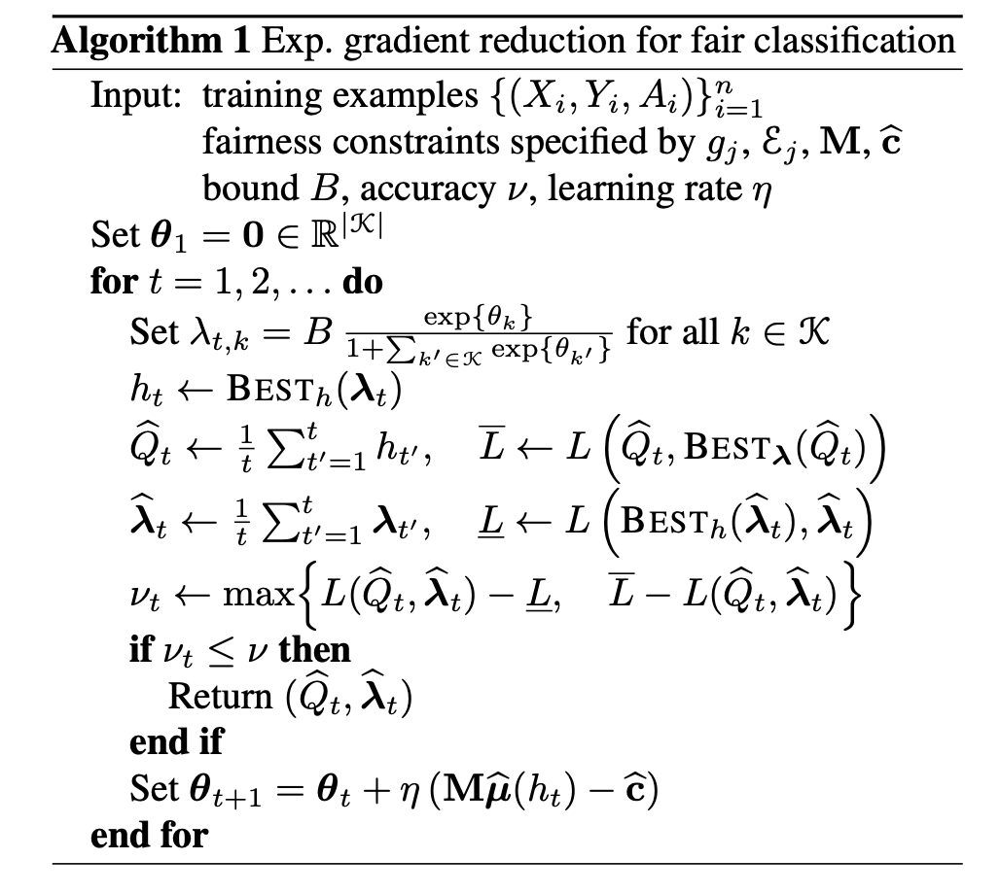

In [12]:
sens_pred_mitigator, mitigator_case_indices = CSMIA_attack(mitigator, X_train, y_tr, ds.ds.meta)
correct_indices_mitigator = (sens_pred_mitigator == X_train[['MAR_1']].to_numpy().ravel())

subgroup_csmia_case_dict_mitigator = {
    i: X_train.iloc[np.argwhere(mitigator_case_indices[i]).ravel()][f'{subgroup_col_name}_1'].value_counts() for i in range(1, 4)
}
subgroup_csmia_case_correct_dict_mitigator = {
    i: X_train.iloc[np.intersect1d(np.argwhere(mitigator_case_indices[i]).ravel(), np.argwhere(correct_indices_mitigator).ravel())][f'{subgroup_col_name}_1'].value_counts() for i in range(1, 4)
}

temp_dict = {
    f'Case {i}': { j: f'{subgroup_csmia_case_dict_mitigator[i][j]} ({round(100 * subgroup_csmia_case_correct_dict_mitigator[i][j] / subgroup_csmia_case_dict_mitigator[i][j], 2)})' for j in [1, 0] } for i in range(1, 4)
}
temp_dict['All Cases'] = { j: f'{subgroup_csmia_case_dict_mitigator[1][j] + subgroup_csmia_case_dict_mitigator[2][j] + subgroup_csmia_case_dict_mitigator[3][j]} ({round(100 * (subgroup_csmia_case_correct_dict_mitigator[1][j] + subgroup_csmia_case_correct_dict_mitigator[2][j] + subgroup_csmia_case_correct_dict_mitigator[3][j]) / (subgroup_csmia_case_dict_mitigator[1][j] + subgroup_csmia_case_dict_mitigator[2][j] + subgroup_csmia_case_dict_mitigator[3][j]), 2)})' for j in [1, 0] }

temp_df = pd.DataFrame.from_dict(temp_dict, orient='index')
temp_df

,1,0
Case 1,2207 (66.47),3898 (73.65)
Case 2,21354 (25.11),18175 (68.41)
Case 3,1439 (45.1),2927 (85.58)
All Cases,25000 (29.91),25000 (71.24)


In [13]:
sens_pred_mitigator, mitigator_case_indices = CSMIA_attack(clf, X_train, y_tr, ds.ds.meta)
correct_indices_mitigator = (sens_pred_mitigator == X_train[['MAR_1']].to_numpy().ravel())

subgroup_csmia_case_dict_mitigator = {
    i: X_train.iloc[np.argwhere(mitigator_case_indices[i]).ravel()][f'{subgroup_col_name}_1'].value_counts() for i in range(1, 4)
}
subgroup_csmia_case_correct_dict_mitigator = {
    i: X_train.iloc[np.intersect1d(np.argwhere(mitigator_case_indices[i]).ravel(), np.argwhere(correct_indices_mitigator).ravel())][f'{subgroup_col_name}_1'].value_counts() for i in range(1, 4)
}

temp_dict = {
    f'Case {i}': { j: f'{subgroup_csmia_case_dict_mitigator[i][j]} ({round(100 * subgroup_csmia_case_correct_dict_mitigator[i][j] / subgroup_csmia_case_dict_mitigator[i][j], 2)})' for j in [1, 0] } for i in range(1, 4)
}
temp_dict['All Cases'] = { j: f'{subgroup_csmia_case_dict_mitigator[1][j] + subgroup_csmia_case_dict_mitigator[2][j] + subgroup_csmia_case_dict_mitigator[3][j]} ({round(100 * (subgroup_csmia_case_correct_dict_mitigator[1][j] + subgroup_csmia_case_correct_dict_mitigator[2][j] + subgroup_csmia_case_correct_dict_mitigator[3][j]) / (subgroup_csmia_case_dict_mitigator[1][j] + subgroup_csmia_case_dict_mitigator[2][j] + subgroup_csmia_case_dict_mitigator[3][j]), 2)})' for j in [1, 0] }

temp_df = pd.DataFrame.from_dict(temp_dict, orient='index')
temp_df

,1,0
Case 1,1178 (73.51),3585 (68.87)
Case 2,22394 (54.3),18583 (46.82)
Case 3,1428 (63.24),2832 (69.99)
All Cases,25000 (55.72),25000 (52.61)


In [14]:
print(round(X_train['SEX_1'].corr(pd.Series(np.argmax(mitigator._pmf_predict(X_train), axis=1))), 6))
print(round(X_train['MAR_1'].corr(pd.Series(np.argmax(mitigator._pmf_predict(X_train), axis=1))), 6))

-0.11743
-0.195755


In [87]:
dfs = [X_train.copy() for _ in range(len(ds.ds.meta["sensitive_values"]))]
sensitive_columns = [f'{ds.ds.meta["sensitive_column"]}_{i}' for i in range(len(ds.ds.meta["sensitive_values"]))]
for i in range(len(dfs)):
    dfs[i][sensitive_columns] = 0
    dfs[i][f'{ds.ds.meta["sensitive_column"]}_{i}'] = 1

y_preds = [mitigator.predict(df)==y_tr.ravel() for df in dfs]
y_preds = np.array(y_preds).T

case1_indices = (y_preds.sum(axis=1) == 1)

X_train.iloc[case1_indices]['RAC1P_1'].value_counts()

RAC1P_1
1.0    3602
0.0    3321
Name: count, dtype: int64

In [68]:
dfs = [X_train.copy() for _ in range(len(ds.ds.meta["sensitive_values"]))]
sensitive_columns = [f'{ds.ds.meta["sensitive_column"]}_{i}' for i in range(len(ds.ds.meta["sensitive_values"]))]
for i in range(len(dfs)):
    dfs[i][sensitive_columns] = 0
    dfs[i][f'{ds.ds.meta["sensitive_column"]}_{i}'] = 1

y_preds = [np.argmax(clf.predict_proba(df), axis=1)==y_tr.ravel() for df in dfs]
y_preds = np.array(y_preds).T

case1_indices = (y_preds.sum(axis=1) == 1)

X_train.iloc[case1_indices]['RAC1P_1'].value_counts()

RAC1P_1
1.0    2998
0.0    2231
Name: count, dtype: int64

In [86]:
temp_dict = {}
for thr in np.linspace(0.05, 1.0, 20):
    try:
        thr = round(thr, 2)
        target_values = np.max(clf.predict_proba(X_temp_CSMIA), axis=1)
        shap_value_cond_filter = np.intersect1d(np.argwhere(target_values < thr).ravel(), np.argwhere(target_values > thr - 0.05).ravel())
        correct_csmia_indices_shap_cond = np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), np.argwhere(correct_indices_CSMIA).ravel())
        csmia_indices_shap_cond = np.argwhere(shap_value_cond_filter).ravel()
        # np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), lomia_correct_indices).shape[0] / np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), lomia_indices).shape[0]
        ratio_correct_csmia = correct_csmia_indices_shap_cond.shape[0] / csmia_indices_shap_cond.shape[0]
        # print(f"Shap value range: [{round(thr-0.05, 2)}, {thr}], correct case 1 ratio: {ratio_correct_lomia_case1}, correct: {correct_lomia_indices_shap_cond.shape[0]}, total: {lomia_indices_shap_cond.shape[0]}")
        ratio_correct_csmia_case_dict = {
            i : np.intersect1d(correct_csmia_indices_shap_cond, np.argwhere(case_indices[i]).ravel()).shape[0] / np.intersect1d(csmia_indices_shap_cond, np.argwhere(case_indices[i]).ravel()).shape[0] for i in range(1, 4)
        }
        total_csmia_case_dict = {
            i : np.intersect1d(csmia_indices_shap_cond, np.argwhere(case_indices[i]).ravel()).shape[0] for i in range(1, 4)
        }
        subgroup_csmia_case_dict = {
            i: X_train.iloc[np.intersect1d(csmia_indices_shap_cond, np.argwhere(case_indices[i]).ravel())]['RAC1P_1'].value_counts() for i in range(1, 4)
        }
        subgroup_csmia_case_correct_dict = {
            i: X_train.iloc[np.intersect1d(correct_csmia_indices_shap_cond, np.argwhere(case_indices[i]).ravel())]['RAC1P_1'].value_counts() for i in range(1, 4)
        }
        temp_dict[thr] = {
            'Prediction Confidence': f"[{round(thr-0.05, 2)}, {thr}]",
            'correct ratio': round(ratio_correct_csmia, 4),
            # 'correct': correct_csmia_indices_shap_cond.shape[0],
            'total': csmia_indices_shap_cond.shape[0],
            # 'correct ratio case 1': f"{round(100 * ratio_correct_csmia_case_dict[1], 2)} ({total_csmia_case_dict[1]})",
            # 'correct ratio case 2': f"{round(100 * ratio_correct_csmia_case_dict[2], 2)} ({total_csmia_case_dict[2]})",
            # 'correct ratio case 3': f"{round(100 * ratio_correct_csmia_case_dict[3], 2)} ({total_csmia_case_dict[3]})",
            # 'subgroup case 1 (1 + 0)': f"{subgroup_csmia_case_dict[1][1]} + {subgroup_csmia_case_dict[1][0]}",
            # 'subgroup case 2 (1 + 0)': f"{subgroup_csmia_case_dict[2][1]} + {subgroup_csmia_case_dict[2][0]}",
            # 'subgroup case 3 (1 + 0)': f"{subgroup_csmia_case_dict[3][1]} + {subgroup_csmia_case_dict[3][0]}",
            'subgroup case 1 (1 + 0)': f"{subgroup_csmia_case_dict[1][1]} ({round(100 * subgroup_csmia_case_correct_dict[1][1]/ subgroup_csmia_case_dict[1][1], 2)}) + {subgroup_csmia_case_dict[1][0]} ({round(100 * subgroup_csmia_case_correct_dict[1][0]/ subgroup_csmia_case_dict[1][0], 2)})",
            'subgroup case 2 (1 + 0)': f"{subgroup_csmia_case_dict[2][1]} ({round(100 * subgroup_csmia_case_correct_dict[2][1]/ subgroup_csmia_case_dict[2][1], 2)}) + {subgroup_csmia_case_dict[2][0]} ({round(100 * subgroup_csmia_case_correct_dict[2][0]/ subgroup_csmia_case_dict[2][0], 2)})",
            'subgroup case 3 (1 + 0)': f"{subgroup_csmia_case_dict[3][1]} ({round(100 * subgroup_csmia_case_correct_dict[3][1]/ subgroup_csmia_case_dict[3][1], 2)}) + {subgroup_csmia_case_dict[3][0]} ({round(100 * subgroup_csmia_case_correct_dict[3][0]/ subgroup_csmia_case_dict[3][0], 2)})"
        }
    except:
        # print(shap_value_cond_filter)
        pass

temp_df = pd.DataFrame.from_dict(temp_dict, orient='index')
temp_df.index = temp_df['Prediction Confidence']
temp_df = temp_df.drop(columns=['Prediction Confidence'])
temp_df

,correct ratio,total,subgroup case 1 (1 + 0),subgroup case 2 (1 + 0),subgroup case 3 (1 + 0)
Prediction Confidence,,,,,
"[0.5, 0.55]",0.5589,1934,106 (62.26) + 91 (64.84),726 (55.92) + 819 (52.26),123 (57.72) + 69 (73.91)
"[0.55, 0.6]",0.5595,1932,106 (62.26) + 91 (64.84),725 (56.0) + 818 (52.32),123 (57.72) + 69 (73.91)
"[0.6, 0.65]",0.5632,2026,112 (62.5) + 95 (66.32),759 (56.39) + 856 (52.57),131 (57.25) + 73 (75.34)
"[0.65, 0.7]",0.5673,2205,123 (63.41) + 102 (67.65),832 (56.73) + 921 (52.33),141 (58.16) + 86 (79.07)
"[0.7, 0.75]",0.5639,2396,133 (63.16) + 115 (67.83),905 (55.8) + 1002 (52.2),151 (58.94) + 90 (80.0)
"[0.75, 0.8]",0.5631,2529,141 (64.54) + 121 (69.42),960 (56.15) + 1051 (51.76),158 (56.96) + 98 (77.55)
"[0.8, 0.85]",0.5693,2937,176 (62.5) + 139 (72.66),1115 (57.49) + 1201 (51.54),186 (58.6) + 120 (76.67)
"[0.85, 0.9]",0.5676,3624,231 (64.5) + 169 (70.41),1371 (57.18) + 1478 (51.22),225 (60.0) + 150 (75.33)
"[0.9, 0.95]",0.5654,5062,321 (61.37) + 226 (69.03),1903 (56.75) + 2067 (52.3),335 (58.21) + 210 (72.86)


In [197]:
np.argwhere(((y_tr_onehot[case_indices[3]] * clf.predict_proba(X_temp_CSMIA.iloc[case_indices[3]])).sum(axis=1) - (y_tr_onehot[case_indices[3]] * clf.predict_proba(X_temp_CSMIA_p.iloc[case_indices[3]])).sum(axis=1)) > 0.5)

array([[3350]])

In [198]:
((y_tr_onehot[case_indices[3]] * clf.predict_proba(X_temp_CSMIA.iloc[case_indices[3]])).sum(axis=1) - (y_tr_onehot[case_indices[3]] * clf.predict_proba(X_temp_CSMIA_p.iloc[case_indices[3]])).sum(axis=1))[3350]

0.5013199851691617

In [186]:
X_temp_CSMIA_p = X_temp_CSMIA.copy()
X_temp_CSMIA_p[['MAR_0', 'MAR_1']] = 1 - X_temp_CSMIA_p[['MAR_0', 'MAR_1']]
conf_gaps = (y_tr_onehot * clf.predict_proba(X_temp_CSMIA)).sum(axis=1) - (y_tr_onehot * clf.predict_proba(X_temp_CSMIA_p)).sum(axis=1)

temp_dict = {}
for thr in np.linspace(0.05, 1.0, 20):
    try:
        thr = round(thr, 2)
        target_values = conf_gaps
        shap_value_cond_filter = np.intersect1d(np.argwhere(target_values < thr).ravel(), np.argwhere(target_values > thr - 0.05).ravel())
        correct_csmia_indices_shap_cond = np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), np.argwhere(correct_indices_CSMIA).ravel())
        csmia_indices_shap_cond = np.argwhere(shap_value_cond_filter).ravel()
        # np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), lomia_correct_indices).shape[0] / np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), lomia_indices).shape[0]
        ratio_correct_csmia = correct_csmia_indices_shap_cond.shape[0] / csmia_indices_shap_cond.shape[0]
        # ratio_correct_csmia_case_1 = np.intersect1d(correct_csmia_indices_shap_cond, np.argwhere(case_indices[1]).ravel()).shape[0] / np.intersect1d(csmia_indices_shap_cond, np.argwhere(case_indices[1]).ravel()).shape[0]
        # ratio_correct_csmia_case_2 = np.intersect1d(correct_csmia_indices_shap_cond, np.argwhere(case_indices[2]).ravel()).shape[0] / np.intersect1d(csmia_indices_shap_cond, np.argwhere(case_indices[2]).ravel()).shape[0]
        ratio_correct_csmia_case_dict = {
            i : np.intersect1d(correct_csmia_indices_shap_cond, np.argwhere(case_indices[i]).ravel()).shape[0] / np.intersect1d(csmia_indices_shap_cond, np.argwhere(case_indices[i]).ravel()).shape[0] for i in range(1, 4)
        }
        total_csmia_case_dict = {
            i : np.intersect1d(csmia_indices_shap_cond, np.argwhere(case_indices[i]).ravel()).shape[0] for i in range(1, 4)
        }
        subgroup_csmia_case_dict = {
            i: X_train.iloc[np.intersect1d(csmia_indices_shap_cond, np.argwhere(case_indices[i]).ravel())]['RAC1P_1'].value_counts() for i in range(1, 4)
        }
        # print(f"Shap value range: [{round(thr-0.05, 2)}, {thr}], correct case 1 ratio: {ratio_correct_lomia_case1}, correct: {correct_lomia_indices_shap_cond.shape[0]}, total: {lomia_indices_shap_cond.shape[0]}")
        temp_dict[thr] = {
            'Confidence Gap': f"[{round(thr-0.05, 2)}, {thr}]",
            'correct ratio': round(ratio_correct_csmia, 4),
            'correct': correct_csmia_indices_shap_cond.shape[0],
            'total': csmia_indices_shap_cond.shape[0],
            'correct ratio case 1': f"{round(ratio_correct_csmia_case_dict[1], 4)} ({total_csmia_case_dict[1]})",
            'correct ratio case 2': f"{round(ratio_correct_csmia_case_dict[2], 4)} ({total_csmia_case_dict[2]})",
            'correct ratio case 3': f"{round(ratio_correct_csmia_case_dict[3], 4)} ({total_csmia_case_dict[3]})",
            'subgroup case 1 (1 + 0)': f"{subgroup_csmia_case_dict[1][1]} + {subgroup_csmia_case_dict[1][0]}",
            'subgroup case 2 (1 + 0)': f"{subgroup_csmia_case_dict[2][1]} + {subgroup_csmia_case_dict[2][0]}",
            'subgroup case 3 (1 + 0)': f"{subgroup_csmia_case_dict[3][1]} + {subgroup_csmia_case_dict[3][0]}",
            # 'correct ratio case 2': round(ratio_correct_csmia_case_dict[2], 4),
            # 'correct ratio case 3': round(ratio_correct_csmia_case_dict[3], 4),
        }
    except:
        # print(shap_value_cond_filter)
        pass

temp_df = pd.DataFrame.from_dict(temp_dict, orient='index')
temp_df.index = temp_df['Confidence Gap']
temp_df = temp_df.drop(columns=['Confidence Gap'])
temp_df

,correct ratio,correct,total,correct ratio case 1,correct ratio case 2,correct ratio case 3,subgroup case 1 (1 + 0),subgroup case 2 (1 + 0),subgroup case 3 (1 + 0)
Confidence Gap,,,,,,,,,
"[0.0, 0.05]",0.5676,15110,26622,0.6594 (2742),0.547 (21074),0.6326 (2806),1598 + 1144,10162 + 10912,1648 + 1158
"[0.05, 0.1]",0.5729,4000,6982,0.6474 (760),0.5535 (5492),0.6411 (730),446 + 314,2617 + 2875,436 + 294
"[0.1, 0.15]",0.5659,2553,4511,0.654 (500),0.5431 (3539),0.6441 (472),287 + 213,1706 + 1833,288 + 184
"[0.15, 0.2]",0.5660,2254,3982,0.648 (446),0.5437 (3121),0.6458 (415),257 + 189,1502 + 1619,254 + 161
"[0.2, 0.25]",0.5624,1397,2484,0.6615 (257),0.5374 (1978),0.6586 (249),138 + 119,941 + 1037,155 + 94
"[0.25, 0.3]",0.5616,921,1640,0.6369 (168),0.539 (1308),0.6646 (164),90 + 78,607 + 701,105 + 59
"[0.3, 0.35]",0.5558,623,1121,0.6316 (114),0.5301 (898),0.6881 (109),60 + 54,413 + 485,71 + 38
"[0.35, 0.4]",0.5467,439,803,0.6282 (78),0.5231 (650),0.6667 (75),43 + 35,300 + 350,53 + 22
"[0.4, 0.45]",0.5416,293,541,0.625 (56),0.5161 (434),0.6667 (51),30 + 26,192 + 242,39 + 12


In [86]:
import shap
target_model = model_utils.port_mlp_to_ch(clf)

def f(X):
    # X_tensor = torch.from_numpy(X.to_numpy()).float().to(model_utils.device)
    X_tensor = torch.from_numpy(X).float().to(model_utils.device)
    predictions = target_model(X_tensor)
    # predictions is of shape (batch_size, 2) and contains the logits
    # for each data point in the batch, we need to return the class with the highest probability
    # we can do this by taking the argmax of the logits
    return predictions.argmax(dim=1).detach().cpu().numpy()

X_temp = attack_df.copy().drop(columns=[ds.ds.meta['y_column']])
y_temp = attack_df[ds.ds.meta['y_column']]

background = shap.kmeans(X_temp, 10)
explainer = shap.KernelExplainer(f, background)
shap_values = explainer.shap_values(X_temp, nsamples=100)

save_shap_values = False
if save_shap_values:
    np.save(f'<PATH_TO_SHAP_VALUES>/{ds.ds.filenameroot}_{ds.ds.meta["sensitive_column"]}_shap_values.npy', shap_values)

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
100%|██████████| 5216/5216 [03:52<00:00, 22.48it/s]


In [21]:
subgroup_lomia_correct_indices = {
    val: np.intersect1d(subgroup_indices_dict[val], lomia_correct_indices) for val in subgroup_col_values
}
subgroup_lomia_indices = {
    val: np.intersect1d(subgroup_indices_dict[val], lomia_indices) for val in subgroup_col_values
}
subgroup_correct_lomia_case1_ratio = {
    val: subgroup_lomia_correct_indices[val].shape[0] / subgroup_lomia_indices[val].shape[0] for val in subgroup_col_values
}

In [22]:
subgroup_correct_lomia_case1_ratio

{1: 0.6435510887772194, 0: 0.6732406992380099}

In [87]:
shap_values.shape

(5216, 107)

In [88]:
# shap_values = np.load(f'<PATH_TO_SHAP_VALUES>/{ds.ds.filenameroot}_{ds.ds.meta["sensitive_column"]}_shap_values.npy')

sens_indices = [cols.get_loc(f'{ds.ds.meta["sensitive_column"]}_{val}') for val in ds.ds.meta["sensitive_values"]]
sensitive_col_shap_values = shap_values[:, sens_indices]

+ ~65% of the LOMIA case 1 samples have the correct sensitive attribute value
+ If we can find a way to separate the correct case 1 samples, the attack model trained on the filtered data will be more effective
+ Below we try to see if the correct and incorrect case 1 samples have different shap values

In [141]:
temp_dict = {}
for thr in np.linspace(-0.6, 0.6, 25):
    try:
        thr = round(thr, 2)
        target_values = sensitive_col_shap_values[:, 0]
        shap_value_cond_filter = np.intersect1d(np.argwhere(target_values < thr).ravel(), np.argwhere(target_values > thr - 0.05).ravel())
        correct_lomia_indices_shap_cond = np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), np.argwhere(np.isin(lomia_indices, lomia_correct_indices)))
        lomia_indices_shap_cond = np.argwhere(shap_value_cond_filter).ravel()
        # np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), lomia_correct_indices).shape[0] / np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), lomia_indices).shape[0]
        ratio_correct_lomia_case1 = correct_lomia_indices_shap_cond.shape[0] / lomia_indices_shap_cond.shape[0]
        # print(f"Shap value range: [{round(thr-0.05, 2)}, {thr}], correct case 1 ratio: {ratio_correct_lomia_case1}, correct: {correct_lomia_indices_shap_cond.shape[0]}, total: {lomia_indices_shap_cond.shape[0]}")
        temp_dict[thr] = {
            'Shap Value': f"[{round(thr-0.05, 2)}, {thr}]",
            'correct case 1 ratio': round(ratio_correct_lomia_case1, 4),
            'correct': correct_lomia_indices_shap_cond.shape[0],
            'total': lomia_indices_shap_cond.shape[0]
        }
    except:
        # print(shap_value_cond_filter)
        pass

temp_df = pd.DataFrame.from_dict(temp_dict, orient='index')
temp_df.index = temp_df['Shap Value']
temp_df = temp_df.drop(columns=['Shap Value'])
temp_df

,correct case 1 ratio,correct,total
Shap Value,,,
"[-0.35, -0.3]",0.6000,3,5
"[-0.3, -0.25]",0.6232,43,69
"[-0.25, -0.2]",0.6495,139,214
"[-0.2, -0.15]",0.6812,188,276
"[-0.15, -0.1]",0.6546,345,527
"[-0.1, -0.05]",0.6524,428,656
"[-0.05, 0.0]",0.6763,234,346
"[0.0, 0.05]",0.6548,332,507
"[0.05, 0.1]",0.6576,507,771


Now we try to see if the correct and incorrect case 1 samples have different prediction confidence

In [142]:
temp_dict = {}
for thr in np.linspace(0.55, 1.0, 10):
    try:
        thr = round(thr, 2)
        target_values = np.max(clf.predict_proba(X_temp), axis=1)
        shap_value_cond_filter = np.intersect1d(np.argwhere(target_values < thr).ravel(), np.argwhere(target_values > thr - 0.05).ravel())
        correct_lomia_indices_shap_cond = np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), np.argwhere(np.isin(lomia_indices, lomia_correct_indices)))
        lomia_indices_shap_cond = np.argwhere(shap_value_cond_filter).ravel()
        # np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), lomia_correct_indices).shape[0] / np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), lomia_indices).shape[0]
        ratio_correct_lomia_case1 = correct_lomia_indices_shap_cond.shape[0] / lomia_indices_shap_cond.shape[0]
        # print(f"Prediction Confidence Range: [{round(thr-0.05, 2)}, {thr}], correct case 1 ratio: {ratio_correct_lomia_case1}, correct: {correct_lomia_indices_shap_cond.shape[0]}, total: {lomia_indices_shap_cond.shape[0]}")
        temp_dict[thr] = {
            'Prediction Confidence': f"[{round(thr-0.05, 2)}, {thr}]",
            'correct case 1 ratio': round(ratio_correct_lomia_case1, 4),
            'correct': correct_lomia_indices_shap_cond.shape[0],
            'total': lomia_indices_shap_cond.shape[0]
        }
    except:
        print(shap_value_cond_filter)
        pass

temp_df = pd.DataFrame.from_dict(temp_dict, orient='index')
temp_df.index = temp_df['Prediction Confidence']
temp_df = temp_df.drop(columns=['Prediction Confidence'])
temp_df

,correct case 1 ratio,correct,total
Prediction Confidence,,,
"[0.5, 0.55]",0.6584,559,849
"[0.55, 0.6]",0.6589,564,856
"[0.6, 0.65]",0.6554,542,827
"[0.65, 0.7]",0.6506,471,724
"[0.7, 0.75]",0.6562,397,605
"[0.75, 0.8]",0.6782,255,376
"[0.8, 0.85]",0.6739,217,322
"[0.85, 0.9]",0.6585,162,246
"[0.9, 0.95]",0.6337,109,172


In [143]:
X_temp_p = X_temp.copy()
X_temp_p[['MAR_0', 'MAR_1']] = 1 - X_temp_p[['MAR_0', 'MAR_1']]
conf_gaps = np.max(clf.predict_proba(X_temp), axis=1) - (y_tr_onehot[lomia_indices] * clf.predict_proba(X_temp_p)).sum(axis=1)

temp_dict = {}
for thr in np.linspace(0.05, 1, 20):
    try:
        thr = round(thr, 2)
        target_values = conf_gaps
        shap_value_cond_filter = np.intersect1d(np.argwhere(target_values < thr).ravel(), np.argwhere(target_values > thr - 0.05).ravel())
        correct_lomia_indices_shap_cond = np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), np.argwhere(np.isin(lomia_indices, lomia_correct_indices)))
        lomia_indices_shap_cond = np.argwhere(shap_value_cond_filter).ravel()
        # np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), lomia_correct_indices).shape[0] / np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), lomia_indices).shape[0]
        ratio_correct_lomia_case1 = correct_lomia_indices_shap_cond.shape[0] / lomia_indices_shap_cond.shape[0]
        # print(f"Prediction Confidence Gap: [{round(thr-0.05, 2)}, {thr}], correct case 1 ratio: {ratio_correct_lomia_case1}, correct: {correct_lomia_indices_shap_cond.shape[0]}, total: {lomia_indices_shap_cond.shape[0]}")
        temp_dict[thr] = {
            'Prediction Confidence Gap': f"[{round(thr-0.05, 2)}, {thr}]",
            'correct case 1 ratio': round(ratio_correct_lomia_case1, 4),
            'correct': correct_lomia_indices_shap_cond.shape[0],
            'total': lomia_indices_shap_cond.shape[0]
        }
    except:
        print(shap_value_cond_filter)
        pass

temp_df = pd.DataFrame.from_dict(temp_dict, orient='index')
temp_df.index = temp_df['Prediction Confidence Gap']
temp_df = temp_df.drop(columns=['Prediction Confidence Gap'])
temp_df

,correct case 1 ratio,correct,total
Prediction Confidence Gap,,,
"[0.0, 0.05]",0.6375,51,80
"[0.05, 0.1]",0.6542,157,240
"[0.1, 0.15]",0.6733,237,352
"[0.15, 0.2]",0.6488,449,692
"[0.2, 0.25]",0.6453,453,702
"[0.25, 0.3]",0.6507,354,544
"[0.3, 0.35]",0.6579,400,608
"[0.35, 0.4]",0.6484,295,455
"[0.4, 0.45]",0.6774,252,372


In [119]:
y_tr[lomia_indices].ravel() == np.argmax(clf.predict_proba(X_temp), axis=1)

array([ True,  True,  True, ...,  True,  True,  True])

In [76]:
for thr in np.linspace(-0.6, 0.6, 25):
    try:
        thr = round(thr, 2)
        shap_value_cond_filter = np.intersect1d(np.argwhere(sensitive_col_shap_values[:, 0] < thr).ravel(), np.argwhere(sensitive_col_shap_values[:, 0] > thr - 0.05).ravel())
        correct_lomia_indices_shap_cond = np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), lomia_correct_indices)
        lomia_indices_shap_cond = np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), lomia_indices)
        # np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), lomia_correct_indices).shape[0] / np.intersect1d(np.argwhere(shap_value_cond_filter).ravel(), lomia_indices).shape[0]
        ratio_correct_lomia_case1 = correct_lomia_indices_shap_cond.shape[0] / lomia_indices_shap_cond.shape[0]
        print(f"Shap value range: [{round(thr-0.05, 2)}, {thr}], correct case 1 ratio: {ratio_correct_lomia_case1}, correct: {correct_lomia_indices_shap_cond.shape[0]}, total: {lomia_indices_shap_cond.shape[0]}")
    except:
        pass

Shap value range: [-0.3, -0.25], correct case 1 ratio: 0.0, correct: 0, total: 2
Shap value range: [-0.25, -0.2], correct case 1 ratio: 0.6666666666666666, correct: 10, total: 15
Shap value range: [-0.2, -0.15], correct case 1 ratio: 0.6388888888888888, correct: 23, total: 36
Shap value range: [-0.15, -0.1], correct case 1 ratio: 0.6456692913385826, correct: 82, total: 127
Shap value range: [-0.1, -0.05], correct case 1 ratio: 0.6542635658914728, correct: 422, total: 645
Shap value range: [-0.05, 0.0], correct case 1 ratio: 0.661839863713799, correct: 777, total: 1174
Shap value range: [0.0, 0.05], correct case 1 ratio: 0.6588465298142717, correct: 674, total: 1023
Shap value range: [0.05, 0.1], correct case 1 ratio: 0.6529774127310062, correct: 318, total: 487
Shap value range: [0.1, 0.15], correct case 1 ratio: 0.6466165413533834, correct: 86, total: 133
Shap value range: [0.15, 0.2], correct case 1 ratio: 0.6363636363636364, correct: 21, total: 33
Shap value range: [0.2, 0.25], corr

In [ ]:
# calculate correlation between each column of shap_values and the correctness of the lomia indices samples
lomia_correct = np.zeros(shap_values.shape[0])
lomia_correct[lomia_correct_indices] = 1
lomia_correct = lomia_correct.astype(bool)
lomia_correct = lomia_correct[lomia_indices]
lomia_correct = lomia_correct.astype(int)
lomia_shap_values = shap_values[lomia_indices, :]
for i in range(lomia_shap_values.shape[1]):
    print(f"Correlation between shap value of column {i} and lomia correctness: {np.corrcoef(lomia_shap_values[:, i], lomia_correct)[0, 1]}")

In [32]:
np.intersect1d(np.argwhere(y_pred_conf > 0.5).ravel(), lomia_correct_indices).shape[0] / np.intersect1d(np.argwhere(y_pred_conf > 0.5).ravel(), lomia_indices).shape[0]

0.997081144191477

In [31]:
np.intersect1d(np.argwhere(y_pred_conf > 0.5).ravel(), lomia_indices).shape[0]

3426

In [39]:
clf.predict_proba(X_train)[lomia_indices]

array([[0.74618637, 0.25472486],
       [0.48465383, 0.51846576],
       [0.47474377, 0.52608047],
       ...,
       [0.35469644, 0.64717858],
       [0.425757  , 0.57369537],
       [0.38884405, 0.61431099]])

In [48]:
(np.argmax(clf.predict_proba(X_train), axis=1) == y_tr.ravel()).sum()

43039

In [33]:
y_pred[lomia_indices]

array([[0.74618637, 0.25472486],
       [0.48465383, 0.51846576],
       [0.47474377, 0.52608047],
       ...,
       [0.35469644, 0.64717858],
       [0.425757  , 0.57369537],
       [0.38884405, 0.61431099]])

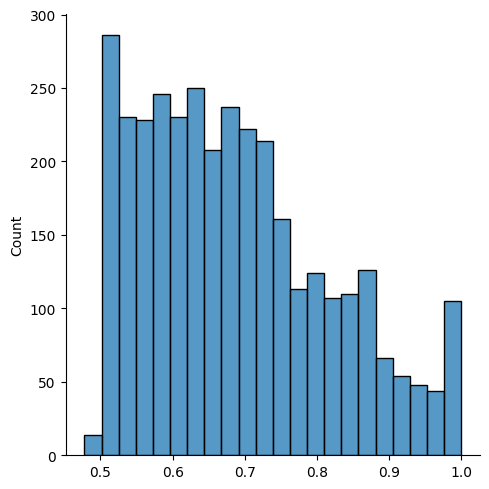

In [16]:
sns.displot(y_pred_conf[lomia_correct_indices], label='correct')

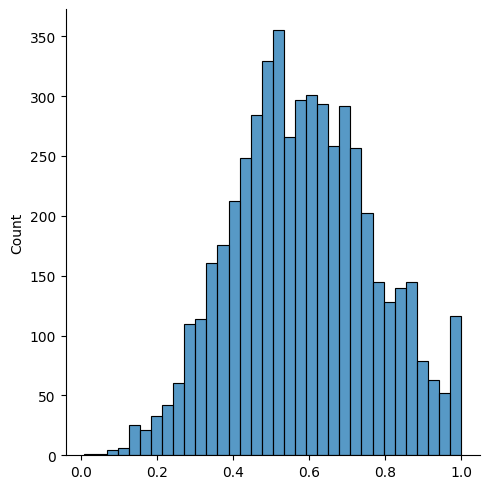

In [17]:
sns.displot(y_pred_conf[lomia_indices], label='correct')

In [75]:
sens_indices = [cols.get_loc(f'{ds.ds.meta["sensitive_column"]}_{val}') for val in ds.ds.meta["sensitive_values"]]
sensitive_col_shap_values = shap_values[:, sens_indices]

<Axes: >

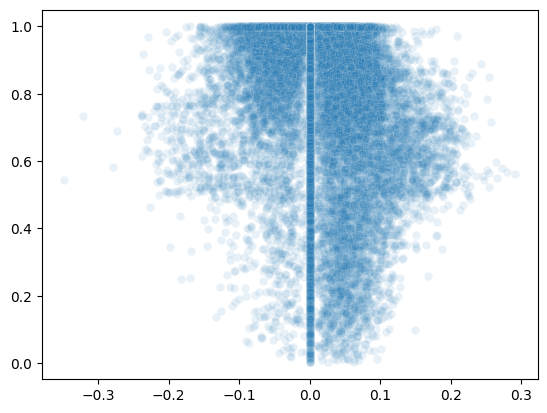

In [82]:
sns.scatterplot(x=sensitive_col_shap_values[correct_indices.to_numpy(), 1], y=y_pred_conf[correct_indices.to_numpy()], alpha=0.1)

<Axes: >

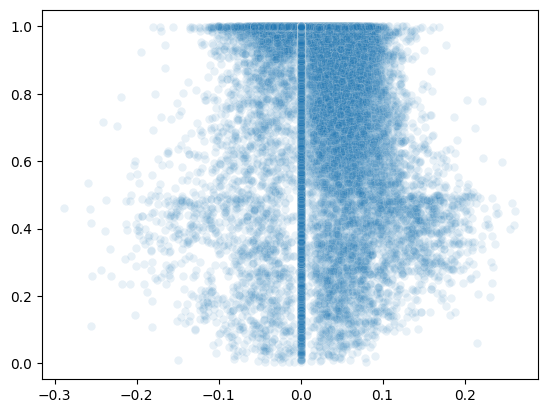

In [83]:
sns.scatterplot(x=sensitive_col_shap_values[incorrect_indices.to_numpy(), 1], y=y_pred_conf[incorrect_indices.to_numpy()], alpha=0.1)

# Permutation Importance vs LOMIA Attack Performance on Different Subgroups

In [87]:
def get_perm_imp(r):
    result_mean, result_std = {}, {}
    # for i in r.importances_mean.argsort()[::-1]:
    for i in range(len(r.importances_mean)):
        # if r.importances_mean[i] - 2 * r.importances_std[i] > 0 or True:
        # print(i)
        if cols[i] in all_sensitive_col_full_names:
            # print(f"{cols[i]} "
            #     f"{r.importances_mean[i]:.8f}"
            #     f" +/- {r.importances_std[i]:.8f}")
            result_mean[cols[i]] = r.importances_mean[i]
            result_std[cols[i]] = r.importances_std[i]

    return result_mean, result_std

all_sensitive_col_full_names = [f'{col}' for col in cols.to_numpy() if col.split('_')[0] in all_sensitive_columns + ['MAR']]

r_rac1ps = []

for i in range(2):
    rac1p_indices = get_indices_by_conditions(ds, X_train, {'RAC1P': i})
    r_rac1ps.append(permutation_importance(clf, X_train.loc[rac1p_indices,:] , ds.ds.y_enc.transform(y_tr[rac1p_indices.to_numpy()]).toarray(),
                            n_repeats=30,
                            random_state=0))
    
perm_imps_race = {
    i: get_perm_imp(r_rac1ps[i])[0] for i in range(2)
}
# perm_imps_race['all'] = get_perm_imp(r_train)[0]

In [88]:
perm_imps_race_df = pd.DataFrame(perm_imps_race)

# for col in ['MAR', 'DREM', 'DPHY', 'DEAR', 'DEYE']:
#     results_race_df.loc[col] = results_race_df.loc[f'{col}_1'] / results_race_df.loc[f'{col}_0']

    # results_race_df.loc[col] = results_race_df.loc[col] / results_race_df.loc[col]['all']

perm_imps_race_df

,0,1
MAR_0,0.008589,0.008940
MAR_1,0.007039,0.010989
DREM_0,0.000590,0.000470
DREM_1,0.001642,0.000964
DPHY_0,0.000863,0.000418
DPHY_1,0.002103,0.000856
DEAR_0,0.002086,0.000277
DEAR_1,0.003039,0.001106
DEYE_0,0.000477,0.000309
DEYE_1,0.001104,0.000575


In [93]:
aucs_df = pd.DataFrame(aucs, columns=['MAR', 'DEAR', 'DEYE', 'DREM', 'DPHY']).T

aucs_df

,1,0
MAR,62.363871,58.172708
DEAR,47.718611,47.146419
DEYE,45.459531,50.725307
DREM,59.143246,55.248223
DPHY,55.521323,55.488861


In [94]:
recalls_df = pd.DataFrame(recalls, columns=['MAR', 'DEAR', 'DEYE', 'DREM', 'DPHY']).T
recalls_df

,1,0
MAR,48.687672,44.240932
DEAR,54.205607,48.114901
DEYE,54.028436,52.439024
DREM,69.433962,80.802792
DPHY,48.192771,58.853288


# Model Inversion with Full Records

In [7]:
X, y = ds.ds.get_attack_df()
# Convert X to float
X = X.astype(float)
y_onehot = ds.ds.sensitive_enc.transform(y.to_numpy().ravel().reshape(-1, 1)).toarray()

In [13]:
save_model = True

try:
    inv_clfs = model_utils.load_model(f'<PATH_TO_MODEL>/{ds.ds.filenameroot}_inverse_model.pkl')
except:
    x_tr, x_te, y_tr, y_te = train_test_split(X, y_onehot, test_size=0.9, random_state=42)

    inv_clf = model_utils.get_model(max_iter=500)
    inv_clf.fit(x_tr, y_tr)
    # inv_clf = model_utils.proxy_train_mlp(x_tr.to_numpy(), y_tr, epochs=100)
    # inv_clfs[test_size] = inv_clf

    acc = 100 * inv_clf.score(x_te, y_te)
    print(f'Inverse accuracy with test size : {acc}')

    if save_model:
        model_utils.save_model(inv_clf, f'<PATH_TO_MODEL>/{ds.ds.filenameroot}_inverse_model.pkl')

Inverse accuracy with test size : 97.99333333333334


In [26]:
save_model = True
all_sensitive_columns = ['MAR', 'DEAR', 'DEYE', 'DREM', 'DPHY']

subgroup_disparity_dicts = {}

for sensitive_column in all_sensitive_columns:
    temp_ds = data_utils.CensusWrapper(
            filter_prop="none", ratio=float(0.5), split="all", name="Census19", sampling_condition_dict_list=sampling_condition_dict_list, sensitive_column=sensitive_column)
    temp_ds.ds.filenameroot = temp_ds.ds.name + f"_{subgroup_col_name}_{round(100*split_ratio_first_subgroup)}_{round(100*(1-split_ratio_first_subgroup))}_minority_categorized"
    X, y = temp_ds.ds.get_attack_df()

    X = X.astype(float)

    y_onehot = temp_ds.ds.sensitive_enc.transform(y.to_numpy().ravel().reshape(-1, 1)).toarray()

    subgroup_columns = ['RAC1P']

    try:
        inv_clf = model_utils.load_model(f'<PATH_TO_MODEL>/{temp_ds.ds.filenameroot}_inverse_model_{sensitive_column}.pkl')

    except:
        x_tr, x_te, y_tr, y_te = train_test_split(X, y_onehot, test_size=0.9, random_state=42)

        inv_clf = model_utils.get_model(max_iter=500)
        inv_clf.fit(x_tr, y_tr)
        # inv_clf = model_utils.proxy_train_mlp(x_tr.to_numpy(), y_tr, epochs=100)
        # inv_clfs[test_size] = inv_clf

        acc = 100 * inv_clf.score(x_te, y_te)
        print(f'Inverse accuracy with test size : {acc}')

        if save_model:
            model_utils.save_model(inv_clf, f'<PATH_TO_MODEL>/{temp_ds.ds.filenameroot}_inverse_model_{sensitive_column}.pkl')
    
    subgroup_disparity_dict = get_disparity_by_subgroup(attack_type='INV', ds=ds, subgroup_columns=['RAC1P'], X_att_query=X, y_att_query=y, metric='auc', clf=inv_clf)
    subgroup_disparity_dicts[sensitive_column] = subgroup_disparity_dict

In [27]:
subgroup_disparity_dicts

{'MAR': {'RAC1P': {1: 74.503650936986, 0: 68.81667854748952}},
 'DEAR': {'RAC1P': {1: 61.754802804491405, 0: 59.63015966753882}},
 'DEYE': {'RAC1P': {1: 59.57671308122169, 0: 56.69771461494143}},
 'DREM': {'RAC1P': {1: 67.11969541963973, 0: 61.30343161275131}},
 'DPHY': {'RAC1P': {1: 61.02070578055616, 0: 64.84090812069225}}}

In [ ]:
load_model = False
save_model = False

if load_model:
    inv_clfs = model_utils.load_model(f'<PATH_TO_MODEL>/{ds.ds.name}_inverse_model.pkl')
else:

    inv_clfs = {}

    for test_size in [0.5, 0.6, 0.7, 0.8, 0.9]:
        x_tr, x_te, y_tr, y_te = train_test_split(X, y_onehot, test_size=test_size, random_state=42)

        # inv_clf = model_utils.get_model(max_iter=500, hidden_layer_sizes=(60, 50, 40, 30, 20, 10))
        # pca_clf.fit(x_tr, y_tr)
        inv_clf = model_utils.proxy_train_mlp(x_tr.to_numpy(), y_tr, epochs=100)
        inv_clfs[test_size] = inv_clf

        acc = 100 * inv_clf.score(x_te, y_te)
        print(f'Inverse accuracy with test size {test_size}: {acc}')

    if save_model:
        model_utils.save_model(inv_clfs, f'<PATH_TO_MODEL>/{ds.ds.name}_inverse_model.pkl')

In [13]:
inv_names = []
inv_aucs = []

for test_size in [0.9, 0.8, 0.7, 0.6, 0.5]:
    x_tr, x_te, y_tr, y_te = train_test_split(X, y_onehot, test_size=test_size, random_state=42)

    inv_clf = inv_clfs[test_size]
    
    # calculate auc
    y_pred = inv_clf.predict_proba(x_te)
    auc = roc_auc_score(y_te, y_pred)
    inv_names.append(f'Inverse-{round((1-test_size)*100)}%')
    inv_aucs.append(auc*100)
    print(f'AUC with test size {test_size}: {auc}')

X has feature names, but MLPClassifier was fitted without feature names
X has feature names, but MLPClassifier was fitted without feature names
X has feature names, but MLPClassifier was fitted without feature names
X has feature names, but MLPClassifier was fitted without feature names
X has feature names, but MLPClassifier was fitted without feature names


AUC with test size 0.9: 0.6781803649833609
AUC with test size 0.8: 0.7067886557938723
AUC with test size 0.7: 0.6349196025788865
AUC with test size 0.6: 0.6502157232068793
AUC with test size 0.5: 0.6738628827857591


In [14]:
subgroup_columns = ['sex', 'race', 'relig']

# if 'att_enc' not in globals():
#     y_onehot, att_enc = model_utils.get_onehot(y.to_numpy().ravel().reshape(-1,1))
test_size = 0.9

x_tr, x_te, y_tr, y_te = train_test_split(X, y, test_size=test_size, random_state=42)

inv_clf = inv_clfs[test_size]
subgroup_disparity_dict = get_subgroup_disparity(ds, subgroup_columns, inv_clf, x_te, y_te, metric='auc')

X has feature names, but MLPClassifier was fitted without feature names
X has feature names, but MLPClassifier was fitted without feature names
X has feature names, but MLPClassifier was fitted without feature names
X has feature names, but MLPClassifier was fitted without feature names
X has feature names, but MLPClassifier was fitted without feature names
X has feature names, but MLPClassifier was fitted without feature names
X has feature names, but MLPClassifier was fitted without feature names
X has feature names, but MLPClassifier was fitted without feature names


In [15]:
subgroup_disparity_dict

{'sex': {'asrs': {'female': 67.787787006559, 'male': 68.25819129634048},
  'dists': {'female': 0.46091587952206253, 'male': 0.46132652413598085}},
 'race': {'asrs': {'white': 67.83822944792823,
   'other': 63.72492836676217,
   'black': 65.22246835986468},
  'dists': {'white': 0.5049655543241308,
   'other': 0.4823537204992204,
   'black': 0.5550439121607077}},
 'relig': {'asrs': {'catholic': 66.1844343192983,
   'protestant': 69.85981177565084,
   'none': 63.58577814409718},
  'dists': {'catholic': 0.42173846127528336,
   'protestant': 0.5497922965933532,
   'none': 0.30830465067547735}}}

# Grad Approach

In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

# Step 1: Prepare the dataset
# Assuming you have already loaded and preprocessed the GSS dataset
X_train_for_grad, X_test_for_grad, y_train_for_grad, y_test_for_grad = torch.tensor(x_tr, dtype=torch.float32, requires_grad=True), torch.tensor(x_te, dtype=torch.float32, requires_grad=True), torch.tensor(y_tr, dtype=torch.float32, requires_grad=True), torch.tensor(y_te, dtype=torch.float32, requires_grad=True)

# Step 2: Create a custom dataset
class GradAttDataset(Dataset):
    def __init__(self, features, labels):
        self.features = features
        self.labels = labels

    def __len__(self):
        return len(self.features)

    def __getitem__(self, index):
        x = torch.Tensor(self.features[index])
        y = torch.Tensor([self.labels[index]])
        return x, y

train_dataset = GradAttDataset(X_train_for_grad, y_train_for_grad)
test_dataset = GradAttDataset(X_test_for_grad, y_test_for_grad)

# Step 8: Train the model
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)

In [5]:
all_sensitive_columns = ['default', 'DEAR', 'DEYE', 'DREM', 'DPHY']

In [6]:
def check_if_grad_stored():
    # check if the following list of files exist
    # if they do, then we have already stored the gradients
    # if not, then we need to store the gradients
    filenames = [f'grads/{ds.ds.filenameroot}_{sens_col}_orig_grads.npy' for sens_col in all_sensitive_columns]
    return all([os.path.exists(filename) for filename in filenames])

if not check_if_grad_stored():
    for i, sens_col in enumerate(all_sensitive_columns):
        meta = data_utils.CensusWrapper(name='Census19', sensitive_column=sens_col, preload=False).ds.meta
        sens_indices = [cols.get_loc(f'{meta["sensitive_column"]}_{val}') for val in meta["sensitive_values"]]
        sens_attrs = []
        scores = []
        orig_grads = []
        grads_after_flip = []
        y_trues = []
        
        target_model = port_mlp_to_ch(clf)
        optim = torch.optim.Adam(target_model.parameters(), lr=0.001)
        # for batch in tqdm(train_loader):
        for idx, batch in enumerate(train_loader):
            # if idx > 100:
            #     break
            optim.zero_grad()
            # batch = next(iter(train_loader))
            x, y = batch
            x, y = x.to('mps'), y.to('mps')
            y_pred = target_model(x)
            loss_fn = nn.CrossEntropyLoss()
            loss = loss_fn(y_pred, y.long().reshape(-1))
            # loss = nn.CrossEntropyLoss()(y_pred, y.long())
            loss.backward()
            grad = [p.grad.clone().detach().cpu().numpy().reshape(-1) for p in target_model.parameters()]
            grad = np.concatenate(grad)
            orig_grads.append(grad)

            optim.zero_grad()
            x_np = x.clone().detach().cpu().numpy()
            # x_np[0,55:57] = 1 - x_np[0,55:57]
            x_np[0, sens_indices] = 1 - x_np[0, sens_indices]
            x_clone = torch.tensor(x_np, requires_grad=True).to('mps')
            y_pred2 = target_model(x_clone)
            loss_fn = nn.CrossEntropyLoss()
            loss = loss_fn(y_pred2, y.long().reshape(-1))
            loss.backward()
            grad2 = [p.grad.clone().detach().cpu().numpy().reshape(-1) for p in target_model.parameters()]
            grad2 = np.concatenate(grad2)
            grads_after_flip.append(grad2)

            # if x_np[0,55] == 1:
            if x_np[0, sens_indices[0]] == 1:
                sens_attr = 0
                # score = np.linalg.norm(grad) - np.linalg.norm(grad2)
                score = np.linalg.norm(grad - grad2)
            else:
                sens_attr = 1
                # score = np.linalg.norm(grad2) - np.linalg.norm(grad)
                score = np.linalg.norm(grad2 - grad)

            sens_attrs.append(sens_attr)
            scores.append(score)

        orig_grads = np.array(orig_grads)
        grads_after_flip = np.array(grads_after_flip)
        np.save(f'<PATH_TO_GRADS>/{ds.ds.filenameroot}_{sens_col}_orig_grads.npy', orig_grads)
        np.save(f'<PATH_TO_GRADS>/{ds.ds.filenameroot}_{sens_col}_grads_after_flip.npy', grads_after_flip)
        np.save(f'<PATH_TO_GRADS>/{ds.ds.filenameroot}_{sens_col}_sens_attrs.npy', sens_attrs)
        np.save(f'<PATH_TO_GRADS>/{ds.ds.filenameroot}_{sens_col}_scores.npy', scores)

In [18]:
all_sensitive_columns = ['default', 'DEAR', 'DEYE', 'DREM', 'DPHY']

aucs, recalls = {}, {}

subgroup_disparity_dicts = {}

for sens_col in all_sensitive_columns:
    temp_ds = data_utils.CensusWrapper(
            filter_prop="none", ratio=float(0.5), split="all", name="Census19", sampling_condition_dict_list=sampling_condition_dict_list, sensitive_column=sens_col)
    temp_ds.ds.filenameroot = temp_ds.ds.name + f"_{subgroup_col_name}_{round(100*split_ratio_first_subgroup)}_{round(100*(1-split_ratio_first_subgroup))}_minority_categorized"
    X, y = temp_ds.ds.get_attack_df()

    orig_grads = np.load(f'<PATH_TO_GRADS>/{ds.ds.filenameroot}_{sens_col}_orig_grads.npy')
    grads_after_flip = np.load(f'<PATH_TO_GRADS>/{ds.ds.filenameroot}_{sens_col}_grads_after_flip.npy')
    sens_attrs = np.load(f'<PATH_TO_GRADS>/{ds.ds.filenameroot}_{sens_col}_sens_attrs.npy')
    scores = np.load(f'<PATH_TO_GRADS>/{ds.ds.filenameroot}_{sens_col}_scores.npy')

    tpr, fpr, thresholds = roc_curve(sens_attrs, scores)
    # get the threshold with tpr = 0.5
    best_threshold = thresholds[np.argmin(np.abs(tpr - 0.5))]
    # best_threshold = thresholds[np.argmax(tpr - fpr)]


    subgroup_columns = ['RAC1P', 'SEX']

    subgroup_disparity_dict = get_disparity_by_subgroup(attack_type='GRAD', ds=ds, X_att_query=X, y_att_query=y, y_pred=scores, threshold=best_threshold, subgroup_columns=subgroup_columns, metric='recall')

    subgroup_disparity_dicts[sens_col] = subgroup_disparity_dict

In [19]:
subgroup_disparity_dicts

{'default': {'RAC1P': {1: 63.415260219469936, 0: 63.44023745746761},
  'SEX': {1: 62.98996607233091, 0: 63.81650903943898}},
 'DEAR': {'RAC1P': {1: 46.728971962616825, 0: 48.83303411131059},
  'SEX': {1: 45.0, 0: 50.101832993890014}},
 'DEYE': {'RAC1P': {1: 54.976303317535546, 0: 53.35365853658537},
  'SEX': {1: 54.961832061068705, 0: 53.068592057761734}},
 'DREM': {'RAC1P': {1: 74.71698113207546, 0: 72.07678883071553},
  'SEX': {1: 76.41277641277642, 0: 69.60556844547564}},
 'DPHY': {'RAC1P': {1: 57.831325301204814, 0: 61.72006745362564},
  'SEX': {1: 59.71563981042654, 0: 61.42857142857143}}}

In [7]:
original_aucs = {}

for i, sens_col in enumerate(all_sensitive_columns):
    orig_grads = np.load(f'<PATH_TO_GRADS>/{ds.ds.filenameroot}_{sens_col}_orig_grads.npy')
    grads_after_flip = np.load(f'<PATH_TO_GRADS>/{ds.ds.filenameroot}_{sens_col}_grads_after_flip.npy')
    sens_attrs = np.load(f'<PATH_TO_GRADS>/{ds.ds.filenameroot}_{sens_col}_sens_attrs.npy')
    scores = np.load(f'<PATH_TO_GRADS>/{ds.ds.filenameroot}_{sens_col}_scores.npy')

    print(f'For {sens_col}')
    auc = roc_auc_score(sens_attrs, scores)
    original_aucs[sens_col] = auc
    print(f'AUC: {auc}')

For default
AUC: 0.6476858526863468
For DEAR
AUC: 0.48759679708577075
For DEYE
AUC: 0.5616304992306864
For DREM
AUC: 0.6630824018667425
For DPHY
AUC: 0.5569854182920186


In [71]:
auc_dict_sex = {
    'male': {},
    'female': {},
    'all': {},
}

for i, sens_col in enumerate(all_sensitive_columns):
    orig_grads = np.load(f'<PATH_TO_GRADS>/{ds.ds.filenameroot}_{sens_col}_orig_grads.npy')
    grads_after_flip = np.load(f'<PATH_TO_GRADS>/{ds.ds.filenameroot}_{sens_col}_grads_after_flip.npy')
    sens_attrs = np.load(f'<PATH_TO_GRADS>/{ds.ds.filenameroot}_{sens_col}_sens_attrs.npy')
    scores = np.load(f'<PATH_TO_GRADS>/{ds.ds.filenameroot}_{sens_col}_scores.npy')

    # print(f'For {sens_col}')
    # auc = roc_auc_score(sens_attrs, scores)
    auc_dict_sex['male'][sens_col] = roc_auc_score(sens_attrs[male_indices.to_numpy()], scores[male_indices.to_numpy()])
    auc_dict_sex['female'][sens_col] = roc_auc_score(sens_attrs[female_indices.to_numpy()], scores[female_indices.to_numpy()])

    # print(f'AUC: {auc}')
    auc_dict_sex['all'][sens_col] = original_aucs[sens_col]

In [10]:
auc_dict_race = { i: {} for i in range(2) }
auc_dict_race['all'] = {}

race_marginal_prior_dict = (100 * ds.ds.original_df['RAC1P'].value_counts() / len(ds.ds.original_df)).to_dict()

for i in range(2):
    auc_dict_race[i]['marginal prior'] = race_marginal_prior_dict[i]
auc_dict_race['all']['marginal prior'] = 100

for i, sens_col in enumerate(all_sensitive_columns):
    orig_grads = np.load(f'<PATH_TO_GRADS>/{ds.ds.filenameroot}_{sens_col}_orig_grads.npy')
    grads_after_flip = np.load(f'<PATH_TO_GRADS>/{ds.ds.filenameroot}_{sens_col}_grads_after_flip.npy')
    sens_attrs = np.load(f'<PATH_TO_GRADS>/{ds.ds.filenameroot}_{sens_col}_sens_attrs.npy')
    scores = np.load(f'<PATH_TO_GRADS>/{ds.ds.filenameroot}_{sens_col}_scores.npy')
    

    for idx in range(2):
        rac1p_indices = get_indices_by_conditions(ds, X_train, {'RAC1P': idx})
        try:
            auc_dict_race[idx][sens_col] = roc_auc_score(sens_attrs[rac1p_indices.to_numpy()], scores[rac1p_indices.to_numpy()])
        except:
            auc_dict_race[idx][sens_col] = np.nan

    auc_dict_race['all'][sens_col] = original_aucs[sens_col]

In [11]:
auc_dict_race

{0: {'marginal prior': 50.0,
  'default': 0.647379021541672,
  'DEAR': 0.4868129586303237,
  'DEYE': 0.5534926704354963,
  'DREM': 0.6886042360509976,
  'DPHY': 0.5510146379034313},
 1: {'marginal prior': 50.0,
  'default': 0.6479593148231328,
  'DEAR': 0.48838308799354085,
  'DEYE': 0.5687775620287765,
  'DREM': 0.6373752848068865,
  'DPHY': 0.5624514830371246},
 'all': {'marginal prior': 100,
  'default': 0.6476858526863468,
  'DEAR': 0.48759679708577075,
  'DEYE': 0.5616304992306864,
  'DREM': 0.6630824018667425,
  'DPHY': 0.5569854182920186}}

In [17]:
all_sensitive_col_full_names = [f'{col}' for col in cols.to_numpy() if col.split('_')[0] in all_sensitive_columns + ['MAR']]

In [20]:
male_indices = get_indices_by_conditions(ds, X_train, {'SEX': 0})
female_indices = get_indices_by_conditions(ds, X_train, {'SEX': 1})

In [26]:
r_male = permutation_importance(clf, X_train.loc[male_indices,:] , ds.ds.y_enc.transform(y_tr[male_indices.to_numpy()]).toarray(),
                           n_repeats=30,
                           random_state=0)

In [27]:
r_female = permutation_importance(clf, X_train.loc[female_indices,:] , ds.ds.y_enc.transform(y_tr[female_indices.to_numpy()]).toarray(),
                           n_repeats=30,
                           random_state=0)

In [29]:
r_rac1ps = []

for i in range(2):
    rac1p_indices = get_indices_by_conditions(ds, X_train, {'RAC1P': str(i)})
    r_rac1ps.append(permutation_importance(clf, X_train.loc[rac1p_indices,:] , ds.ds.y_enc.transform(y_tr[rac1p_indices.to_numpy()]).toarray(),
                            n_repeats=30,
                            random_state=0))

In [30]:
def get_perm_imp(r):
    result_mean, result_std = {}, {}
    # for i in r.importances_mean.argsort()[::-1]:
    for i in range(len(r.importances_mean)):
        # if r.importances_mean[i] - 2 * r.importances_std[i] > 0 or True:
        # print(i)
        if cols[i] in all_sensitive_col_full_names:
            # print(f"{cols[i]} "
            #     f"{r.importances_mean[i]:.8f}"
            #     f" +/- {r.importances_std[i]:.8f}")
            result_mean[cols[i]] = r.importances_mean[i]
            result_std[cols[i]] = r.importances_std[i]

    return result_mean, result_std


In [31]:
results = {
    'male': get_perm_imp(r_male)[0],
    'female': get_perm_imp(r_female)[0],
    'all': get_perm_imp(r_train)[0],
}

In [33]:
results_race = {
    i: get_perm_imp(r_rac1ps[i])[0] for i in range(2)
}
results_race['all'] = get_perm_imp(r_train)[0]

In [75]:
results_sex_df = pd.DataFrame(results)
# for col in ['MAR', 'DREM', 'DPHY', 'DEAR', 'DEYE']:
#     results_sex_df.loc[col] = results_sex_df.loc[f'{col}_1'] / results_sex_df.loc[f'{col}_0']

    # results_sex_df.loc[col] = results_sex_df.loc[col] / results_sex_df.loc[col]['all']

results_sex_df

,male,female,all
MAR_0,0.016111,0.008089,0.012179
MAR_1,0.014000,0.007113,0.010555
DREM_0,0.001769,0.001008,0.001328
DREM_1,0.002538,0.001145,0.001857
DPHY_0,0.001077,0.000790,0.000925
DPHY_1,0.002344,0.001717,0.002009
DEAR_0,0.002284,0.000467,0.001397
DEAR_1,0.003987,0.000826,0.002379
DEYE_0,0.000577,0.000177,0.000325
DEYE_1,0.001511,0.000887,0.001200


In [76]:
pd.DataFrame(auc_dict_sex, index=['default', 'DREM', 'DPHY', 'DEAR', 'DEYE'])

,male,female,all
default,0.650452,0.648575,0.649556
DREM,0.676439,0.658132,0.667341
DPHY,0.539627,0.562294,0.550872
DEAR,0.461679,0.468535,0.465031
DEYE,0.573676,0.595514,0.584084


In [60]:
results_race_df = pd.DataFrame(results_race)

# for col in ['MAR', 'DREM', 'DPHY', 'DEAR', 'DEYE']:
#     results_race_df.loc[col] = results_race_df.loc[f'{col}_1'] / results_race_df.loc[f'{col}_0']

    # results_race_df.loc[col] = results_race_df.loc[col] / results_race_df.loc[col]['all']

results_race_df

,0,1,all
MAR_0,0.015299,0.008398,0.012179
MAR_1,0.011381,0.009522,0.010555
DREM_0,0.001551,0.001136,0.001328
DREM_1,0.002199,0.001479,0.001857
DPHY_0,0.001290,0.000597,0.000925
DPHY_1,0.002466,0.001710,0.002009
DEAR_0,0.002108,0.000715,0.001397
DEAR_1,0.003345,0.001466,0.002379
DEYE_0,0.000415,0.000313,0.000325
DEYE_1,0.001365,0.000917,0.001200


In [77]:
auc_race_df = pd.DataFrame(auc_dict_race, index=['marginal prior', 'default', 'DREM', 'DPHY', 'DEAR', 'DEYE'])
auc_race_df = auc_race_df.rename(index={'default': 'MAR'})
auc_race_df

,0,1,all
marginal prior,90.000000,10.000000,100.000000
MAR,0.650119,0.644419,0.649556
DREM,0.667973,0.661995,0.667341
DPHY,0.548765,0.570692,0.550872
DEAR,0.464299,0.471844,0.465031
DEYE,0.586810,0.554370,0.584084


# PCA Approach

In [4]:
X, y = ds.ds.get_attack_df()
# Convert X to float
X = X.astype(float)
y_onehot = ds.ds.sensitive_enc.transform(y.to_numpy().ravel().reshape(-1, 1)).toarray()

In [22]:
save_model = True
all_sensitive_columns = ['MAR', 'DEAR', 'DEYE', 'DREM', 'DPHY']

subgroup_disparity_dicts = {}

for sensitive_column in all_sensitive_columns:
    temp_ds = data_utils.CensusWrapper(
            filter_prop="none", ratio=float(0.5), split="all", name="Census19", sampling_condition_dict_list=sampling_condition_dict_list, sensitive_column=sensitive_column)
    temp_ds.ds.filenameroot = temp_ds.ds.name + f"_{subgroup_col_name}_{round(100*split_ratio_first_subgroup)}_{round(100*(1-split_ratio_first_subgroup))}_minority_categorized"
    X, y = temp_ds.ds.get_attack_df()

    X = X.astype(float)
    y_onehot = ds.ds.sensitive_enc.transform(y.to_numpy().ravel().reshape(-1, 1)).toarray()

    subgroup_columns = ['RAC1P']

    try:
        pca_clf = model_utils.load_model(f'<PATH_TO_MODEL>/{temp_ds.ds.filenameroot}_pca_model_{sensitive_column}.pkl')
        with open(f'<PATH_TO_MODEL>/{temp_ds.ds.filenameroot}_pca_model_pca_{sensitive_column}.pkl', 'rb') as f:
            pca = pickle.load(f)
    except:
        x_tr, x_te, y_tr, y_te = train_test_split(X, y_onehot, test_size=0.9, random_state=42)

        pca = PCA(n_components=2)
        pca.fit(x_tr)
            
        x_tr, x_te = map(lambda x: pd.DataFrame(pca.transform(x), index=x.index), [x_tr, x_te])

        pca_clf = model_utils.get_model(max_iter=500)
        pca_clf.fit(x_tr, y_tr)

        if save_model:
            model_utils.save_model(pca_clf, f'<PATH_TO_MODEL>/{temp_ds.ds.filenameroot}_pca_model_{sensitive_column}.pkl')
            with open(f'<PATH_TO_MODEL>/{temp_ds.ds.filenameroot}_pca_model_pca_{sensitive_column}.pkl', 'wb') as f:
                pickle.dump(pca, f)

    X = pd.DataFrame(pca.transform(X), index=X.index)
    
    subgroup_disparity_dict = get_disparity_by_subgroup(attack_type='PCA', ds=ds, subgroup_columns=['RAC1P'], X_att_query=X, y_att_query=y, metric='auc', clf=pca_clf)
    subgroup_disparity_dicts[sensitive_column] = subgroup_disparity_dict

In [23]:
subgroup_disparity_dicts

{'MAR': {'RAC1P': {1: 69.00930044897729, 0: 61.73576319512462}},
 'DEAR': {'RAC1P': {1: 53.78589395046202, 0: 46.75020169812574}},
 'DEYE': {'RAC1P': {1: 55.58175579787359, 0: 47.31056923768361}},
 'DREM': {'RAC1P': {1: 66.64049020496559, 0: 54.9295248136088}},
 'DPHY': {'RAC1P': {1: 52.9651954600731, 0: 56.10764517090312}}}

In [5]:
load_model = True
save_model = False

if load_model:
    pca_clfs = model_utils.load_model(f'<PATH_TO_MODEL>/{ds.ds.name}_pca_model.pkl')
else:

    pca_clfs = {}

    pca_clfs['pca'] = {}

    for test_size in [0.5, 0.6, 0.7, 0.8, 0.9]:
        x_tr, x_te, y_tr, y_te = train_test_split(X, y_onehot, test_size=test_size, random_state=42)

        pca = PCA(n_components=2)
        pca.fit(x_tr)
        pca_clfs['pca'][test_size] = pca
        x_tr, x_te = map(lambda x: pd.DataFrame(pca.transform(x), index=x.index), [x_tr, x_te])

        # inv_clf = model_utils.get_model(max_iter=500, hidden_layer_sizes=(60, 50, 40, 30, 20, 10))
        # inv_clf.fit(x_tr, y_tr)
        pca_clf = model_utils.proxy_train_mlp(x_tr.to_numpy(), y_tr, epochs=100)
        pca_clfs[test_size] = pca_clf

        acc = 100 * pca_clf.score(x_te, y_te)
        print(f'PCA accuracy with test size {test_size}: {acc}')

    if save_model:
        model_utils.save_model(pca_clfs, f'<PATH_TO_MODEL>/{ds.ds.name}_pca_model.pkl')

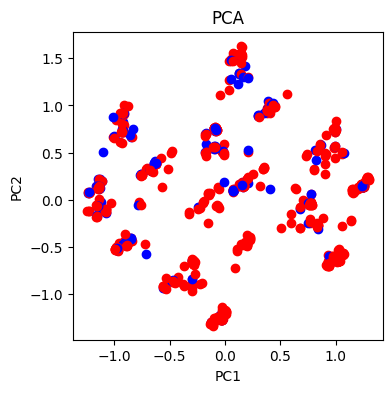

In [30]:
# plot the data in 2D
fig, ax = plt.subplots(figsize=(4, 4))
ax.set_title('PCA')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')

test_size = 0.9

x_tr, x_te, y_tr, y_te = train_test_split(X, y_onehot, test_size=test_size, random_state=42)

pca_clf = pca_clfs[test_size]
pca = pca_clfs['pca'][test_size]
x_tr, x_te = map(lambda x: pd.DataFrame(pca.transform(x), index=x.index), [x_tr, x_te])

x_te = x_te.to_numpy()

# sample only 100 points from x_te and y_te to plot
x_te, y_te = map(lambda x: x[:1000], [x_te, y_te])

# y_te has values 0 or 1
# use y_te to get the color
colors = ['red', 'blue']
for i in range(len(x_te)):
    ax.scatter(x_te[i, 0], x_te[i, 1], color=colors[y_te[i].argmax()])
plt.show()


In [8]:
pca_names = []
pca_aucs = []

for test_size in [0.9, 0.8, 0.7, 0.6, 0.5]:
    x_tr, x_te, y_tr, y_te = train_test_split(X, y_onehot, test_size=test_size, random_state=42)

    pca_clf = pca_clfs[test_size]
    pca = pca_clfs['pca'][test_size]

    x_tr, x_te = map(lambda x: pd.DataFrame(pca.transform(x), index=x.index), [x_tr, x_te])
    
    # calculate auc
    y_pred = pca_clf.predict_proba(x_te)
    auc = roc_auc_score(y_te, y_pred)
    pca_names.append(f'Inverse-{round((1-test_size)*100)}%')
    pca_aucs.append(auc*100)
    print(f'AUC with test size {test_size}: {auc}')

AUC with test size 0.9: 0.6882299137224867
AUC with test size 0.8: 0.6816837620807288
AUC with test size 0.7: 0.6872772697701737
AUC with test size 0.6: 0.6223830080585047
AUC with test size 0.5: 0.4436415919458482


In [24]:
subgroup_columns = ['sex', 'race', 'relig']

# if 'att_enc' not in globals():
#     y_onehot, att_enc = model_utils.get_onehot(y.to_numpy().ravel().reshape(-1,1))
test_size = 0.9

x_tr, x_te, y_tr, y_te = train_test_split(X, y, test_size=test_size, random_state=42)

pca_clf = pca_clfs[test_size]
pca = pca_clfs['pca'][test_size]

x_tr, x_te = map(lambda x: pd.DataFrame(pca.transform(x), index=x.index), [x_tr, x_te])

for col in subgroup_columns:
    values = ds.ds.unique_values_dict[col]
    subgroup_asrs = {}
    subgroup_dists = {}

    for val in values:
        if len(get_indices_by_conditions(ds, X, {col:val})) > 500:
            indices = get_indices_by_conditions(ds, x_te, {col:val})
            x_te_subgroup = x_te.loc[indices]
            y_te_subgroup = y_te.loc[indices]

            # calculate the correlation between x_te_subgroup features and the sensitive attribute y_te_subgroup
            corr = x_te_subgroup.corrwith(y_te_subgroup)

            print(f'Correlation between {col}={val} and y: \n {corr}')

            # subgroup_asrs[val] = get_accuracy(ds, {col:val}, neuron_clf, X_neuron, y, metric=metric)
            # subgroup_dists[val] = subgroup_vulnerability_distance(ds, {col:val}, X_neuron)

    # subgroup_disparity_dict[col] = {'asrs':subgroup_asrs, 'dists':subgroup_dists}



Correlation between sex=female and y: 
 0   -0.215873
1    0.173536
dtype: float64
Correlation between sex=male and y: 
 0   -0.247972
1    0.237983
dtype: float64
Correlation between race=white and y: 
 0   -0.214484
1    0.147567
dtype: float64
Correlation between race=other and y: 
 0   -0.227755
1    0.139988
dtype: float64
Correlation between race=black and y: 
 0   -0.295523
1    0.129385
dtype: float64
Correlation between relig=catholic and y: 
 0   -0.199335
1    0.092997
dtype: float64
Correlation between relig=protestant and y: 
 0   -0.208331
1    0.161940
dtype: float64
Correlation between relig=none and y: 
 0   -0.184526
1    0.064951
dtype: float64


In [6]:
subgroup_columns = ['sex', 'race', 'relig']

# if 'att_enc' not in globals():
#     y_onehot, att_enc = model_utils.get_onehot(y.to_numpy().ravel().reshape(-1,1))
test_size = 0.9

x_tr, x_te, y_tr, y_te = train_test_split(X, y, test_size=test_size, random_state=42)

pca_clf = pca_clfs[test_size]
pca = pca_clfs['pca'][test_size]

x_tr, x_te = map(lambda x: pd.DataFrame(pca.transform(x), index=x.index), [x_tr, x_te])

subgroup_disparity_dict = get_subgroup_disparity(ds, subgroup_columns, pca_clf, x_te, y_te, metric='auc')
# plot_subgroup_disparity(subgroup_disparity_dict, req_metrics=['asrs'])

In [7]:
subgroup_disparity_dict

{'sex': {'asrs': {'female': 67.09565537376565, 'male': 67.63211636734773},
  'dists': {'female': 0.40386482434639986, 'male': 0.4288420895965453}},
 'race': {'asrs': {'white': 68.60499680718284,
   'other': 68.1202105684014,
   'black': 70.7562722167843},
  'dists': {'white': 0.48478103092452246,
   'other': 0.4545342440718738,
   'black': 0.5227638039962372}},
 'relig': {'asrs': {'catholic': 66.1923596372757,
   'protestant': 70.54004924759978,
   'none': 62.97912350656776},
  'dists': {'catholic': 0.38058030033456874,
   'protestant': 0.4801861165946572,
   'none': 0.2762346338290832}}}

# Investigate Neuron Output

## From LOMIA Case 1

In [ ]:
X_attack_neuron = make_neuron_output_data(ds, X_attack, clf, y_columns)

In [ ]:
neuron_clf = model_utils.get_model(max_iter=500)

In [ ]:
neuron_clf.fit(X_attack_neuron, y_attack_onehot)

## From Original Data

In [15]:
X, y = ds.ds.get_attack_df()
X = X.astype(np.float32)
X_neuron = make_neuron_output_data(ds, X, clf, ds.ds.y_columns)

In [8]:
save_model = True
all_sensitive_columns = ['MAR', 'DEAR', 'DEYE', 'DREM', 'DPHY']

subgroup_disparity_dicts = {}

for sensitive_column in all_sensitive_columns:
    temp_ds = data_utils.CensusWrapper(
            filter_prop="none", ratio=float(0.5), split="all", name="Census19", sampling_condition_dict_list=sampling_condition_dict_list, sensitive_column=sensitive_column)
    temp_ds.ds.filenameroot = temp_ds.ds.name + f"_{subgroup_col_name}_{round(100*split_ratio_first_subgroup)}_{round(100*(1-split_ratio_first_subgroup))}_minority_categorized"
    X, y = temp_ds.ds.get_attack_df()

    X = X.astype(float)

    y_onehot = temp_ds.ds.sensitive_enc.transform(y.to_numpy().ravel().reshape(-1, 1)).toarray()

    subgroup_columns = ['RAC1P']

    try:
        neur_ours_clf = model_utils.load_model(f'<PATH_TO_MODEL>/{temp_ds.ds.filenameroot}_neurours_model_{sensitive_column}.pkl')

    except:
        x_tr, x_te, y_tr, y_te = train_test_split(X, y_onehot, test_size=0.9, random_state=42)

        x_n_tr = make_neuron_output_data(temp_ds, x_tr, clf, temp_ds.ds.y_columns)
        x_n_te = make_neuron_output_data(temp_ds, x_te, clf, temp_ds.ds.y_columns)

        neur_ours_clf = model_utils.get_model(max_iter=500)
        neur_ours_clf.fit(x_n_tr, y_tr)
        # inv_clf = model_utils.proxy_train_mlp(x_tr.to_numpy(), y_tr, epochs=100)
        # inv_clfs[test_size] = inv_clf

        acc = 100 * neur_ours_clf.score(x_n_te, y_te)
        print(f'NeurOurs accuracy with test size : {acc}')

        if save_model:
            model_utils.save_model(neur_ours_clf, f'<PATH_TO_MODEL>/{temp_ds.ds.filenameroot}_neurours_model_{sensitive_column}.pkl')
    
    subgroup_disparity_dict = get_disparity_by_subgroup(attack_type='NEUR_OURS', ds=temp_ds, subgroup_columns=['RAC1P'], X_att_query=X, y_att_query=y, metric='recall', clf=neur_ours_clf, df=X, MLP=clf)
    subgroup_disparity_dicts[sensitive_column] = subgroup_disparity_dict

In [9]:
subgroup_disparity_dicts

{'MAR': {'RAC1P': {1: 82.78893666174677, 0: 68.04459567074494}},
 'DEAR': {'RAC1P': {1: 10.2803738317757, 0: 10.412926391382406}},
 'DEYE': {'RAC1P': {1: 9.004739336492891, 0: 12.195121951219512}},
 'DREM': {'RAC1P': {1: 12.830188679245284, 0: 11.8673647469459}},
 'DPHY': {'RAC1P': {1: 8.032128514056225, 0: 11.63575042158516}}}

In [16]:
# subset features of X_neuron: 0:32 and 59:91
X_neuron = X_neuron.iloc[:,np.concatenate((np.arange(0,32), np.arange(59,91)))]

In [17]:
# find the indices of the data points that are correctly classified by the target model
# the prediction is a one-hot encoded vector, so we need to take the argmax to get the class label
df_x, df_y = ds.ds.df.drop([ds.ds.meta["y_column"], 'is_train'], axis=1), ds.ds.df[[ds.ds.meta["y_column"]]]
correct_indices = np.where(df_y.to_numpy().squeeze() != clf.predict(df_x).argmax(axis=1))[0]

In [ ]:
# get the data points that are correctly classified by the target model
# X, y, X_neuron = X.iloc[correct_indices, :], y.iloc[correct_indices], X_neuron.iloc[correct_indices, :]

In [18]:
# Split x and y into train and test
load_model = False
save_model = False

test_sizes = [0.5, 0.6, 0.7, 0.8, 0.9]
# test_sizes = [0.5]

if load_model:
    neuron_clfs = model_utils.load_model(f'<PATH_TO_MODEL>/neuron_clfs_{ds.ds.name}.pkl')
    x_n_tr, x_n_te, y_n_tr, y_n_te = train_test_split(X_neuron, y, test_size=test_sizes[0], random_state=42)
    y_n_tr_onehot = ds.ds.sensitive_enc.transform(y_n_tr.to_numpy().ravel().reshape(-1,1)).toarray()
else:
    neuron_clfs={}

    hidden_layers = [64, 32, 16, 8, 4]

    lomia_case_1_indices = get_LOMIA_case_1_correct_examples(ds, X_train)
    # subset lomia_case_1_indices with the correct indices
    # lomia_case_1_indices = np.intersect1d(lomia_case_1_indices, correct_indices)
    if 'lomia_case_1_indices' in globals():
        x_n_tr, x_n_te, y_n_tr, y_n_te = X_neuron.iloc[lomia_case_1_indices], X_neuron.iloc[~np.isin(np.arange(len(X_neuron)), lomia_case_1_indices)], y[lomia_case_1_indices], y[~np.isin(np.arange(len(X_neuron)), lomia_case_1_indices)]

        x_n_tr, x_n_te = data_utils.normalize(x_n_tr, x_n_te)

        y_n_tr = ds.ds.sensitive_enc.transform(y_n_tr.to_numpy().ravel().reshape(-1,1)).toarray()
        # new_clf = model_utils.get_model(max_iter=2000)
        # # new_clf.set_params(hidden_layer_sizes=hidden_layers)
        # new_clf.set_params(alpha=0.1, solver='adam', activation='relu')
        # neuron_clfs['lomia_case_1'] = new_clf
        # neuron_clfs['lomia_case_1'].fit(x_n_tr, y_n_tr)
        neuron_clfs['lomia_case_1'] = proxy_train_mlp(x_n_tr.to_numpy(), y_n_tr, epochs=100)

    for test_size in test_sizes:
        x_n_tr, x_n_te, y_n_tr, y_n_te = train_test_split(X_neuron, y, test_size=test_size, random_state=42)
        y_n_tr = ds.ds.sensitive_enc.transform(y_n_tr.to_numpy().ravel().reshape(-1,1)).toarray()

        x_n_tr, x_n_te = data_utils.normalize(x_n_tr, x_n_te)
        
        # new_clf = model_utils.get_model(max_iter=2000)
        # # new_clf.set_params(hidden_layer_sizes=hidden_layers)
        # new_clf.set_params(alpha=0.1, solver='adam', activation='relu')
        # neuron_clfs[test_size] = new_clf
        # neuron_clfs[test_size].fit(x_n_tr, y_n_tr)
        neuron_clfs[test_size] = proxy_train_mlp(x_n_tr.to_numpy(), y_n_tr, epochs=100)

    if save_model:
        model_utils.save_model(neuron_clfs, f'<PATH_TO_MODEL>/neuron_clfs_{ds.ds.name}.pkl')

The operator 'aten::sgn.out' is not currently supported on the MPS backend and will fall back to run on the CPU. This may have performance implications. (Triggered internally at /Users/runner/work/_temp/anaconda/conda-bld/pytorch_1681628961578/work/aten/src/ATen/mps/MPSFallback.mm:12.)
Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.


## Compare whitebox correlation attack and our attack

In [9]:
save_model = True
all_sensitive_columns = ['MAR', 'DEAR', 'DEYE', 'DREM', 'DPHY']

subgroup_disparity_dicts = {}

for sensitive_column in all_sensitive_columns:
    temp_ds = data_utils.CensusWrapper(
            filter_prop="none", ratio=float(0.5), split="all", name="Census19", sampling_condition_dict_list=sampling_condition_dict_list, sensitive_column=sensitive_column)
    temp_ds.ds.filenameroot = temp_ds.ds.name + f"_{subgroup_col_name}_{round(100*split_ratio_first_subgroup)}_{round(100*(1-split_ratio_first_subgroup))}_minority_categorized"
    X, y = temp_ds.ds.get_attack_df()

    X = X.astype(float)

    y_onehot = temp_ds.ds.sensitive_enc.transform(y.to_numpy().ravel().reshape(-1, 1)).toarray()

    subgroup_columns = ['RAC1P']

    x_tr, x_te, y_tr, y_te = train_test_split(X, y, test_size=0.9, random_state=42)
    x_n_tr = make_neuron_output_data(temp_ds, x_tr, clf, temp_ds.ds.y_columns)
    x_n_te = make_neuron_output_data(temp_ds, x_te, clf, temp_ds.ds.y_columns)

    top_10_corr_neurons_model = wb_corr_attacks(x_n_tr, y_tr)

    subgroup_disparity_dict = get_disparity_by_subgroup(attack_type='NEUR_IMP', ds=temp_ds, subgroup_columns=['RAC1P'], X_att_query=X, y_att_query=y, metric='auc', clf=top_10_corr_neurons_model, df=X, MLP=clf)
    subgroup_disparity_dicts[sensitive_column] = subgroup_disparity_dict

invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide


In [10]:
subgroup_disparity_dicts

{'MAR': {'RAC1P': {1: 64.57223273698587, 0: 57.661910081509184}},
 'DEAR': {'RAC1P': {1: 53.67550099030778, 0: 56.293720721224986}},
 'DEYE': {'RAC1P': {1: 56.634727424669016, 0: 59.29348428661656}},
 'DREM': {'RAC1P': {1: 66.0159039334774, 0: 64.65682763537075}},
 'DPHY': {'RAC1P': {1: 57.8814754681425, 0: 61.54255645587974}}}

In [19]:
x_n_tr.to_numpy().shape

(5000, 116)

In [14]:
subgroup_disparity_dicts

{}

In [ ]:
top_10_corr_neurons_model = wb_corr_attacks(x_n_tr, y_n_tr)
wb_preds = top_10_corr_neurons_model(torch.from_numpy(X_neuron).float()).detach().numpy()
# draw the ROC curve
y_wb_att = y.ravel().astype(np.float32)
fpr, tpr, thresholds = roc_curve(y_wb_att, wb_preds)

roc_curve_plot(fpr, tpr)

In [ ]:
our_preds = neuron_clfs[0.9].predict_proba(X_neuron)[:,1]

fpr, tpr, thresholds = roc_curve(y_wb_att, our_preds)

roc_curve_plot(fpr, tpr)

In [25]:
names = []
aucs = []
for test_size in [0.9, 0.8, 0.7, 0.6, 0.5]:
    x_n_tr, x_n_te, y_n_tr, y_n_te = train_test_split(X_neuron, y, test_size=test_size, random_state=42)
    top_10_corr_neurons_model = wb_corr_attacks(x_n_tr, y_n_tr)

    # wb_preds = top_10_corr_neurons_model(torch.from_numpy(X_neuron).float()).detach().numpy()
    wb_preds = top_10_corr_neurons_model(torch.from_numpy(x_n_te.to_numpy()).float()).detach().numpy()
    # draw the ROC curve
    y_wb_att = y_n_te.ravel().astype(np.float32)
    names.append(f'wb-corr-{round((1-test_size)*100)}%')
    aucs.append(roc_auc_score(y_wb_att, wb_preds))

for test_size in [0.9, 0.8, 0.7, 0.6, 0.5]:
    names.append(f'Ours-{round((1-test_size)*100)}%')
    x_n_tr, x_n_te, y_n_tr, y_n_te = train_test_split(X_neuron, y, test_size=test_size, random_state=42)

    x_n_tr, x_n_te = data_utils.normalize(x_n_tr, x_n_te)

    preds = neuron_clfs[test_size].predict_proba(x_n_te)[:,1]
    y_wb_att = y_n_te.ravel().astype(np.float32)
    aucs.append(roc_auc_score(y_wb_att, preds))

names.append('LOMIA')
lomia_preds = neuron_clfs['lomia_case_1'].predict_proba(x_n_te)[:,1]
aucs.append(roc_auc_score(y_wb_att, lomia_preds))

In [26]:
aucs

[0.678912491732209,
 0.6787099467979766,
 0.6842817359292275,
 0.686866137153973,
 0.6904934920184903,
 0.6755199624708518,
 0.3008810993060397,
 0.7012763456000798,
 0.6946487774554496,
 0.7127691987583913,
 0.6863817886028494]

In [ ]:
# plot bars with x ticks as names and y as aucs
# make the yticks vertical
plt.figure(figsize=(18,5))
plt.bar(names + inv_names, (np.array(aucs)*100).tolist() + inv_aucs)
plt.hlines(aucs[4]*100, -1, len(names + inv_names), linestyles='dashed')
# plt.ylim(60, 75)
plt.title('AUCs of different attacks')
plt.xticks(rotation=90)
plt.show()

In [ ]:
all_aucs = (np.array(aucs[:-1])*100).tolist() + inv_aucs

# make a 2d numpy array of the aucs with shape (3, -1)
aucs_2d = np.array(all_aucs).reshape(3, -1)

In [ ]:
aucs_2d = pd.DataFrame(aucs_2d, columns=[f'{(i+1)*10}%' for i in range(5)], index=['WB-Corr', 'Ours', 'Inverse'])

In [ ]:
print(aucs_2d.round(2).to_latex(float_format="%.2f"))

In [ ]:
names + inv_names

## Subgroup Biased Neuron

In [ ]:
subgroup_columns = ['sex', 'race', 'relig']

subgroup_disparity_dict, subgroup_clfs = improved_subgroup_attack(ds, subgroup_columns, neuron_clfs[0.5], X_neuron, y, metric='accuracy')

print(subgroup_disparity_dict)

# plot_subgroup_disparity(subgroup_disparity_dict, subgroup_columns)

In [ ]:
subgroup_columns = ['sex', 'race', 'relig']

subgroup_disparity_dict, subgroup_clfs = improved_subgroup_attack(ds, subgroup_columns, neuron_clfs[0.5], X_neuron, y, metric='auc', dist_percentiles=[0.5, 0.6, 0.7, 0.8, 0.9, 0.95, 0.99], epochs=100)

print(subgroup_disparity_dict)

In [ ]:
def highlight_max(row):
    # str_values = row[:2]
    # row = row[2:]
    max_val = row[2:-1].max()
    return ([r'\textbf{{{}}}'.format(val) if type(val) == float and val == max_val else val for val in row])

# round up float values to 2 decimal places
result = subgroup_disparity_dict.round(2)

# sort by 'Subgroup Name' column first and then by 'Marginal Prior' column
result = result.sort_values(by=['Subgroup Name', 'Marginal Prior'], ascending=[False, False])

# convert 'Margin Prior' column to string
result['Marginal Prior'] = result['Marginal Prior'].apply(lambda x: str(x))

result = result.apply(highlight_max, axis=1)

result = pd.DataFrame(result.to_list(), columns=subgroup_disparity_dict.columns)

# sort by 'Subgroup Name' column first and then by 'Marginal Prior' column
# result = result.sort_values(by=['Subgroup Name', 'Marginal Prior'], ascending=[False, False])

# put 'Marginal Prior' column as the 3rd column
cols = result.columns.tolist()
cols = cols[:2] + cols[-1:] + cols[2:-1]
result = result[cols]

In [ ]:
result

In [ ]:
from tabulate import tabulate

table = tabulate(result, headers='keys', tablefmt='latex_booktabs', showindex=False, floatfmt=".2f")

table = table.replace(r'\textbackslash{}', '\\')

table = table.replace(r'\{', '{').replace(r'\}', '}')

# print the LaTeX table
print(table)

## Most Discriminative Neuron

In [ ]:
def get_top_dist_indices(ds, conditions, X_neuron, dist_percentile=0.9):
    # normalize X_neuron first
    X_neuron_mean = X_neuron.mean(axis=0)
    X_neuron_std = X_neuron.std(axis=0)
    X_neuron = (X_neuron - X_neuron_mean) / X_neuron_std
    vec = subgroup_vulnerability_distance_vector(ds, conditions, X_neuron)
    # filter out the nan values
    nan_indices = np.argwhere(np.isnan(vec))
    vec = np.delete(vec, nan_indices)
    X_neuron = np.delete(X_neuron, nan_indices, axis=0)
    pos_vec = np.abs(vec)
    sorted_indices = np.argsort(-pos_vec)
    cum_norm = np.array([np.linalg.norm(vec[sorted_indices[:i]]) for i in range(1, len(sorted_indices)+1)])
    cum_norm_p = cum_norm / cum_norm[-1]
    idx = np.argmax(cum_norm_p > dist_percentile)
    top_indices = sorted_indices[:idx]

    return top_indices

In [ ]:
get_top_dist_indices(ds, {'sex':'male'}, x_n_tr)

In [ ]:
male_indices = get_indices_by_conditions(ds, x_n_tr, {'sex': 'male'})
female_indices = get_indices_by_conditions(ds, x_n_tr, {'sex': 'female'})

## Plot subgroup disparity

In [ ]:
subgroup_columns = ['sex', 'race', 'relig']

# if 'att_enc' not in globals():
#     y_onehot, att_enc = model_utils.get_onehot(y.to_numpy().ravel().reshape(-1,1))
test_size = 0.5

x_n_tr, x_n_te, y_n_tr, y_n_te= train_test_split(X_neuron, y, test_size=test_size, random_state=42)
x_n_tr, x_n_te = data_utils.normalize(x_n_tr, x_n_te)
subgroup_disparity_dict = get_subgroup_disparity(ds, subgroup_columns, neuron_clfs[round(1-test_size,1)], x_n_te, y_n_te, metric='auc')
plot_subgroup_disparity(subgroup_disparity_dict)

invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide


{'sex': {'asrs': {'female': 68.20002241566108, 'male': 65.07777791083382}, 'dists': {'female': 0.37712084218518865, 'male': 0.29108320118005815}}, 'race': {'asrs': {'white': 68.24069778430717, 'black': 76.88333333333333}, 'dists': {'white': 0.34932594051307336, 'black': 0.29529320333510395}}, 'relig': {'asrs': {'catholic': 66.1837089224533, 'protestant': 70.54483720093542, 'none': 59.9905303030303}, 'dists': {'catholic': 0.31881531268447344, 'protestant': 0.32945460061331655, 'none': 0.27406309902497134}}}


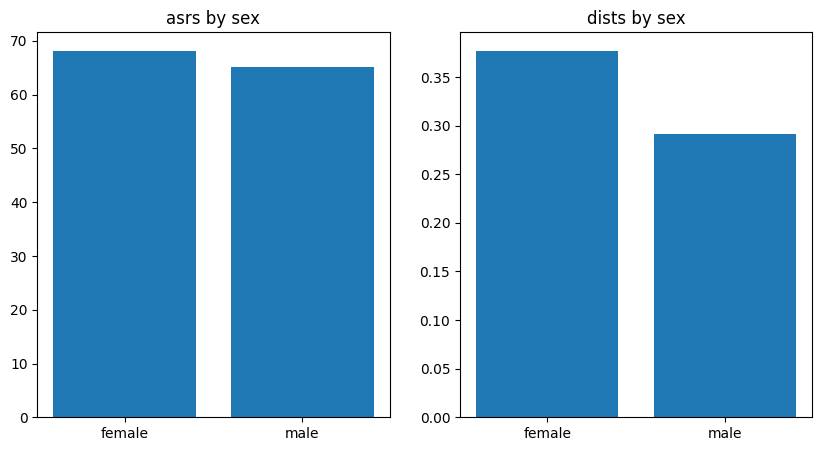

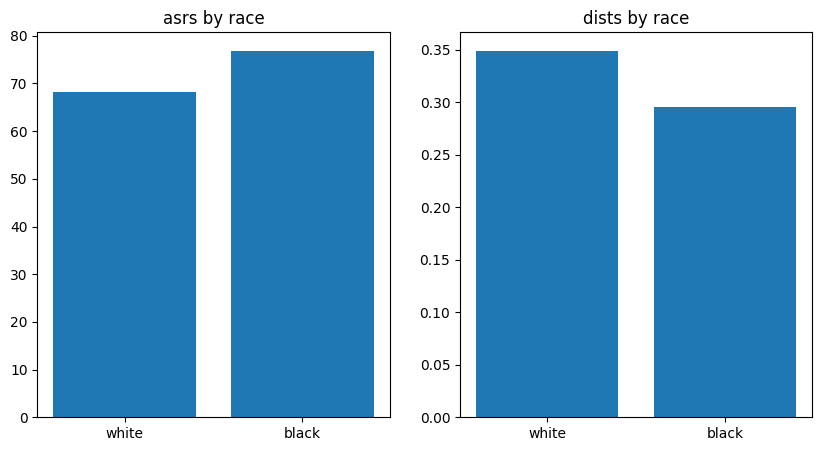

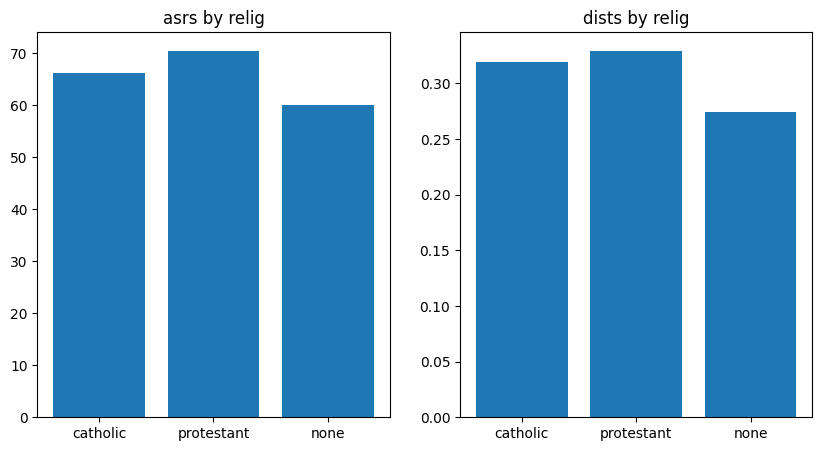

In [23]:
subgroup_columns = ['sex', 'race', 'relig']

# if 'att_enc' not in globals():
#     y_onehot, att_enc = model_utils.get_onehot(y.to_numpy().ravel().reshape(-1,1))
test_size = 0.5

x_n_tr, x_n_te, y_n_tr, y_n_te= train_test_split(X_neuron, y, test_size=test_size, random_state=42)
subgroup_disparity_dict = get_subgroup_disparity_baseline(ds, subgroup_columns, x_n_te, y_n_te, metric='auc')
print(subgroup_disparity_dict)
plot_subgroup_disparity(subgroup_disparity_dict)

In [ ]:
test_indices = np.arange(len(X_neuron))[np.isin(X_neuron, x_n_te)]

## Our attack with random data

In [ ]:
random_df = filter_random_data(ds, clf, num_samples=1000000)
X_random_neuron = make_neuron_output_data(random_df, clf, y_columns)
y_random = random_df[ds.ds.meta['sensitive_column'] + "_" + ds.ds.meta['sensitive_positive']]

In [ ]:
random_neuron_clf = model_utils.get_model(max_iter=500)
y_random_onehot = att_enc.transform(y_random.to_numpy().ravel().reshape(-1,1))
random_neuron_clf.fit(X_random_neuron, y_random_onehot)

In [ ]:
# test on the test data
acc = 100 * random_neuron_clf.score(x_n_te, att_enc.transform(y_n_te.to_numpy().ravel().reshape(-1,1)))
if True:
    print(f"Attack accuracy: {acc}")

In [ ]:
t1 = torch.from_numpy(X_train.iloc[0].to_numpy()).float().to(model_utils.device)
# out_1 = torch.relu(np.matmul(X_train.iloc[0].to_numpy(), clf.coefs_[0]) + clf.intercepts_[0])
out_1 = torch.relu(torch.matmul(t1, torch.from_numpy(clf.coefs_[0]).float().to(model_utils.device)) + torch.from_numpy(clf.intercepts_[0]).float().to(model_utils.device))
print(out_1)
out_2 = (np.matmul(out_1, clf.coefs_[1]) + clf.intercepts_[1])
print(out_2)